regular bayes between 20-2000

In [1]:
# General
import numpy as np
import pandas as pd
import os, sys
import optuna

# For data prep and pre-processing
from jumpmodels.utils import filter_date_range 
from jumpmodels.preprocess import StandardScalerPD, DataClipperStd
from sklearn.preprocessing import StandardScaler

# For model fit and prediction
from joblib import Parallel, delayed # allows parallel grid search on all 4 cores
from jumpmodels.sparse_jump import SparseJumpModel

# For plotting
from jumpmodels.plot import plot_regimes_and_cumret, plot_cumret
import matplotlib.pyplot as plt
import matplotlib as mpl    
mpl.rcParams["text.usetex"] = False


# Portfolio allocation
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.efficient_frontier import EfficientFrontier

#sys.path.append('/Users/victor/Documents/thesis_vri_vp/vic_new')         # for mac
sys.path.append('C:\\Users\\victo\\git_new\\thesis_vri_vp\\vic_new')      # for windows
from feature_set_v2 import MergedDataLoader 




In [2]:
# ---------------------------------------------------------------------
# 1) Purged/embargoed window function
# ---------------------------------------------------------------------
def get_train_val_windows(
        current_date, 
        full_data, 
        min_train_years=8,
        max_train_years=12, 
        val_years=3,
        initial_train_start=None,
        gap_days=3                                      # gap_days: number of days to exclude at the train/validation boundary (purge/embargo) to avoid look‑ahead; set to 0 to disable
    ):
    # 1) Validation window
    val_end   = current_date
    val_start = val_end - pd.DateOffset(years=val_years)
    
    # 2) Train ends just before validation
    train_end = val_start - pd.DateOffset(days=1)
    
    # 3) Max‐length training start
    train_start_candidate = train_end - pd.DateOffset(years=max_train_years)
    if initial_train_start is not None:
        earliest = pd.to_datetime(initial_train_start)
        train_start_candidate = max(train_start_candidate, earliest)
    
    # 4) Enforce min‐length
    if (train_end - train_start_candidate) < pd.Timedelta(days=365.25 * min_train_years):
        train_start_candidate = train_end - pd.DateOffset(years=min_train_years)
        if initial_train_start is not None:
            train_start_candidate = max(train_start_candidate, earliest)
    
    idx       = full_data.index
    train_idx = idx[(idx >= train_start_candidate) & (idx <= train_end)]
    val_idx   = idx[(idx >= val_start)           & (idx <= val_end)]
    
    # 5) Purge/embargo
    if gap_days > 0:
        if len(train_idx) > gap_days:
            train_idx = train_idx[:-gap_days]
        if len(val_idx)   > gap_days:
            val_idx   = val_idx[gap_days:]
    
    if train_idx.empty or val_idx.empty:
        raise ValueError(
            f"No data for train [{train_start_candidate.date()}-{train_end.date()}] "
            f"or val [{val_start.date()}-{val_end.date()}] after {gap_days}-day gap"
        )
    
    return train_idx[0], train_idx[-1], val_idx[0], val_idx[-1]


# ---------------------------------------------------------------------
# 2) Optuna objective & wrapper
# ---------------------------------------------------------------------
# 1) New evaluator that fits one model & returns Sharpe:
def evaluate_sjm_sharpe(
    lam, kappa,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")
    # online predict & PnL exactly as before:
    val_states = model.predict_online(X_vl_s)
    pnl = np.zeros(len(val_states))
    prev_pos = 0.0
    for t in range(len(val_states)):
        st = val_states.iloc[t]
        exp_ann = model.ret_[st] * 252
        # position rule:
        if exp_ann > annual_threshold: pos = 1.0
        elif exp_ann < -annual_threshold: pos = -1.0
        else: pos = exp_ann/annual_threshold
        pnl[t] = prev_pos * ar_vl.iloc[t] - abs(pos-prev_pos)*cost_per_100pct
        prev_pos = pos
    sharpe = pnl.mean()/pnl.std(ddof=1)*np.sqrt(252)
    return sharpe

# 2) Rewrite your Optuna objective to use it:
def optuna_objective(
    trial,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    lam   = trial.suggest_float("lambda", 10**1.3, 10**3.3)
    kappa = trial.suggest_int("kappa", 1, np.sqrt(17))
    return evaluate_sjm_sharpe(
        lam, kappa,
        X_tr_s, X_vl_s,
        ar_tr, ar_vl,
        cost_per_100pct, annual_threshold
    )

# 3) In your Bayesian wrapper, return the study:
def bayesian_hyperparam_search(
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct=0.0005,
    annual_threshold=0.05,
    n_trials=30
):
    study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=42), direction="maximize")
    study.optimize(
        lambda t: optuna_objective(
            t, X_tr_s, X_vl_s, ar_tr, ar_vl,
            cost_per_100pct, annual_threshold
        ),
        n_trials=n_trials
    )
    return study


# ---------------------------------------------------------------------
# 3) Rolling CV + final‑model fit using Optuna
# ---------------------------------------------------------------------
def rolling_time_series_cv_sjm_long_short_optimized(
    X_train, X_val,
    factor_returns_train, factor_returns_val,
    market_returns_train, market_returns_val,
    cost_per_100pct=0.0005,
    annual_threshold=0.05,
    n_trials=30
):
    # --- align indices & build active returns ---
    tr_idx = X_train.index.intersection(factor_returns_train.index).intersection(market_returns_train.index)
    vl_idx = X_val.index.intersection(factor_returns_val.index).intersection(market_returns_val.index)
    
    X_tr = X_train.loc[tr_idx]
    X_vl = X_val.loc[vl_idx]
    ar_tr = factor_returns_train.loc[tr_idx] - market_returns_train.loc[tr_idx]
    ar_vl = factor_returns_val.loc[vl_idx]     - market_returns_val.loc[vl_idx]
    
    # --- preprocess ---
    clipper = DataClipperStd(mul=3.0)
    scaler  = StandardScaler()
    
    X_tr_s = pd.DataFrame(
        scaler.fit_transform(clipper.fit_transform(X_tr)),
        index=X_tr.index, columns=X_tr.columns
    )
    X_vl_s = pd.DataFrame(
        scaler.transform(clipper.transform(X_vl)),
        index=X_vl.index, columns=X_vl.columns
    )
    
    # --- Bayesian search ---
    study = bayesian_hyperparam_search(
        X_tr_s, X_vl_s, ar_tr, ar_vl,
        cost_per_100pct, annual_threshold,
        n_trials
    )
    lam, kappa = study.best_params["lambda"], study.best_params["kappa"]
    best_sharpe = study.best_value
    print(f"Optuna best λ={lam:.4f}, κ={kappa}, Sharpe={best_sharpe:.4f}")
    
    # --- fit final SJM on the full train window ---
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")
    
    return {
        "best_lambda": lam,
        "best_kappa":  kappa,
        "best_sharpe": best_sharpe,
        "best_model":  model,
        "results_array": None,
        "study": study
    }

In [ ]:
# ---------------------------------------------------------------------
# 4) Updated cross‑validation module (run_cv)
# ---------------------------------------------------------------------
def run_cv(
    factors,
    factor_data_dict,
    cv_dates,
    *,
    min_train_years=8,
    max_train_years=12,
    val_years=3,
    initial_train_start=None,
    save_path="cv_params_bayes_20-2000.parquet",
    make_plots=True,
    cost_per_100pct=0.0005,
    annual_threshold=0.05,
    n_trials=30
):
    records = []
    evolution_plotbuf = []

    for cv_end in cv_dates:
        for fac in factors:
            X       = factor_data_dict[fac]["X"]
            fac_ret = factor_data_dict[fac]["fac_ret"]
            mkt_ret = factor_data_dict[fac]["mkt_ret"]

            # get purged train/val windows
            train_start, train_end, val_start, val_end = get_train_val_windows(
                cv_end, X,
                min_train_years=min_train_years,
                max_train_years=max_train_years,
                val_years=val_years,
                initial_train_start=initial_train_start,
                gap_days=3
            )

            # slice data
            X_train  = filter_date_range(X, train_start, train_end)
            X_val    = filter_date_range(X, val_start,   val_end)
            fr_train = filter_date_range(fac_ret, train_start, train_end)
            fr_val   = filter_date_range(fac_ret, val_start,   val_end)
            mr_train = filter_date_range(mkt_ret, train_start, train_end)
            mr_val   = filter_date_range(mkt_ret, val_start,   val_end)

            # run Optuna‐powered CV
            res = rolling_time_series_cv_sjm_long_short_optimized(
                X_train=X_train,
                X_val=X_val,
                factor_returns_train=fr_train,
                factor_returns_val=fr_val,
                market_returns_train=mr_train,
                market_returns_val=mr_val,
                cost_per_100pct=cost_per_100pct,
                annual_threshold=annual_threshold,
                n_trials=n_trials
            )

            # store results
            records.append({
                "date": cv_end,
                "factor": fac,
                "best_lambda": res["best_lambda"],
                "best_kappa":  res["best_kappa"]
            })
            evolution_plotbuf.append({
                "date": cv_end,
                "factor": fac,
                "lambda": res["best_lambda"],
                "kappa":  res["best_kappa"]
            })

            # per‐fold Optuna scatter plot
            if make_plots:
                trials = res["study"].trials
                df_t = pd.DataFrame([
                    {"lambda": t.params["lambda"],
                     "kappa":  t.params["kappa"],
                     "value":  t.value}
                    for t in trials
                ])
                plt.figure(figsize=(8,5))
                sc = plt.scatter(
                    df_t["lambda"],
                    df_t["value"],
                    c=df_t["kappa"].astype(float),
                    cmap="viridis",
                    alpha=0.8
                )
                plt.xscale("log")
                plt.axvline(res["best_lambda"], ls="--", c="r", alpha=0.6)
                plt.colorbar(sc, label='$\\kappa$')
                plt.xlabel("'$\\lambda$' (log scale)")
                plt.ylabel("Validation Sharpe")
                plt.title(f"{fac} | CV cutoff {cv_end.date()} - Optuna trials")
                plt.grid(True, ls=":")
                plt.tight_layout()
                plt.show()

    # assemble and save
    cv_df = pd.DataFrame(records).sort_values(["factor", "date"])
    if save_path:
        cv_df.to_parquet(save_path)

    # overall λ/κ evolution
    if make_plots:
        evo = pd.DataFrame(evolution_plotbuf)
        for fac in factors:
            sub = evo[evo["factor"] == fac].sort_values("date")
            fig, ax1 = plt.subplots(figsize=(9,5))
            ax1.plot(sub["date"], sub["lambda"], marker="o", label='$\\lambda$')
            ax1.set_ylabel('$\\lambda$', color="tab:blue")
            ax1.tick_params(axis='y', labelcolor='tab:blue')
            ax2 = ax1.twinx()
            ax2.plot(sub["date"], sub["kappa"], marker="x", ls="--", color="tab:red", label='$\\kappa$')
            ax2.set_ylabel('$\\kappa$', color="tab:red")
            ax2.tick_params(axis='y', labelcolor='tab:red')
            ax1.set_xlabel("CV end-date")
            ax1.set_title(f"{fac} — hyperparameter evolution")
            ax1.grid(True, ls=":")
            ax1.legend(loc="upper left")
            ax2.legend(loc="upper right")
            plt.tight_layout()
            plt.show()

    return cv_df


[I 2025-04-25 15:10:55,765] A new study created in memory with name: no-name-6194da87-7cda-4648-90a5-1058a3689776
[I 2025-04-25 15:10:56,594] Trial 0 finished with value: 0.05995829038622425 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.05995829038622425.
[I 2025-04-25 15:10:57,094] Trial 1 finished with value: 0.05995829038622425 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.05995829038622425.
[I 2025-04-25 15:10:58,980] Trial 2 finished with value: -0.331840150097618 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.05995829038622425.
[I 2025-04-25 15:11:03,205] Trial 3 finished with value: 0.175393187318902 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.175393187318902.
[I 2025-04-25 15:11:03,720] Trial 4 finished with value: 0.05995829038622425 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tria

Optuna best λ=134.6857, κ=4, Sharpe=0.1754


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


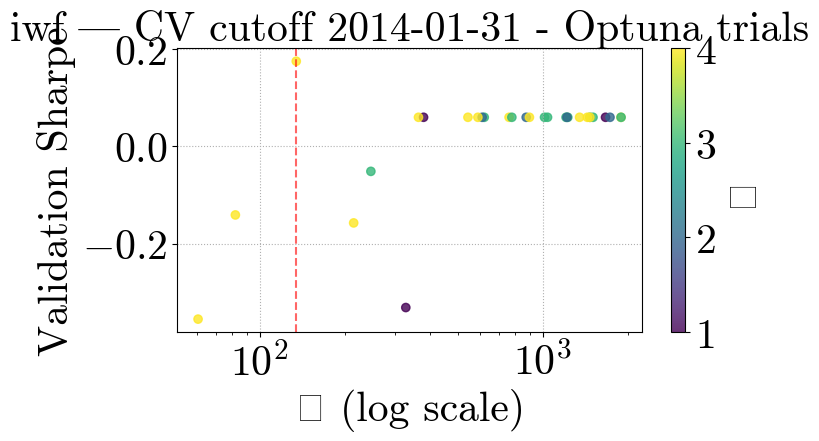

[I 2025-04-25 15:11:59,880] A new study created in memory with name: no-name-20e3ecf4-e2c5-45fb-8fb1-a7384f6b3da3
[I 2025-04-25 15:12:02,605] Trial 0 finished with value: 0.7827096683047519 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.7827096683047519.
[I 2025-04-25 15:12:03,129] Trial 1 finished with value: 0.7827096683047515 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.7827096683047519.
[I 2025-04-25 15:12:04,718] Trial 2 finished with value: 0.7827096683047519 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.7827096683047519.
[I 2025-04-25 15:12:08,654] Trial 3 finished with value: 0.6534307213293168 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.7827096683047519.
[I 2025-04-25 15:12:09,199] Trial 4 finished with value: 0.7827096683047515 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 

Optuna best λ=60.6134, κ=4, Sharpe=0.9877


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


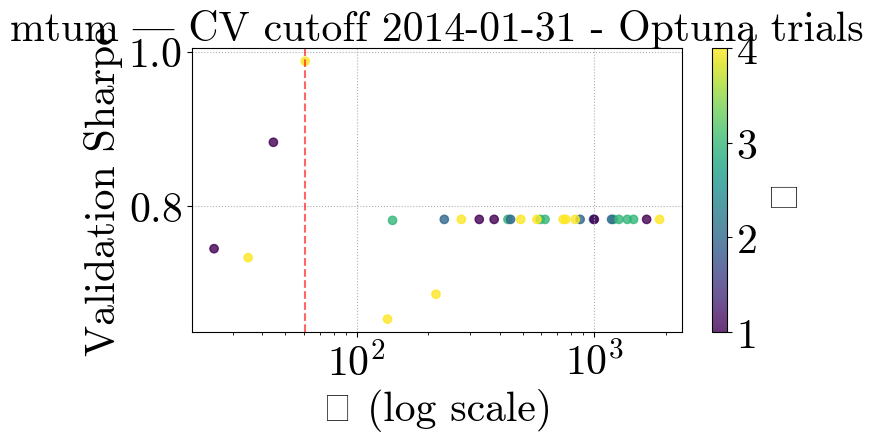

[I 2025-04-25 15:13:15,549] A new study created in memory with name: no-name-b5f28e78-035c-41e7-9fd1-9a8868e8e33c
[I 2025-04-25 15:13:17,727] Trial 0 finished with value: -0.7051459996095151 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.7051459996095151.
[I 2025-04-25 15:13:18,326] Trial 1 finished with value: 0.6936464858203581 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.6936464858203581.
[I 2025-04-25 15:13:19,857] Trial 2 finished with value: -0.705145999609515 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.6936464858203581.
[I 2025-04-25 15:13:23,028] Trial 3 finished with value: -0.215285183380227 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.6936464858203581.
[I 2025-04-25 15:13:23,626] Trial 4 finished with value: 0.6936464858203581 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 

Optuna best λ=1465.8674, κ=3, Sharpe=0.6936


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


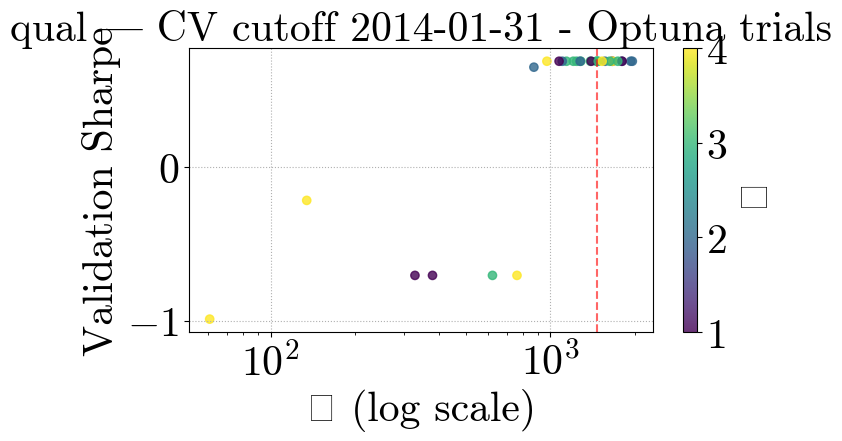

[I 2025-04-25 15:13:49,343] A new study created in memory with name: no-name-2b1d2279-f806-4915-928b-55a22ddf88d6
[I 2025-04-25 15:13:51,543] Trial 0 finished with value: -0.5051311952207044 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.5051311952207044.
[I 2025-04-25 15:13:52,114] Trial 1 finished with value: -0.5051311952207044 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.5051311952207044.
[I 2025-04-25 15:13:53,833] Trial 2 finished with value: -0.5051311952207044 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.5051311952207044.
[I 2025-04-25 15:13:58,631] Trial 3 finished with value: -0.10126768427986821 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: -0.10126768427986821.
[I 2025-04-25 15:13:59,258] Trial 4 finished with value: -0.5051311952207044 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=33.4241, κ=4, Sharpe=0.1493


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


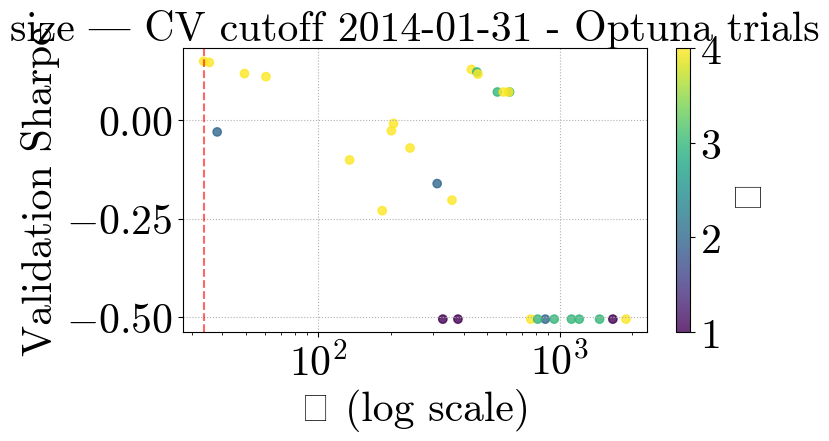

[I 2025-04-25 15:15:20,689] A new study created in memory with name: no-name-2e7be4cd-99b4-4da9-90e1-dd58489b21a8
[I 2025-04-25 15:15:24,624] Trial 0 finished with value: -0.3390872626211194 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.3390872626211194.
[I 2025-04-25 15:15:25,119] Trial 1 finished with value: -0.33908726262111955 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.3390872626211194.
[I 2025-04-25 15:15:27,167] Trial 2 finished with value: -0.33908726262111943 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.3390872626211194.
[I 2025-04-25 15:15:34,259] Trial 3 finished with value: -0.0808162149227586 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: -0.0808162149227586.
[I 2025-04-25 15:15:34,783] Trial 4 finished with value: -0.33908726262111955 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best

Optuna best λ=26.7771, κ=3, Sharpe=0.1111


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


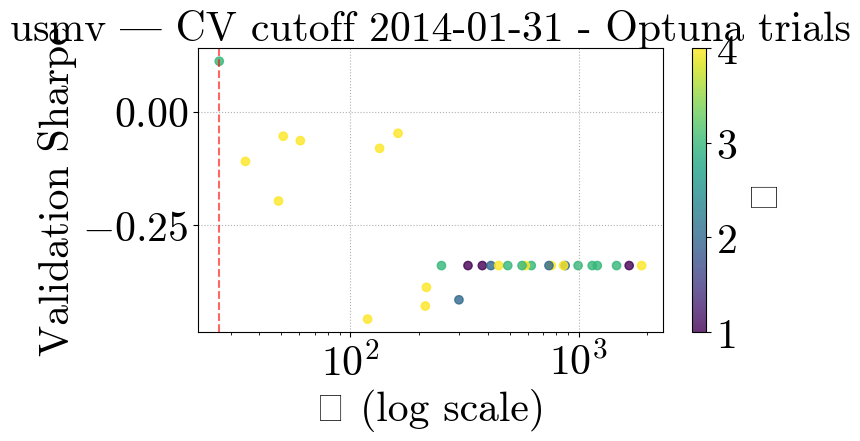

[I 2025-04-25 15:17:05,905] A new study created in memory with name: no-name-6e71346e-1877-40a3-9764-6b1ba514739e
[I 2025-04-25 15:17:08,263] Trial 0 finished with value: 0.3369556491762679 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.3369556491762679.
[I 2025-04-25 15:17:08,858] Trial 1 finished with value: 0.5751376244820043 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.5751376244820043.
[I 2025-04-25 15:17:10,751] Trial 2 finished with value: 0.3903989538798258 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.5751376244820043.
[I 2025-04-25 15:17:15,414] Trial 3 finished with value: 1.0306500344807883 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 1.0306500344807883.
[I 2025-04-25 15:17:15,908] Trial 4 finished with value: 0.5751376244820043 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 3 

Optuna best λ=134.6857, κ=4, Sharpe=1.0307


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


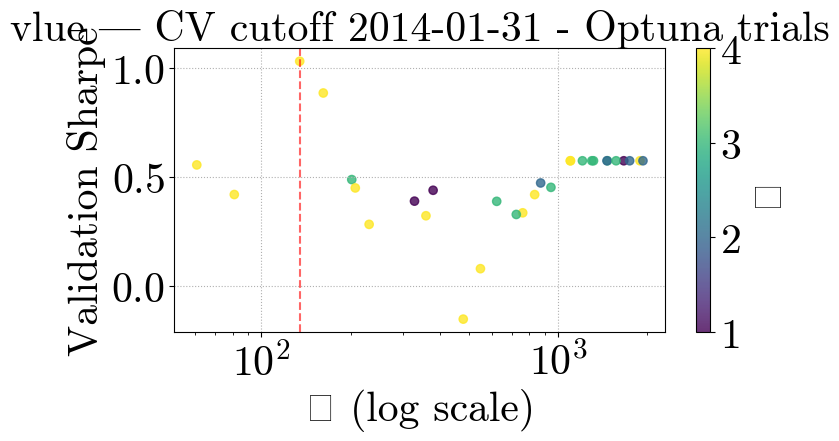

[I 2025-04-25 15:18:15,453] A new study created in memory with name: no-name-a9b5ad6d-0ce2-43b7-85c6-3edce2c20b53
[I 2025-04-25 15:18:19,196] Trial 0 finished with value: -0.09370665674736818 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.09370665674736818.
[I 2025-04-25 15:18:19,761] Trial 1 finished with value: -0.36716261054186333 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.09370665674736818.
[I 2025-04-25 15:18:21,538] Trial 2 finished with value: -0.20466032299709513 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.09370665674736818.
[I 2025-04-25 15:18:26,792] Trial 3 finished with value: 0.12678407311702158 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.12678407311702158.
[I 2025-04-25 15:18:27,389] Trial 4 finished with value: -0.36716261054186333 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. 

Optuna best λ=134.6857, κ=4, Sharpe=0.1268


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


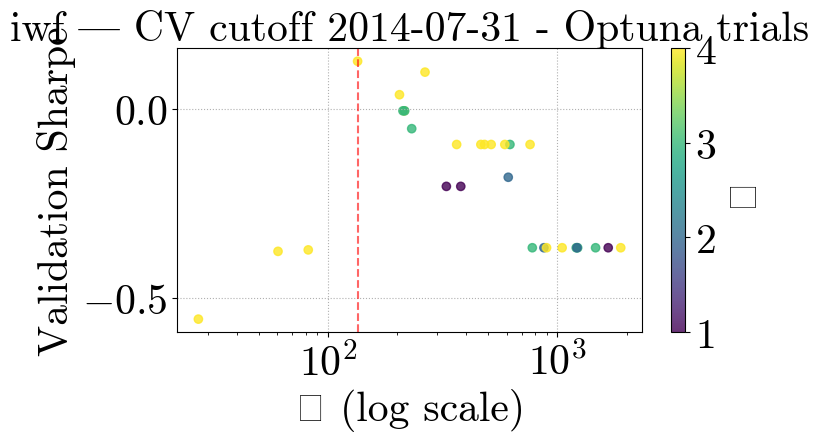

[I 2025-04-25 15:20:00,553] A new study created in memory with name: no-name-e8661f9c-60b7-41f5-8824-23fab0d02404
[I 2025-04-25 15:20:03,488] Trial 0 finished with value: 0.4641351425437372 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.4641351425437372.
[I 2025-04-25 15:20:04,124] Trial 1 finished with value: 0.4172196430809937 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.4641351425437372.
[I 2025-04-25 15:20:06,040] Trial 2 finished with value: 0.48385063465037215 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.48385063465037215.
[I 2025-04-25 15:20:11,624] Trial 3 finished with value: 0.42475899644610565 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.48385063465037215.
[I 2025-04-25 15:20:12,269] Trial 4 finished with value: 0.4172196430809937 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tria

Optuna best λ=328.1378, κ=1, Sharpe=0.4839


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


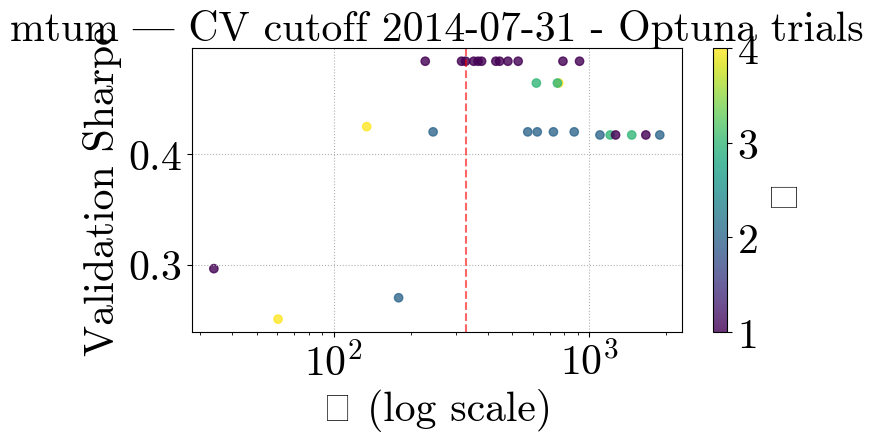

[I 2025-04-25 15:21:13,198] A new study created in memory with name: no-name-7990b3a2-b38a-416c-8567-17d9ed683f90
[I 2025-04-25 15:21:15,226] Trial 0 finished with value: 0.10031476492788659 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.10031476492788659.
[I 2025-04-25 15:21:15,830] Trial 1 finished with value: -0.024890740647675456 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.10031476492788659.
[I 2025-04-25 15:21:17,695] Trial 2 finished with value: 0.007360981800509541 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.10031476492788659.
[I 2025-04-25 15:21:22,264] Trial 3 finished with value: 0.25382697686785155 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.25382697686785155.
[I 2025-04-25 15:21:22,809] Trial 4 finished with value: -0.024890740647675456 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Be

Optuna best λ=190.2731, κ=3, Sharpe=0.3286


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


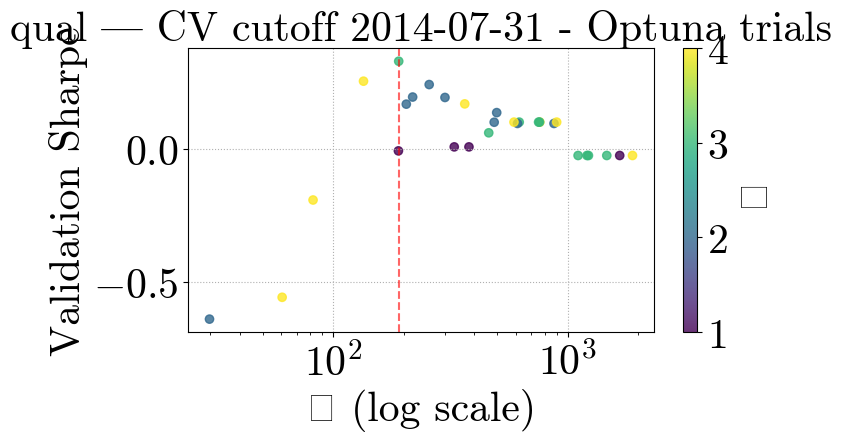

[I 2025-04-25 15:22:41,198] A new study created in memory with name: no-name-e9fae4e6-2109-4fe0-be97-3b3d8b2b1bb9
[I 2025-04-25 15:22:44,239] Trial 0 finished with value: 0.02827910171030723 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.02827910171030723.
[I 2025-04-25 15:22:44,963] Trial 1 finished with value: -0.5136727625110139 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.02827910171030723.
[I 2025-04-25 15:22:46,817] Trial 2 finished with value: -0.09013341124475621 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.02827910171030723.
[I 2025-04-25 15:22:55,289] Trial 3 finished with value: -0.00548245675609324 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.02827910171030723.
[I 2025-04-25 15:22:56,104] Trial 4 finished with value: -0.5136727625110139 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=522.3993, κ=4, Sharpe=0.3256


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


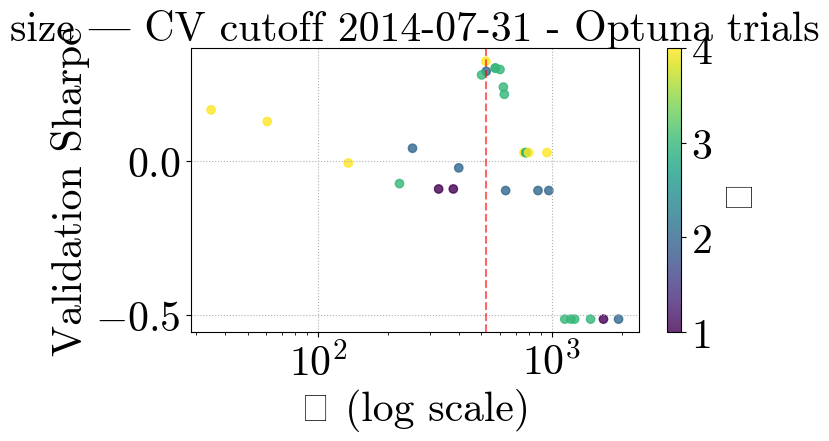

[I 2025-04-25 15:24:22,416] A new study created in memory with name: no-name-7d0f1575-7650-49b6-a60d-bd78369f8301
[I 2025-04-25 15:24:24,547] Trial 0 finished with value: 0.30445916043632265 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.30445916043632265.
[I 2025-04-25 15:24:25,113] Trial 1 finished with value: -0.0019932022978737915 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.30445916043632265.
[I 2025-04-25 15:24:26,815] Trial 2 finished with value: 0.40279310604273966 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.40279310604273966.
[I 2025-04-25 15:24:33,602] Trial 3 finished with value: 0.17854507630609967 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.40279310604273966.
[I 2025-04-25 15:24:34,295] Trial 4 finished with value: -0.0019932022978737915 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. B

Optuna best λ=574.5425, κ=2, Sharpe=0.5592


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


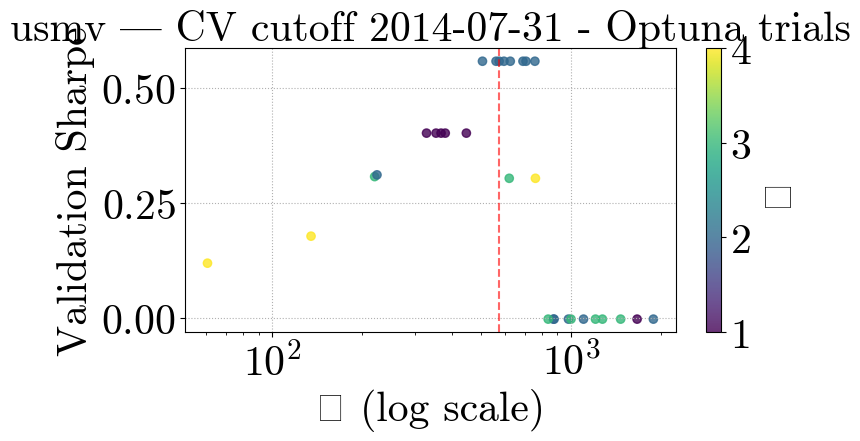

[I 2025-04-25 15:25:33,000] A new study created in memory with name: no-name-d8f0c1f3-4439-4d13-b8cb-bdab24a1f987
[I 2025-04-25 15:25:36,105] Trial 0 finished with value: 1.4405587035348686 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.4405587035348686.
[I 2025-04-25 15:25:36,706] Trial 1 finished with value: 1.2827824878559244 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.4405587035348686.
[I 2025-04-25 15:25:38,402] Trial 2 finished with value: 1.390873142085844 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 1.4405587035348686.
[I 2025-04-25 15:25:41,652] Trial 3 finished with value: 1.2110796745500831 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 1.4405587035348686.
[I 2025-04-25 15:25:42,226] Trial 4 finished with value: 1.2827824878559244 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 w

Optuna best λ=828.2276, κ=1, Sharpe=1.4772


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


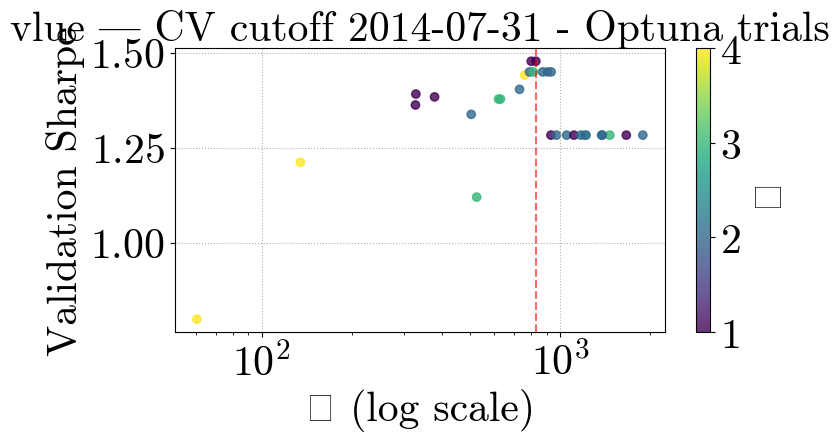

[I 2025-04-25 15:26:28,749] A new study created in memory with name: no-name-fad9fa6d-df8f-48ee-a0a6-0f827f7311f7
[I 2025-04-25 15:26:29,489] Trial 0 finished with value: -0.21601601998184541 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.21601601998184541.
[I 2025-04-25 15:26:30,155] Trial 1 finished with value: -0.21601601998184541 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.21601601998184541.
[I 2025-04-25 15:26:32,142] Trial 2 finished with value: 0.2000692376133593 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.2000692376133593.
[I 2025-04-25 15:26:37,771] Trial 3 finished with value: -0.19360383470193998 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.2000692376133593.
[I 2025-04-25 15:26:38,457] Trial 4 finished with value: -0.21601601998184541 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best

Optuna best λ=723.9656, κ=2, Sharpe=0.6035


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


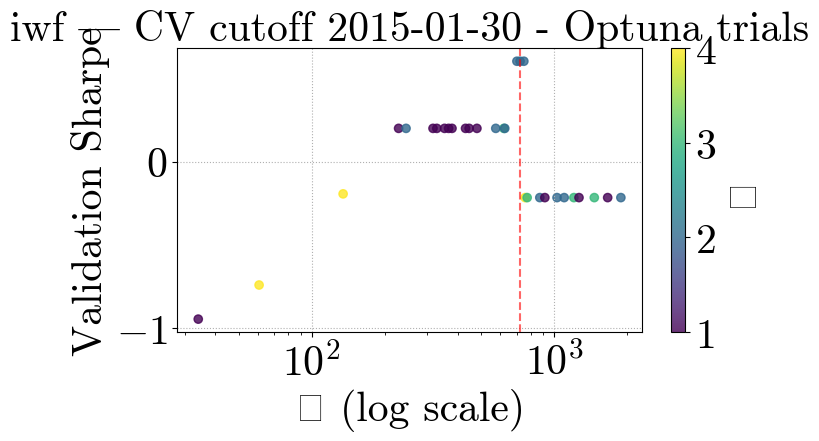

[I 2025-04-25 15:27:36,678] A new study created in memory with name: no-name-7d01fc1b-7fa3-4163-9548-cddf20568632
[I 2025-04-25 15:27:39,924] Trial 0 finished with value: 1.0152491590926487 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.0152491590926487.
[I 2025-04-25 15:27:40,589] Trial 1 finished with value: 1.0152491590926485 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.0152491590926487.
[I 2025-04-25 15:27:42,475] Trial 2 finished with value: 1.0152491590926485 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 1.0152491590926487.
[I 2025-04-25 15:27:48,863] Trial 3 finished with value: 1.0152491590926487 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 1.0152491590926487.
[I 2025-04-25 15:27:49,553] Trial 4 finished with value: 1.0152491590926485 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 

Optuna best λ=873.1778, κ=2, Sharpe=1.0152


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


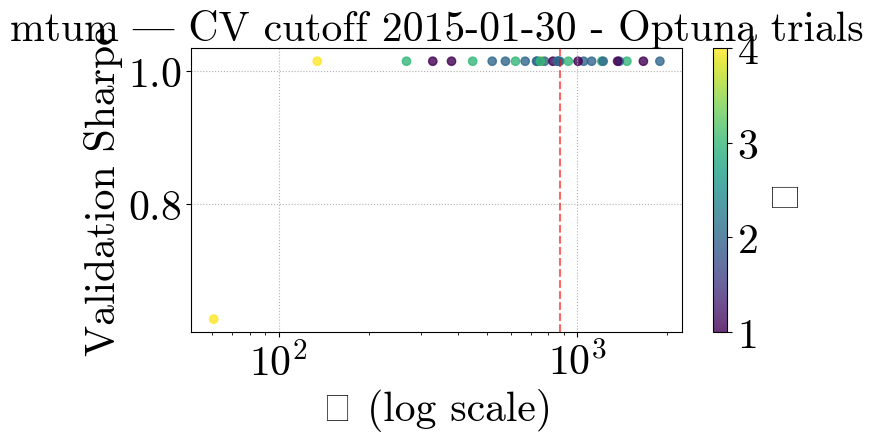

[I 2025-04-25 15:28:47,049] A new study created in memory with name: no-name-83e7dd3a-9307-4f33-b698-ffc761cfd0c9
[I 2025-04-25 15:28:49,493] Trial 0 finished with value: -0.2762047665301636 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.2762047665301636.
[I 2025-04-25 15:28:50,153] Trial 1 finished with value: 0.261774730495612 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.261774730495612.
[I 2025-04-25 15:28:52,211] Trial 2 finished with value: 0.2617747304956118 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.261774730495612.
[I 2025-04-25 15:28:57,551] Trial 3 finished with value: -0.2762047665301638 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.261774730495612.
[I 2025-04-25 15:28:58,266] Trial 4 finished with value: 0.261774730495612 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 1 wi

Optuna best λ=1465.8674, κ=3, Sharpe=0.2618


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


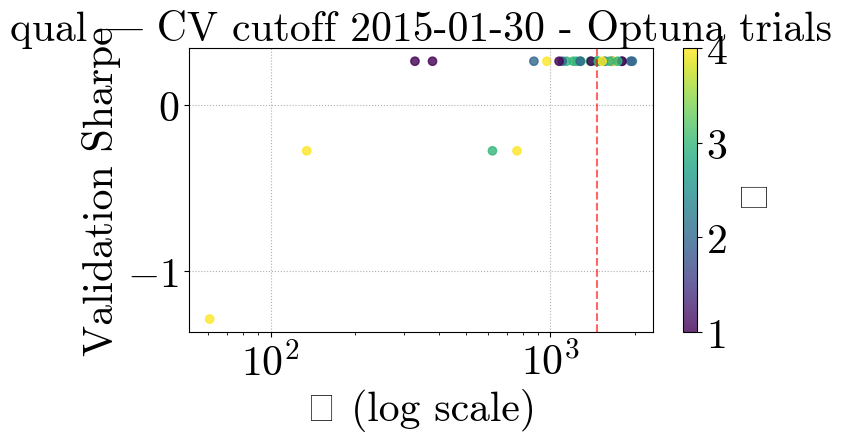

[I 2025-04-25 15:29:26,447] A new study created in memory with name: no-name-88fe8101-03c7-48c8-93fe-9dec061ae99c
[I 2025-04-25 15:29:30,044] Trial 0 finished with value: -0.6047774817101187 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.6047774817101187.
[I 2025-04-25 15:29:30,622] Trial 1 finished with value: -0.6047774817101186 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: -0.6047774817101186.
[I 2025-04-25 15:29:32,894] Trial 2 finished with value: -0.6047774817101187 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: -0.6047774817101186.
[I 2025-04-25 15:29:38,500] Trial 3 finished with value: -0.47094302753265543 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: -0.47094302753265543.
[I 2025-04-25 15:29:39,108] Trial 4 finished with value: -0.6047774817101186 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=48.6284, κ=4, Sharpe=-0.0175


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


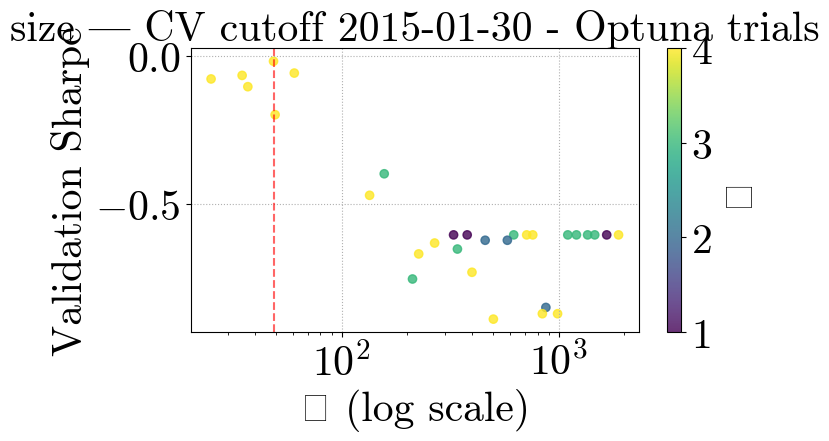

[I 2025-04-25 15:31:26,115] A new study created in memory with name: no-name-f5fcef1c-7c16-49a7-a478-317fb46fda75
[I 2025-04-25 15:31:29,122] Trial 0 finished with value: -0.18654827454814848 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.18654827454814848.
[I 2025-04-25 15:31:29,724] Trial 1 finished with value: 0.17981935978456773 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.17981935978456773.
[I 2025-04-25 15:31:32,100] Trial 2 finished with value: -0.18654827454814854 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.17981935978456773.
[I 2025-04-25 15:31:38,281] Trial 3 finished with value: -0.6631579710426979 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.17981935978456773.
[I 2025-04-25 15:31:38,930] Trial 4 finished with value: 0.17981935978456773 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best

Optuna best λ=1465.8674, κ=3, Sharpe=0.1798


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


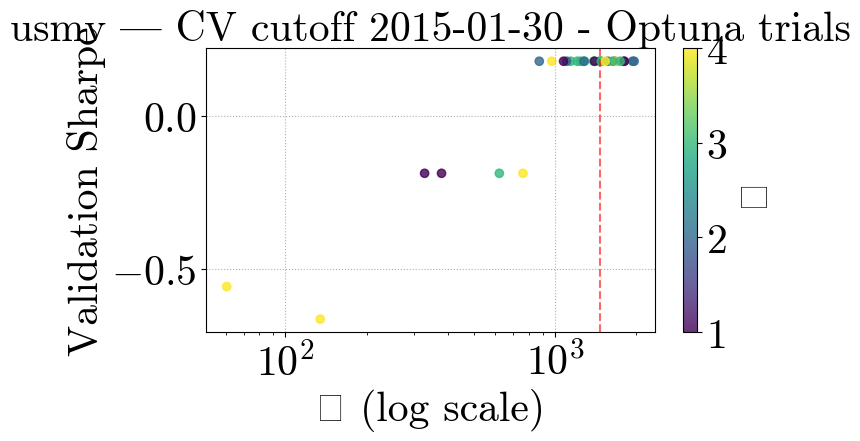

[I 2025-04-25 15:32:05,920] A new study created in memory with name: no-name-0c470f85-03c5-44b8-960a-32dc17de0e83
[I 2025-04-25 15:32:08,624] Trial 0 finished with value: 1.2941251524558273 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.2941251524558273.
[I 2025-04-25 15:32:09,269] Trial 1 finished with value: 1.2816024993784367 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.2941251524558273.
[I 2025-04-25 15:32:11,500] Trial 2 finished with value: 1.2816024993784367 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 1.2941251524558273.
[I 2025-04-25 15:32:15,750] Trial 3 finished with value: 0.9002819844732812 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 1.2941251524558273.
[I 2025-04-25 15:32:16,613] Trial 4 finished with value: 1.2816024993784367 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 

Optuna best λ=759.7853, κ=4, Sharpe=1.2941


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


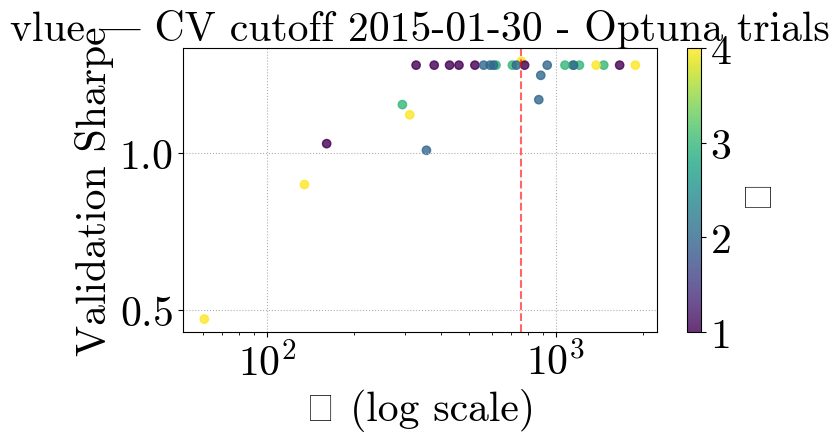

[I 2025-04-25 15:33:23,686] A new study created in memory with name: no-name-e2bc01b9-7851-451f-b0f3-e2f5f1917332
[I 2025-04-25 15:33:24,598] Trial 0 finished with value: 0.28631230311071704 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.28631230311071704.
[I 2025-04-25 15:33:25,746] Trial 1 finished with value: 0.28631230311071704 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.28631230311071704.
[I 2025-04-25 15:33:28,449] Trial 2 finished with value: -0.30305625790398877 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.28631230311071704.
[I 2025-04-25 15:33:35,599] Trial 3 finished with value: -0.8547904402982957 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.28631230311071704.
[I 2025-04-25 15:33:36,213] Trial 4 finished with value: 0.28631230311071704 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best i

Optuna best λ=759.7853, κ=4, Sharpe=0.2863


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


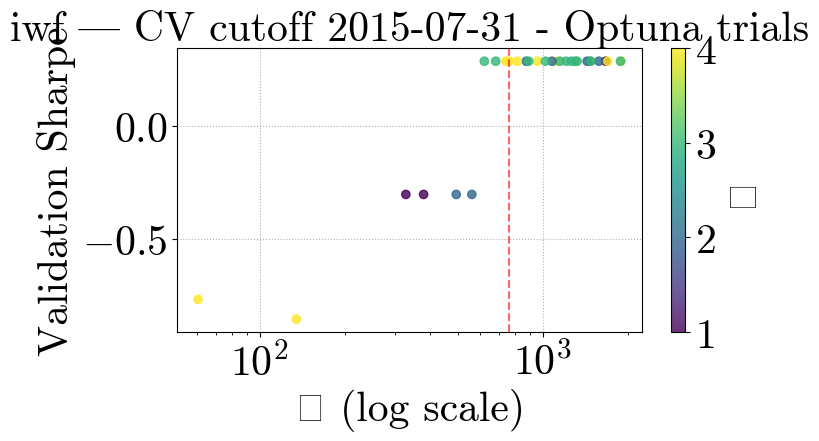

[I 2025-04-25 15:34:17,978] A new study created in memory with name: no-name-b75c47e4-403f-4046-aa4d-ed001cc084f8
[I 2025-04-25 15:34:21,684] Trial 0 finished with value: 1.003386879140439 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.003386879140439.
[I 2025-04-25 15:34:22,482] Trial 1 finished with value: 1.003386879140439 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.003386879140439.
[I 2025-04-25 15:34:24,701] Trial 2 finished with value: 1.0033868791404392 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 1.0033868791404392.
[I 2025-04-25 15:34:31,754] Trial 3 finished with value: 1.003386879140439 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 1.0033868791404392.
[I 2025-04-25 15:34:32,455] Trial 4 finished with value: 1.003386879140439 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 2 with v

Optuna best λ=328.1378, κ=1, Sharpe=1.0034


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


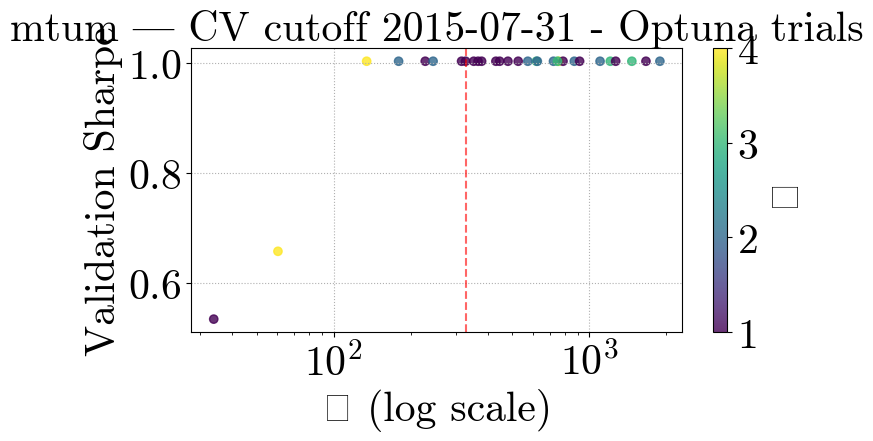

[I 2025-04-25 15:35:39,970] A new study created in memory with name: no-name-1a30faf1-bb7f-42b8-8c0a-f668d0bd0ce4
[I 2025-04-25 15:35:43,274] Trial 0 finished with value: -0.47591462793380285 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.47591462793380285.
[I 2025-04-25 15:35:43,916] Trial 1 finished with value: 0.46120341910232227 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.46120341910232227.
[I 2025-04-25 15:35:46,352] Trial 2 finished with value: 0.46120341910232243 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.46120341910232243.
[I 2025-04-25 15:35:52,322] Trial 3 finished with value: -0.47591462793380274 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.46120341910232243.
[I 2025-04-25 15:35:53,004] Trial 4 finished with value: 0.46120341910232227 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best

Optuna best λ=328.1378, κ=1, Sharpe=0.4612


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


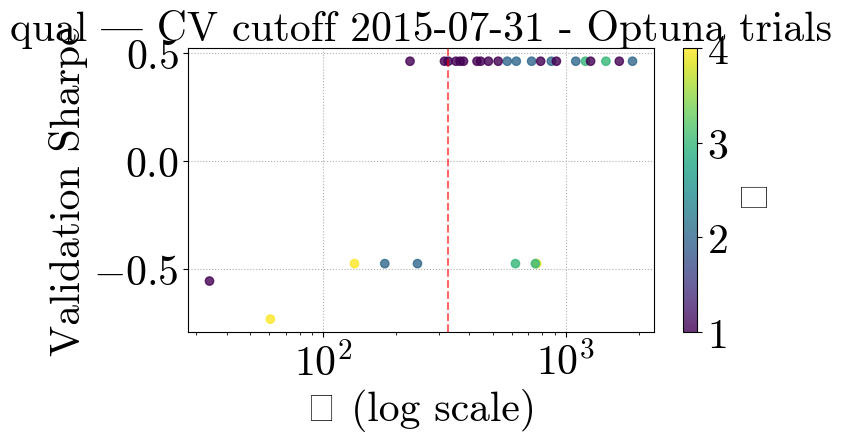

[I 2025-04-25 15:37:09,559] A new study created in memory with name: no-name-a5cbba72-3a2d-480a-9291-85492b7e8175
[I 2025-04-25 15:37:12,055] Trial 0 finished with value: -0.40737627462697024 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.40737627462697024.
[I 2025-04-25 15:37:12,758] Trial 1 finished with value: -0.30962056962476997 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: -0.30962056962476997.
[I 2025-04-25 15:37:14,790] Trial 2 finished with value: -0.3096205696247698 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.3096205696247698.
[I 2025-04-25 15:37:19,555] Trial 3 finished with value: 0.02291992812260307 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.02291992812260307.
[I 2025-04-25 15:37:20,281] Trial 4 finished with value: -0.30962056962476997 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Be

Optuna best λ=48.6284, κ=4, Sharpe=0.2147


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


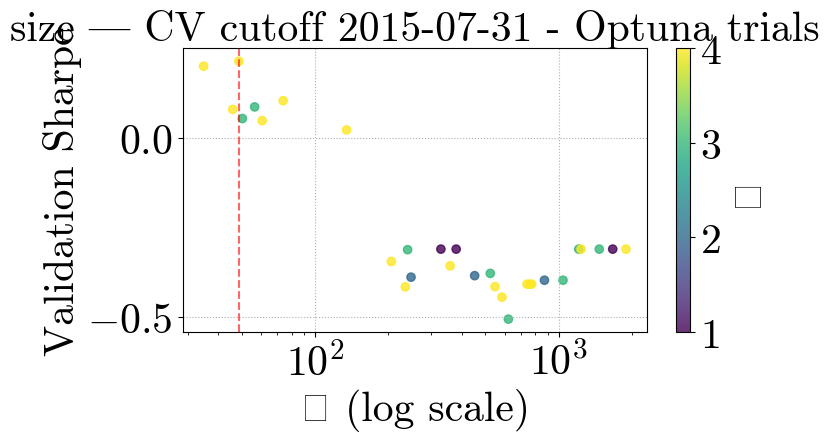

[I 2025-04-25 15:38:59,174] A new study created in memory with name: no-name-39e3705d-3a32-430b-be99-dcb9b4f9ff8f
[I 2025-04-25 15:39:02,660] Trial 0 finished with value: -0.6980350158152185 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.6980350158152185.
[I 2025-04-25 15:39:03,381] Trial 1 finished with value: -0.1975120255390529 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: -0.1975120255390529.
[I 2025-04-25 15:39:05,456] Trial 2 finished with value: 0.1901463078095931 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.1901463078095931.
[I 2025-04-25 15:39:09,984] Trial 3 finished with value: -0.5200395798246311 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.1901463078095931.
[I 2025-04-25 15:39:10,723] Trial 4 finished with value: -0.1975120255390529 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tr

Optuna best λ=634.9561, κ=2, Sharpe=0.1901


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


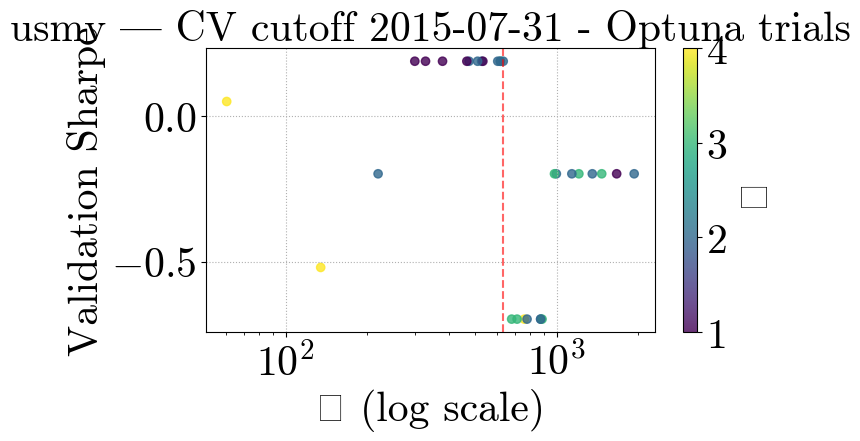

[I 2025-04-25 15:40:24,917] A new study created in memory with name: no-name-e7dc7cb2-12f9-4a5b-b163-51519f856194
[I 2025-04-25 15:40:27,633] Trial 0 finished with value: 1.4486721535632927 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.4486721535632927.
[I 2025-04-25 15:40:28,225] Trial 1 finished with value: 1.4486721535632925 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.4486721535632927.
[I 2025-04-25 15:40:30,149] Trial 2 finished with value: 1.4486721535632927 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 1.4486721535632927.
[I 2025-04-25 15:40:33,497] Trial 3 finished with value: 1.3712625697909298 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 1.4486721535632927.
[I 2025-04-25 15:40:34,158] Trial 4 finished with value: 1.4486721535632925 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 

Optuna best λ=759.7853, κ=4, Sharpe=1.4487


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


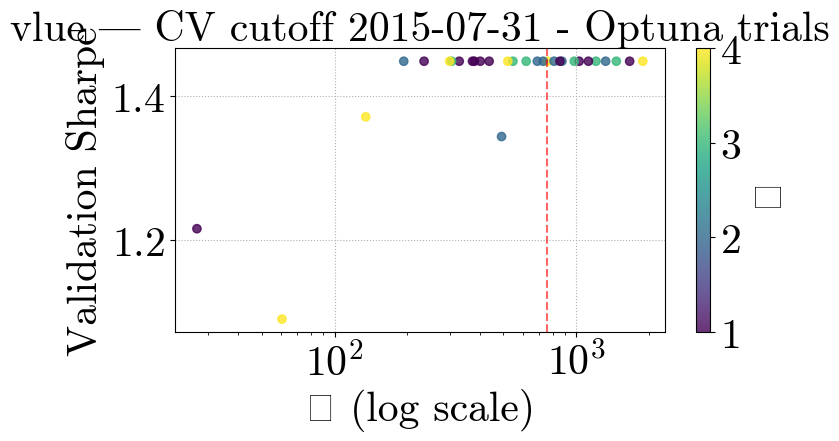

[I 2025-04-25 15:41:30,281] A new study created in memory with name: no-name-2a507e88-13c5-4479-b82f-cd3439417ea9
[I 2025-04-25 15:41:30,940] Trial 0 finished with value: -0.8804413954918748 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.8804413954918748.
[I 2025-04-25 15:41:31,499] Trial 1 finished with value: -0.8804413954918748 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.8804413954918748.
[I 2025-04-25 15:41:33,243] Trial 2 finished with value: -0.8804413954918747 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.8804413954918747.
[I 2025-04-25 15:41:38,313] Trial 3 finished with value: -0.8924482539367365 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: -0.8804413954918747.
[I 2025-04-25 15:41:38,886] Trial 4 finished with value: -0.8804413954918748 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=26.7480, κ=2, Sharpe=-0.0361


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


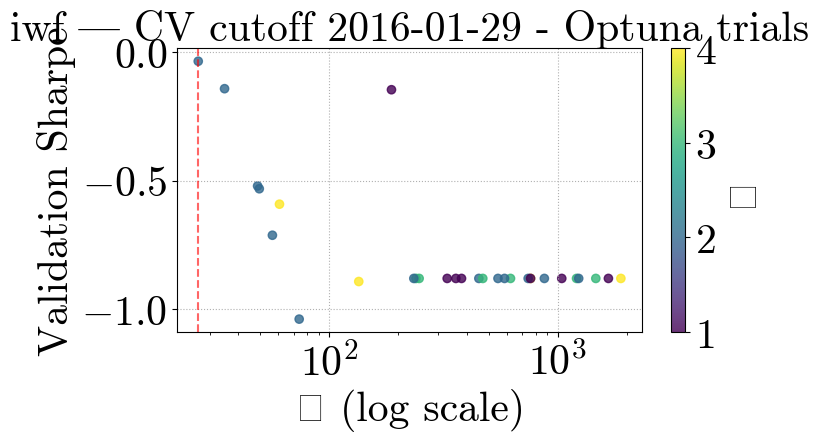

[I 2025-04-25 15:43:30,803] A new study created in memory with name: no-name-a8aa3a11-59d4-439a-a113-82d2dc43d6e5
[I 2025-04-25 15:43:33,631] Trial 0 finished with value: 1.5251661444893583 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.5251661444893583.
[I 2025-04-25 15:43:34,220] Trial 1 finished with value: 1.5251661444893585 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 1.5251661444893585.
[I 2025-04-25 15:43:35,987] Trial 2 finished with value: 1.5251661444893583 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 1.5251661444893585.
[I 2025-04-25 15:43:42,264] Trial 3 finished with value: 1.6863855754183212 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 1.6863855754183212.
[I 2025-04-25 15:43:42,881] Trial 4 finished with value: 1.5251661444893585 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 3 

Optuna best λ=134.6857, κ=4, Sharpe=1.6864


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


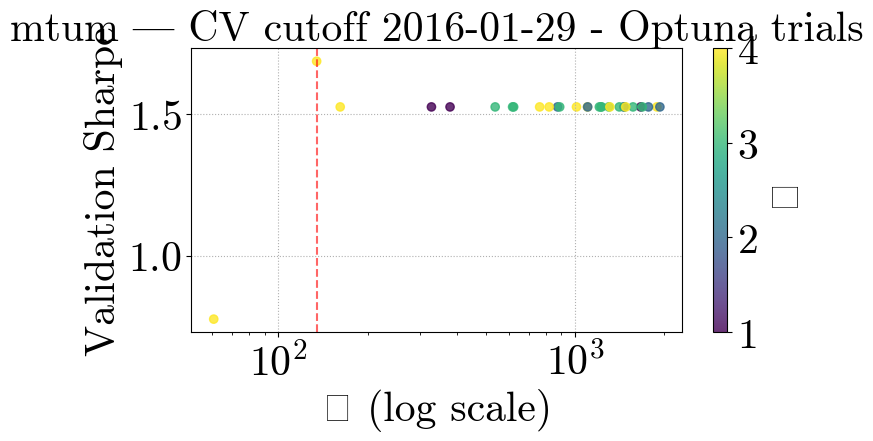

[I 2025-04-25 15:44:38,302] A new study created in memory with name: no-name-5ca3d83c-8a56-4293-b29f-ea4ff595b098
[I 2025-04-25 15:44:40,765] Trial 0 finished with value: -1.300439988457772 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -1.300439988457772.
[I 2025-04-25 15:44:41,387] Trial 1 finished with value: 1.2868834009854875 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 1.2868834009854875.
[I 2025-04-25 15:44:43,383] Trial 2 finished with value: 0.7071757636941871 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 1.2868834009854875.
[I 2025-04-25 15:44:49,080] Trial 3 finished with value: -0.08504951906340018 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 1.2868834009854875.
[I 2025-04-25 15:44:49,733] Trial 4 finished with value: 1.2868834009854875 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 

Optuna best λ=1465.8674, κ=3, Sharpe=1.2869


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


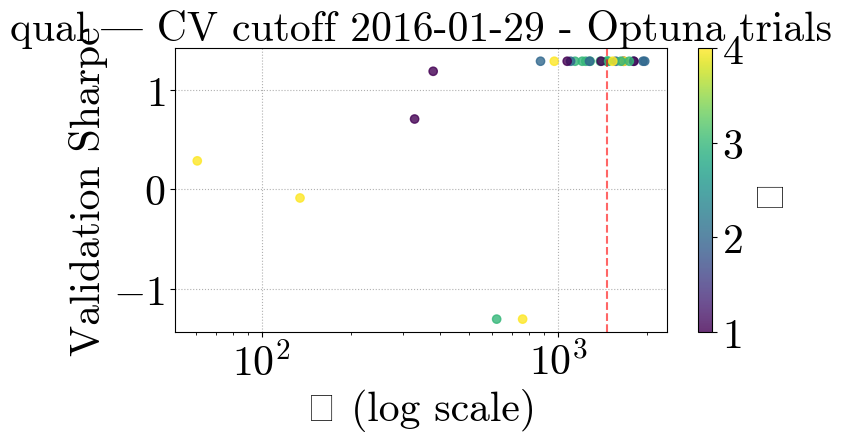

[I 2025-04-25 15:45:25,348] A new study created in memory with name: no-name-5eb91e01-29ba-4ebd-bbb0-bcb70db0a8df
[I 2025-04-25 15:45:29,651] Trial 0 finished with value: -0.5227283672267851 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.5227283672267851.
[I 2025-04-25 15:45:30,296] Trial 1 finished with value: -0.5227283672267852 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.5227283672267851.
[I 2025-04-25 15:45:32,191] Trial 2 finished with value: -0.5227283672267852 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.5227283672267851.
[I 2025-04-25 15:45:39,093] Trial 3 finished with value: -0.14254746784851274 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: -0.14254746784851274.
[I 2025-04-25 15:45:39,814] Trial 4 finished with value: -0.5227283672267852 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=34.8609, κ=4, Sharpe=-0.0097


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


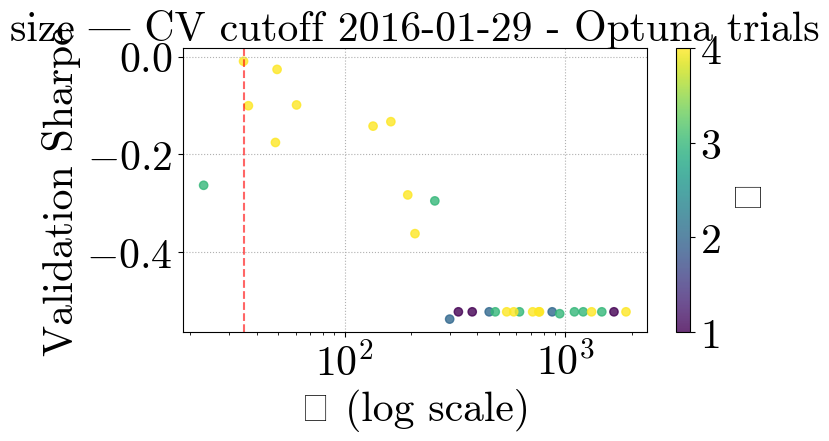

[I 2025-04-25 15:47:25,820] A new study created in memory with name: no-name-e615e5b9-06ad-426a-9272-e9d8ecaa744c
[I 2025-04-25 15:47:28,933] Trial 0 finished with value: -0.6739041971369939 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.6739041971369939.
[I 2025-04-25 15:47:29,485] Trial 1 finished with value: 0.5894521802218001 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.5894521802218001.
[I 2025-04-25 15:47:31,004] Trial 2 finished with value: -0.5963817090934503 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.5894521802218001.
[I 2025-04-25 15:47:37,108] Trial 3 finished with value: -0.6120465944086017 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.5894521802218001.
[I 2025-04-25 15:47:37,731] Trial 4 finished with value: 0.5894521802218001 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tria

Optuna best λ=1465.8674, κ=3, Sharpe=0.5895


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


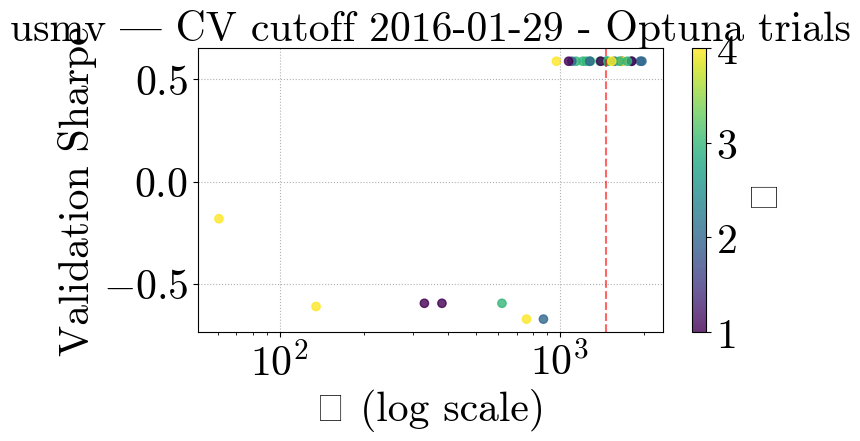

[I 2025-04-25 15:48:10,097] A new study created in memory with name: no-name-38ec40cd-eadf-4966-97d0-cbf6f0a1b305
[I 2025-04-25 15:48:12,322] Trial 0 finished with value: 0.27418258187207545 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.27418258187207545.
[I 2025-04-25 15:48:12,926] Trial 1 finished with value: 0.6066096052259333 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.6066096052259333.
[I 2025-04-25 15:48:14,972] Trial 2 finished with value: 1.0395900178170996 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 1.0395900178170996.
[I 2025-04-25 15:48:18,620] Trial 3 finished with value: 1.2052981718564546 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 1.2052981718564546.
[I 2025-04-25 15:48:19,224] Trial 4 finished with value: 0.6066096052259333 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 

Optuna best λ=453.7817, κ=3, Sharpe=1.2890


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


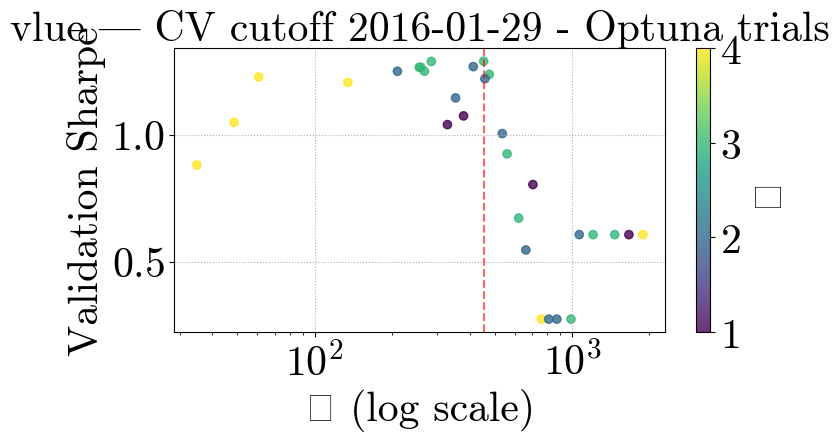

[I 2025-04-25 15:49:52,832] A new study created in memory with name: no-name-57c75530-2fe7-43e5-9c8c-d2637c39d4d1
[I 2025-04-25 15:49:56,019] Trial 0 finished with value: -0.7278124776772906 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.7278124776772906.
[I 2025-04-25 15:49:56,614] Trial 1 finished with value: -0.7278124776772905 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: -0.7278124776772905.
[I 2025-04-25 15:49:58,658] Trial 2 finished with value: -0.47832645686649783 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.47832645686649783.
[I 2025-04-25 15:50:04,703] Trial 3 finished with value: -0.7448103599009681 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: -0.47832645686649783.
[I 2025-04-25 15:50:05,384] Trial 4 finished with value: -0.7278124776772905 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best

Optuna best λ=234.6865, κ=1, Sharpe=0.0564


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


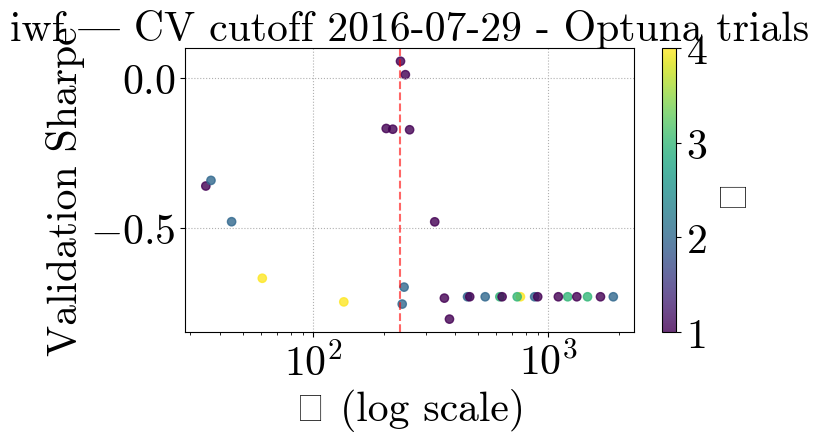

[I 2025-04-25 15:51:28,093] A new study created in memory with name: no-name-a691b323-2433-4797-a736-d447bd11eb4f
[I 2025-04-25 15:51:31,793] Trial 0 finished with value: 1.1773283935555958 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.1773283935555958.
[I 2025-04-25 15:51:32,384] Trial 1 finished with value: 1.1773283935555956 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.1773283935555958.
[I 2025-04-25 15:51:33,954] Trial 2 finished with value: 1.1773283935555956 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 1.1773283935555958.
[I 2025-04-25 15:51:40,135] Trial 3 finished with value: 1.6676810365531383 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 1.6676810365531383.
[I 2025-04-25 15:51:40,738] Trial 4 finished with value: 1.1773283935555956 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 3 

Optuna best λ=134.6857, κ=4, Sharpe=1.6677


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


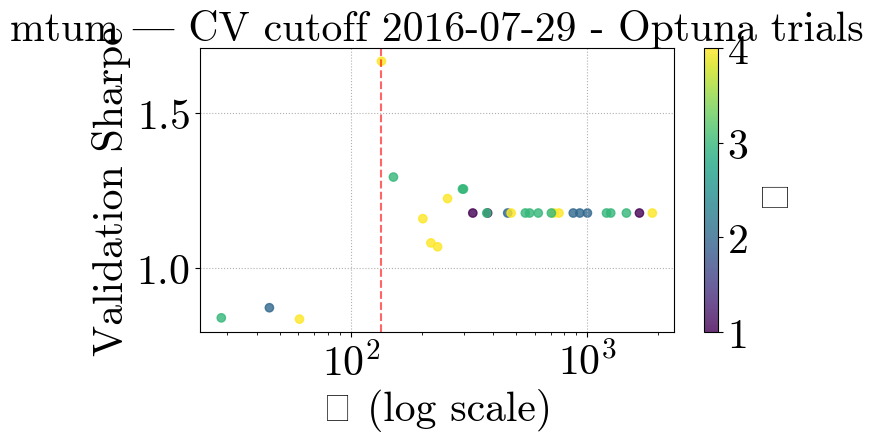

[I 2025-04-25 15:53:34,206] A new study created in memory with name: no-name-a56078c6-1d8e-4fc1-8e1c-deb287b04dd4
[I 2025-04-25 15:53:36,921] Trial 0 finished with value: -1.0007681235331751 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -1.0007681235331751.
[I 2025-04-25 15:53:37,523] Trial 1 finished with value: 0.9879630177947161 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.9879630177947161.
[I 2025-04-25 15:53:39,576] Trial 2 finished with value: -0.06366551694615669 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.9879630177947161.
[I 2025-04-25 15:53:48,355] Trial 3 finished with value: 0.09116848359560219 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.9879630177947161.
[I 2025-04-25 15:53:48,979] Trial 4 finished with value: 0.9879630177947161 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tri

Optuna best λ=379.1132, κ=1, Sharpe=1.0115


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


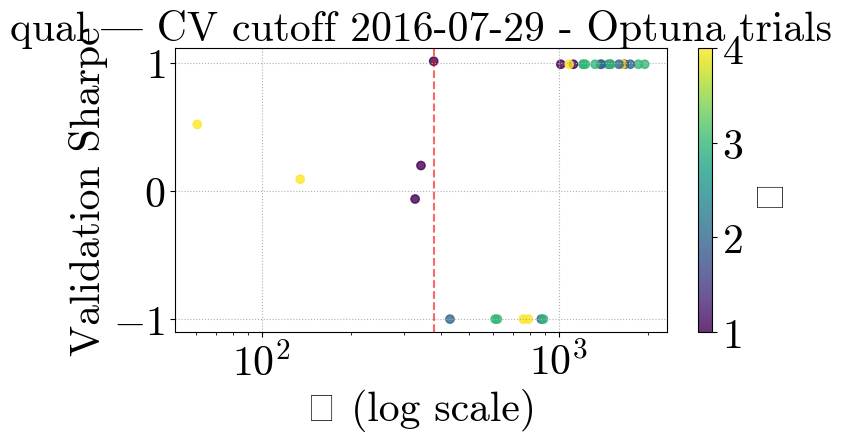

[I 2025-04-25 15:54:38,215] A new study created in memory with name: no-name-da618805-b8cf-4911-a8cb-af39c2206bc7
[I 2025-04-25 15:54:41,885] Trial 0 finished with value: -0.45392354509283334 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.45392354509283334.
[I 2025-04-25 15:54:42,529] Trial 1 finished with value: -0.45392354509283334 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.45392354509283334.
[I 2025-04-25 15:54:44,621] Trial 2 finished with value: -0.4539235450928333 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.4539235450928333.
[I 2025-04-25 15:54:51,981] Trial 3 finished with value: -0.01935324831469818 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: -0.01935324831469818.
[I 2025-04-25 15:54:52,678] Trial 4 finished with value: -0.45392354509283334 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. 

Optuna best λ=60.6134, κ=4, Sharpe=0.0746


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


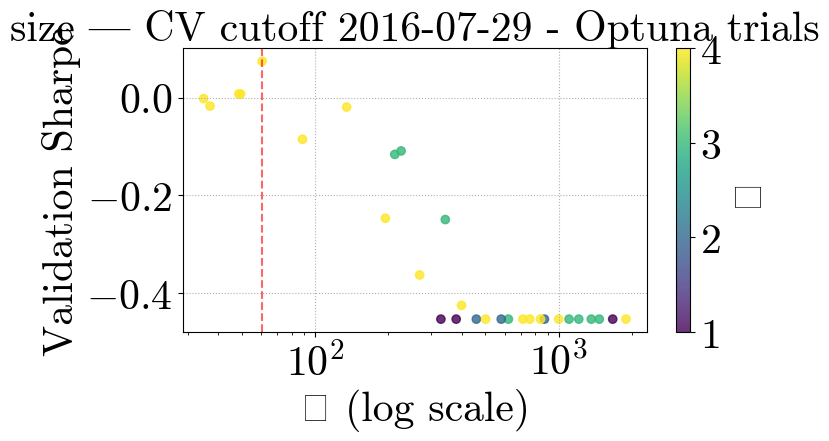

[I 2025-04-25 15:56:49,521] A new study created in memory with name: no-name-04efad25-39bf-4669-82e2-fa81e206f4c0
[I 2025-04-25 15:56:53,224] Trial 0 finished with value: -0.09651158993674577 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.09651158993674577.
[I 2025-04-25 15:56:53,847] Trial 1 finished with value: 0.6318261687721355 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.6318261687721355.
[I 2025-04-25 15:56:55,883] Trial 2 finished with value: -0.6381050205031346 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.6318261687721355.
[I 2025-04-25 15:57:03,879] Trial 3 finished with value: -0.3612912184062378 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.6318261687721355.
[I 2025-04-25 15:57:04,622] Trial 4 finished with value: 0.6318261687721355 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tr

Optuna best λ=1465.8674, κ=3, Sharpe=0.6318


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


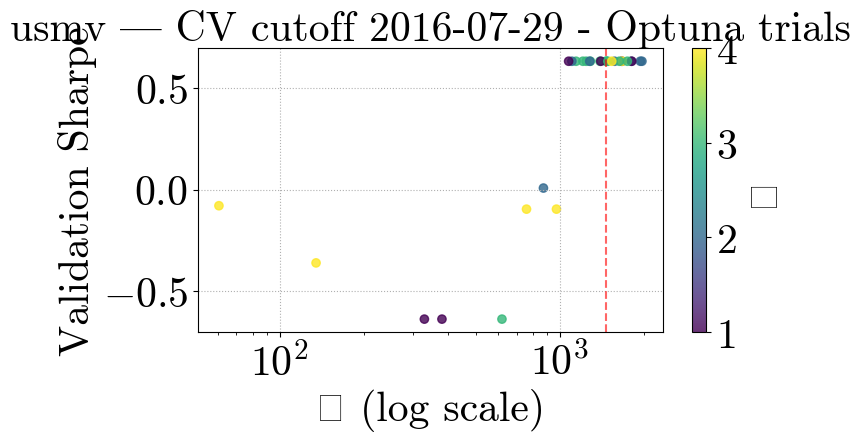

[I 2025-04-25 15:57:39,394] A new study created in memory with name: no-name-a1090ac9-5d4d-48b7-bcb1-929629c9035b
[I 2025-04-25 15:57:44,081] Trial 0 finished with value: -0.0569837537635845 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.0569837537635845.
[I 2025-04-25 15:57:44,653] Trial 1 finished with value: 0.0702611196304798 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.0702611196304798.
[I 2025-04-25 15:57:46,886] Trial 2 finished with value: 0.42833130426305155 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.42833130426305155.
[I 2025-04-25 15:57:52,212] Trial 3 finished with value: 0.45664243078887795 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.45664243078887795.
[I 2025-04-25 15:57:52,841] Trial 4 finished with value: 0.0702611196304798 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tr

Optuna best λ=134.6857, κ=4, Sharpe=0.4566


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


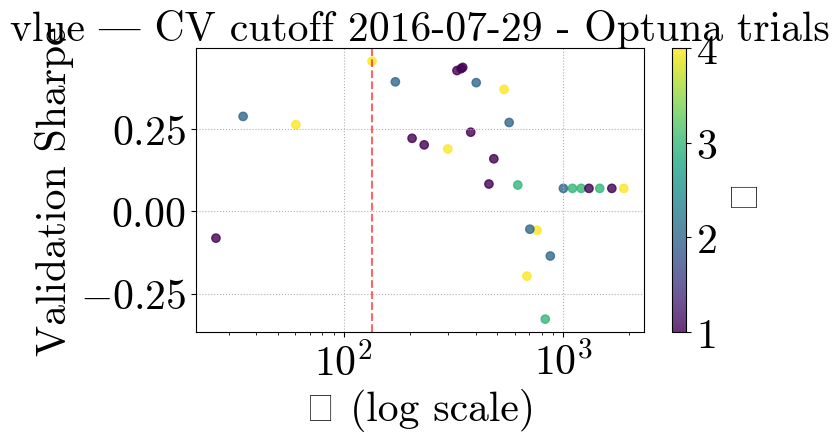

[I 2025-04-25 15:59:23,347] A new study created in memory with name: no-name-20448745-6fd9-4d14-b726-6ac021d08d15
[I 2025-04-25 15:59:28,815] Trial 0 finished with value: -0.16738607904538444 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.16738607904538444.
[I 2025-04-25 15:59:29,434] Trial 1 finished with value: -0.16738607904538455 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.16738607904538444.
[I 2025-04-25 15:59:31,632] Trial 2 finished with value: -0.2047017098060754 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.16738607904538444.
[I 2025-04-25 15:59:41,240] Trial 3 finished with value: -0.3699376156156837 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: -0.16738607904538444.
[I 2025-04-25 15:59:41,967] Trial 4 finished with value: -0.16738607904538455 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. 

Optuna best λ=183.6504, κ=4, Sharpe=-0.0669


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


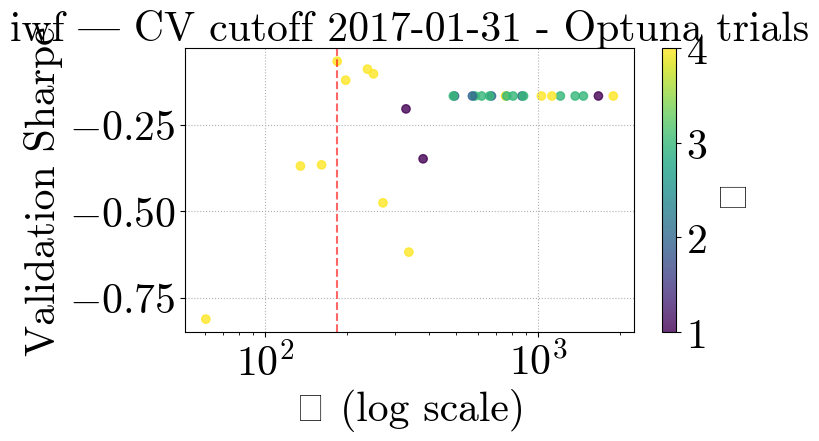

[I 2025-04-25 16:01:46,441] A new study created in memory with name: no-name-44cec01a-50b7-4951-83c3-92925e874952
[I 2025-04-25 16:01:50,450] Trial 0 finished with value: 0.7297012197772139 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.7297012197772139.
[I 2025-04-25 16:01:51,198] Trial 1 finished with value: 0.7297012197772137 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.7297012197772139.
[I 2025-04-25 16:01:53,802] Trial 2 finished with value: 0.7297012197772137 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.7297012197772139.
[I 2025-04-25 16:02:00,583] Trial 3 finished with value: 1.1568947654936341 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 1.1568947654936341.
[I 2025-04-25 16:02:01,606] Trial 4 finished with value: 0.7297012197772137 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 3 

Optuna best λ=134.6857, κ=4, Sharpe=1.1569


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


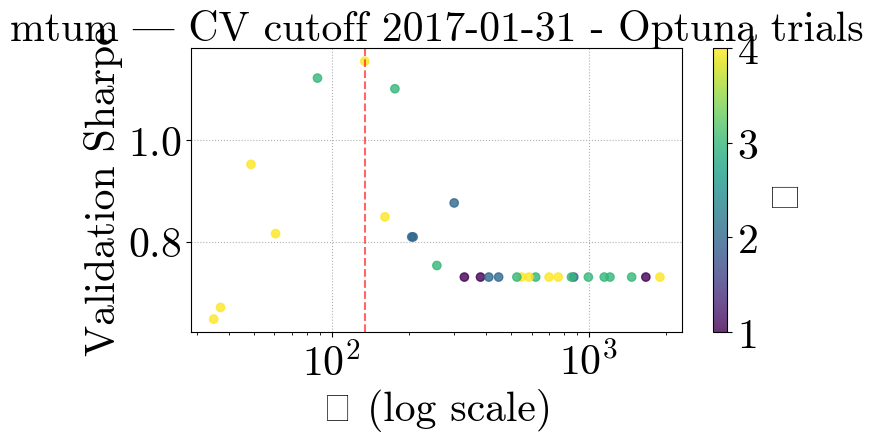

[I 2025-04-25 16:04:11,740] A new study created in memory with name: no-name-d97adc46-0de2-4f12-9f79-01910d14f76b
[I 2025-04-25 16:04:15,421] Trial 0 finished with value: -0.6527451147823393 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.6527451147823393.
[I 2025-04-25 16:04:16,200] Trial 1 finished with value: 0.6404250370086733 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.6404250370086733.
[I 2025-04-25 16:04:18,825] Trial 2 finished with value: 0.0060549790521336995 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.6404250370086733.
[I 2025-04-25 16:04:26,064] Trial 3 finished with value: 0.2449872685668776 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.6404250370086733.
[I 2025-04-25 16:04:26,853] Trial 4 finished with value: 0.6404250370086733 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tri

Optuna best λ=379.1132, κ=1, Sharpe=0.9175


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


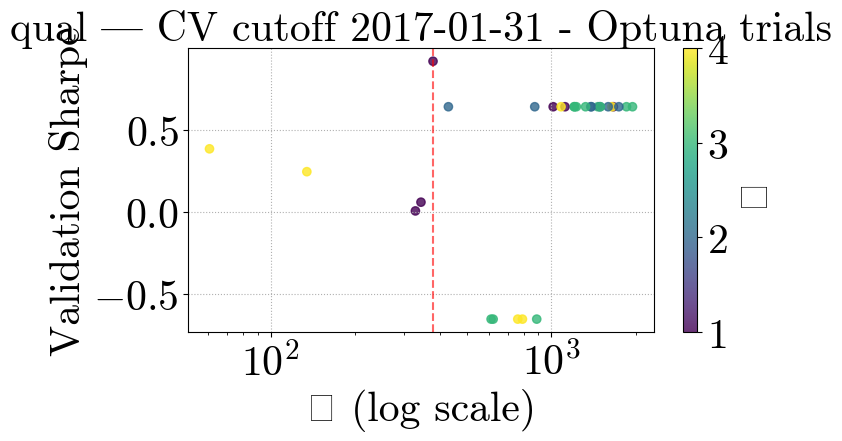

[I 2025-04-25 16:05:25,282] A new study created in memory with name: no-name-43e67933-7d9a-4abe-8201-ebde901ec42a
[I 2025-04-25 16:05:29,688] Trial 0 finished with value: -0.4752043329611305 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.4752043329611305.
[I 2025-04-25 16:05:30,396] Trial 1 finished with value: -0.48786163694435636 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.4752043329611305.
[I 2025-04-25 16:05:33,155] Trial 2 finished with value: -0.4878616369443566 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.4752043329611305.
[I 2025-04-25 16:05:42,510] Trial 3 finished with value: 0.0031987820551053845 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.0031987820551053845.
[I 2025-04-25 16:05:43,226] Trial 4 finished with value: -0.48786163694435636 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. B

Optuna best λ=34.8609, κ=4, Sharpe=0.3898


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


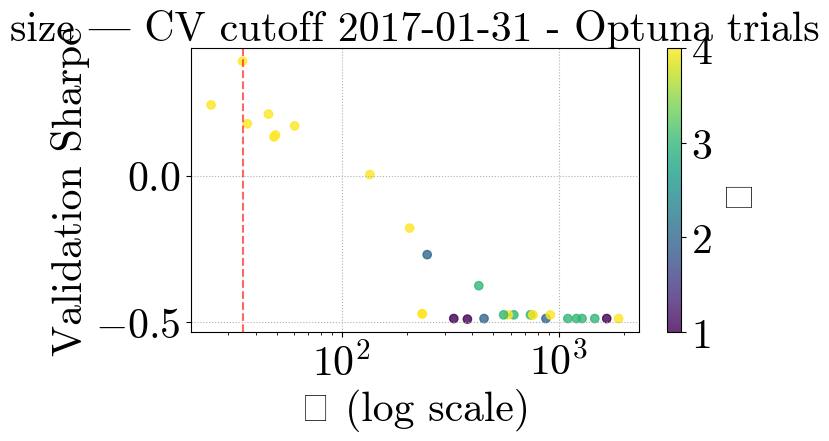

[I 2025-04-25 16:08:03,725] A new study created in memory with name: no-name-6bc9f563-51ba-4e1a-a571-7afa5806b02d
[I 2025-04-25 16:08:10,761] Trial 0 finished with value: -0.14697122728925366 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.14697122728925366.
[I 2025-04-25 16:08:11,504] Trial 1 finished with value: 0.27565841614311615 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.27565841614311615.
[I 2025-04-25 16:08:13,996] Trial 2 finished with value: -0.2843300702183116 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.27565841614311615.
[I 2025-04-25 16:08:23,459] Trial 3 finished with value: -0.5629358766075288 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.27565841614311615.
[I 2025-04-25 16:08:24,199] Trial 4 finished with value: 0.27565841614311615 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=1465.8674, κ=3, Sharpe=0.2757


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


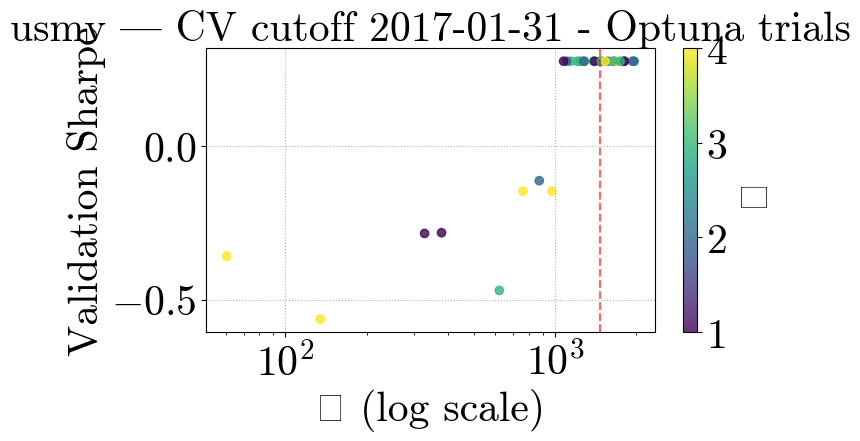

[I 2025-04-25 16:09:09,222] A new study created in memory with name: no-name-475a6ffb-4cbf-4669-83b9-995cadc93ce5
[I 2025-04-25 16:09:12,842] Trial 0 finished with value: 0.4061042884512798 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.4061042884512798.
[I 2025-04-25 16:09:13,941] Trial 1 finished with value: 0.49370848116102495 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.49370848116102495.
[I 2025-04-25 16:09:16,912] Trial 2 finished with value: 0.9332548726006089 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.9332548726006089.
[I 2025-04-25 16:09:23,031] Trial 3 finished with value: 1.008399546967889 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 1.008399546967889.
[I 2025-04-25 16:09:24,394] Trial 4 finished with value: 0.49370848116102495 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 3

Optuna best λ=134.6857, κ=4, Sharpe=1.0084


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


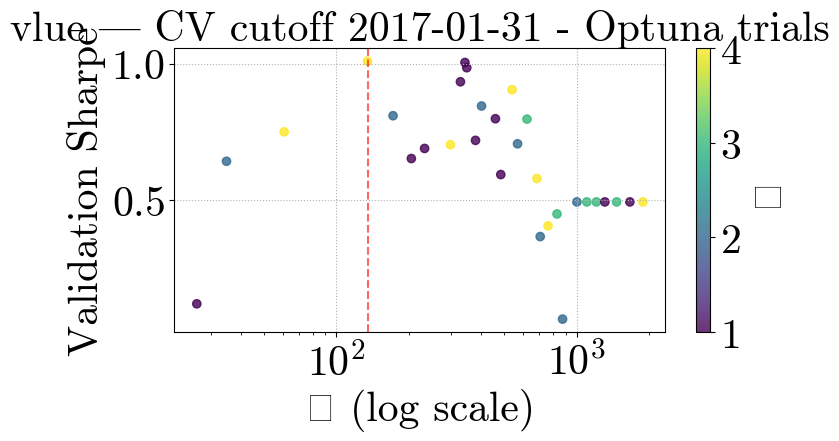

[I 2025-04-25 16:10:59,866] A new study created in memory with name: no-name-5cbe034b-89d1-4dd1-b135-1c23288a05db
[I 2025-04-25 16:11:06,146] Trial 0 finished with value: -0.6345619146675802 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.6345619146675802.
[I 2025-04-25 16:11:06,874] Trial 1 finished with value: -0.6345619146675804 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.6345619146675802.
[I 2025-04-25 16:11:09,420] Trial 2 finished with value: -0.2503432990493398 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.2503432990493398.
[I 2025-04-25 16:11:18,075] Trial 3 finished with value: -1.0123530804294152 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: -0.2503432990493398.
[I 2025-04-25 16:11:18,750] Trial 4 finished with value: -0.6345619146675804 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=234.6865, κ=1, Sharpe=-0.0265


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


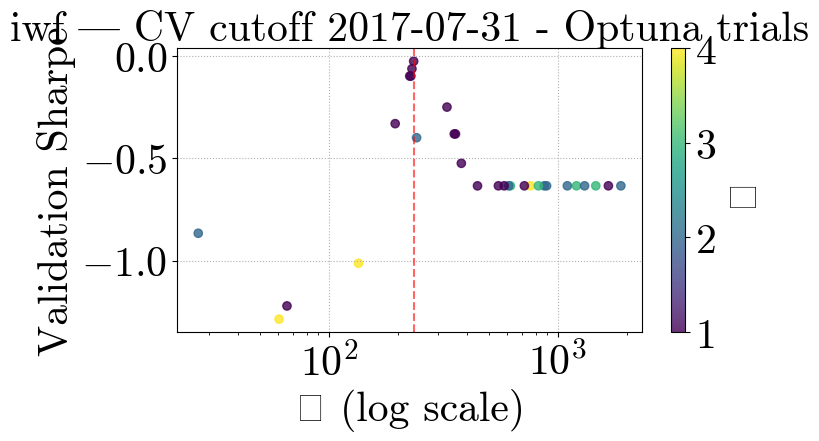

[I 2025-04-25 16:12:37,059] A new study created in memory with name: no-name-ddb6e351-cf4b-40db-9a67-f0a3e563ea90
[I 2025-04-25 16:12:40,231] Trial 0 finished with value: 1.2253615508636009 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.2253615508636009.
[I 2025-04-25 16:12:40,924] Trial 1 finished with value: 1.2253615508636015 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 1.2253615508636015.
[I 2025-04-25 16:12:43,085] Trial 2 finished with value: 1.2253615508636013 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 1.2253615508636015.
[I 2025-04-25 16:12:50,247] Trial 3 finished with value: 1.6504034178809974 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 1.6504034178809974.
[I 2025-04-25 16:12:50,924] Trial 4 finished with value: 1.2253615508636015 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 3 

Optuna best λ=60.6134, κ=4, Sharpe=1.9115


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


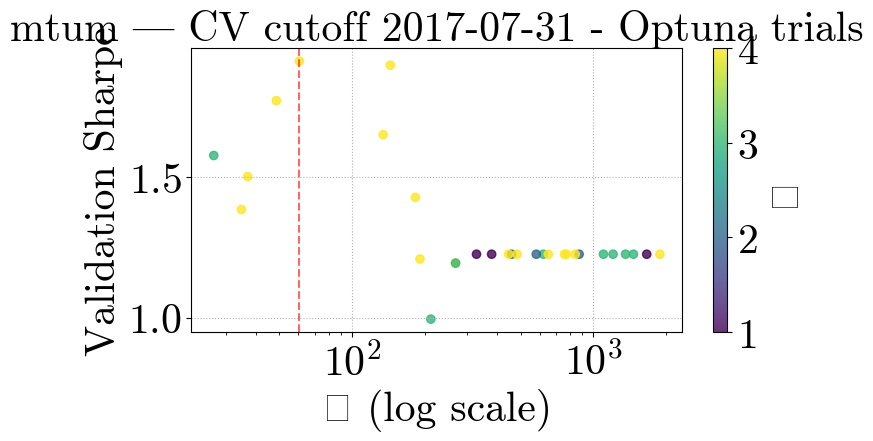

[I 2025-04-25 16:15:21,585] A new study created in memory with name: no-name-5ac203ac-748e-42c7-a3d5-5c739989fd3f
[I 2025-04-25 16:15:25,728] Trial 0 finished with value: -0.7354193156187375 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.7354193156187375.
[I 2025-04-25 16:15:26,387] Trial 1 finished with value: 0.723239041939384 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.723239041939384.
[I 2025-04-25 16:15:28,634] Trial 2 finished with value: -0.12125216595426647 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.723239041939384.
[I 2025-04-25 16:15:35,818] Trial 3 finished with value: 0.2517056081777437 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.723239041939384.
[I 2025-04-25 16:15:36,658] Trial 4 finished with value: 0.723239041939384 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 1 w

Optuna best λ=873.1778, κ=2, Sharpe=0.7232


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


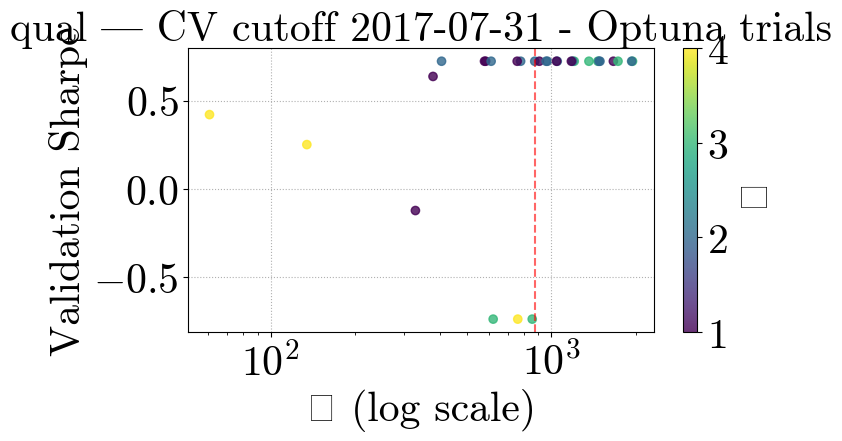

[I 2025-04-25 16:16:49,224] A new study created in memory with name: no-name-4d0d4311-b63c-45cf-ba2f-3a6c425beef0
[I 2025-04-25 16:16:53,511] Trial 0 finished with value: -0.31002719425759356 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.31002719425759356.
[I 2025-04-25 16:16:54,265] Trial 1 finished with value: -0.3100271942575937 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.31002719425759356.
[I 2025-04-25 16:16:56,964] Trial 2 finished with value: -0.3100271942575936 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.31002719425759356.
[I 2025-04-25 16:17:04,532] Trial 3 finished with value: 0.5001023593096868 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.5001023593096868.
[I 2025-04-25 16:17:05,349] Trial 4 finished with value: -0.3100271942575937 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=48.6483, κ=4, Sharpe=0.5449


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


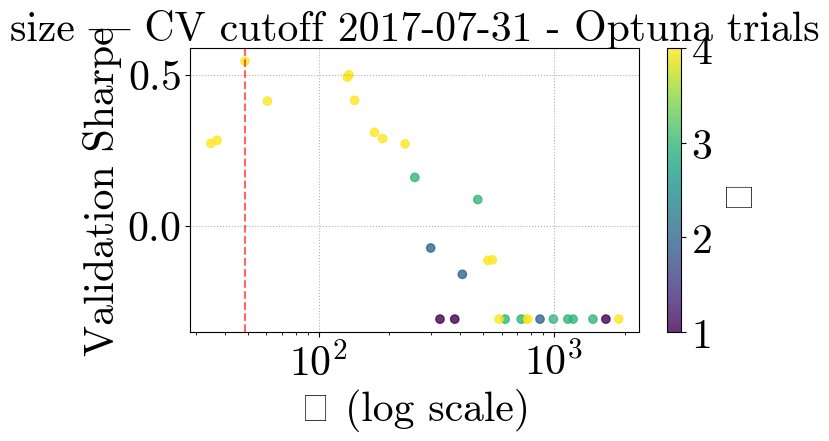

[I 2025-04-25 16:19:06,002] A new study created in memory with name: no-name-a3491629-f8c9-44c2-9290-2386ddc75337
[I 2025-04-25 16:19:09,994] Trial 0 finished with value: 1.1879441759896763 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.1879441759896763.
[I 2025-04-25 16:19:10,620] Trial 1 finished with value: -0.4128863067283542 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.1879441759896763.
[I 2025-04-25 16:19:12,693] Trial 2 finished with value: -0.1993444454353992 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 1.1879441759896763.
[I 2025-04-25 16:19:19,594] Trial 3 finished with value: -0.6240546026035013 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 1.1879441759896763.
[I 2025-04-25 16:19:20,271] Trial 4 finished with value: -0.4128863067283542 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tria

Optuna best λ=759.7853, κ=4, Sharpe=1.1879


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


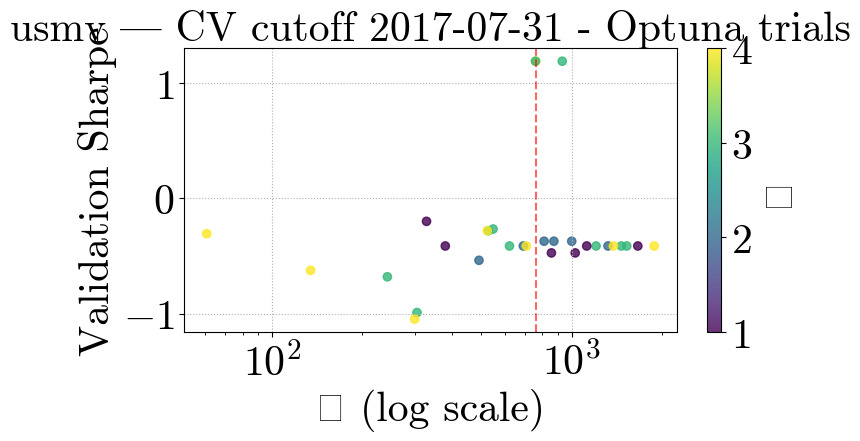

[I 2025-04-25 16:20:42,794] A new study created in memory with name: no-name-148a4822-100d-49b4-ac71-d1e4ea6a7d1c
[I 2025-04-25 16:20:46,564] Trial 0 finished with value: -0.2313510667258157 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.2313510667258157.
[I 2025-04-25 16:20:47,386] Trial 1 finished with value: -0.008869763976300713 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: -0.008869763976300713.
[I 2025-04-25 16:20:49,949] Trial 2 finished with value: 0.416785472154942 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.416785472154942.
[I 2025-04-25 16:20:54,248] Trial 3 finished with value: 0.36431819992582576 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.416785472154942.
[I 2025-04-25 16:20:55,033] Trial 4 finished with value: -0.008869763976300713 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=326.3516, κ=1, Sharpe=0.4172


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


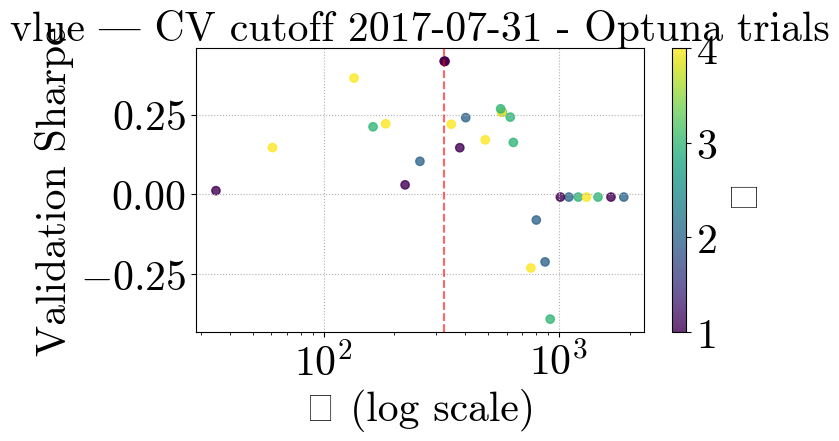

[I 2025-04-25 16:22:17,066] A new study created in memory with name: no-name-06009c7f-c3e2-4fb8-9ca2-4b74d8663eec
[I 2025-04-25 16:22:21,546] Trial 0 finished with value: -0.8300656016500076 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.8300656016500076.
[I 2025-04-25 16:22:22,302] Trial 1 finished with value: -0.8300656016500078 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.8300656016500076.
[I 2025-04-25 16:22:24,705] Trial 2 finished with value: -0.19028734943332928 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.19028734943332928.
[I 2025-04-25 16:22:34,320] Trial 3 finished with value: -0.6255708475759331 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: -0.19028734943332928.
[I 2025-04-25 16:22:35,060] Trial 4 finished with value: -0.8300656016500078 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best

Optuna best λ=255.8362, κ=1, Sharpe=0.0229


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


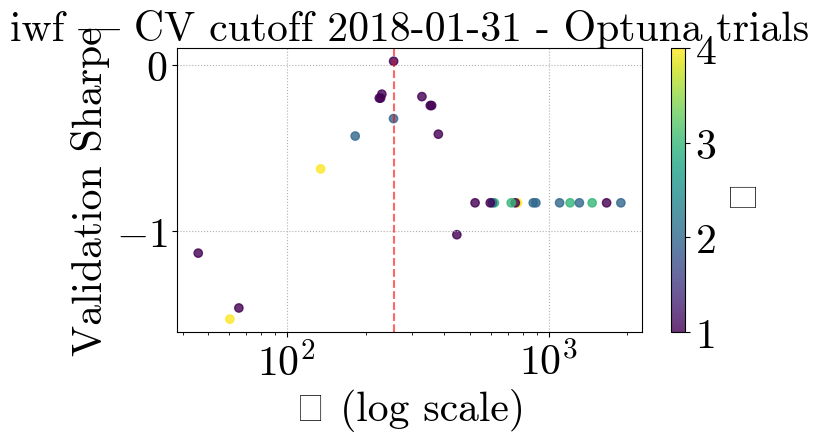

[I 2025-04-25 16:23:58,787] A new study created in memory with name: no-name-e381bc76-7f76-41e4-88ec-202982d942c5
[I 2025-04-25 16:24:01,768] Trial 0 finished with value: 1.3653612789465597 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.3653612789465597.
[I 2025-04-25 16:24:02,447] Trial 1 finished with value: 1.3653612789465595 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.3653612789465597.
[I 2025-04-25 16:24:04,880] Trial 2 finished with value: 1.36536127894656 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 1.36536127894656.
[I 2025-04-25 16:24:14,268] Trial 3 finished with value: 1.6661195160724434 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 1.6661195160724434.
[I 2025-04-25 16:24:15,029] Trial 4 finished with value: 1.3653612789465595 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 3 with

Optuna best λ=88.7031, κ=4, Sharpe=2.2754


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


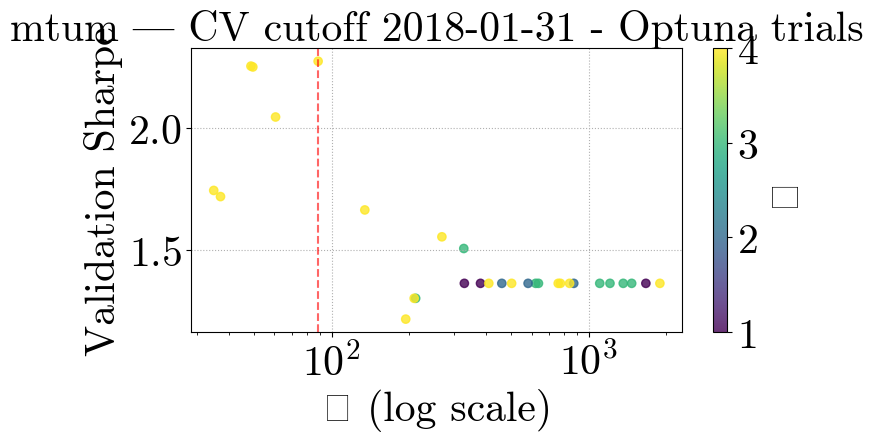

[I 2025-04-25 16:26:22,823] A new study created in memory with name: no-name-c3c4471e-4409-415f-9eca-dc06a2a43748
[I 2025-04-25 16:26:26,889] Trial 0 finished with value: 0.6534293816612429 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.6534293816612429.
[I 2025-04-25 16:26:27,648] Trial 1 finished with value: 0.653429381661243 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.653429381661243.
[I 2025-04-25 16:26:30,057] Trial 2 finished with value: -0.18815540598961328 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.653429381661243.
[I 2025-04-25 16:26:41,118] Trial 3 finished with value: 0.4651631382669261 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.653429381661243.
[I 2025-04-25 16:26:41,897] Trial 4 finished with value: 0.653429381661243 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 1 wit

Optuna best λ=873.1778, κ=2, Sharpe=0.6534


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


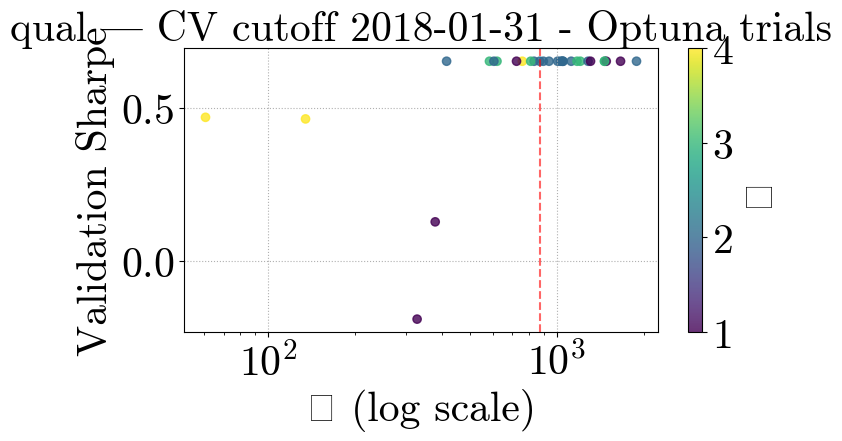

[I 2025-04-25 16:28:17,366] A new study created in memory with name: no-name-59295ee4-9a3d-4344-8476-7e2f0fe3c620
[I 2025-04-25 16:28:20,387] Trial 0 finished with value: -0.03056442597499472 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.03056442597499472.
[I 2025-04-25 16:28:21,080] Trial 1 finished with value: -0.10624632687019919 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.03056442597499472.
[I 2025-04-25 16:28:23,124] Trial 2 finished with value: -0.10624632687019908 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.03056442597499472.
[I 2025-04-25 16:28:30,628] Trial 3 finished with value: 0.05174712375180242 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.05174712375180242.
[I 2025-04-25 16:28:33,070] Trial 4 finished with value: 0.11420444281481695 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. B

Optuna best λ=43.7766, κ=2, Sharpe=0.3942


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


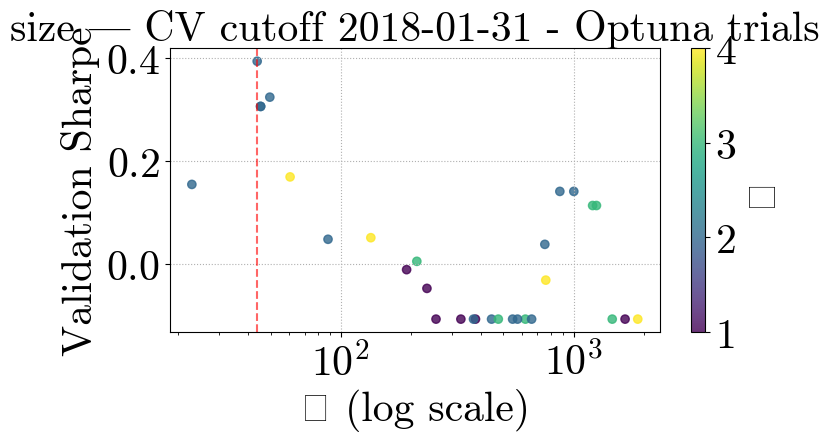

[I 2025-04-25 16:30:42,340] A new study created in memory with name: no-name-da02aa1a-2495-4dfa-a60b-137fa935d08f
[I 2025-04-25 16:30:47,126] Trial 0 finished with value: 0.0837477363110922 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.0837477363110922.
[I 2025-04-25 16:30:47,838] Trial 1 finished with value: -0.0901389362345167 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.0837477363110922.
[I 2025-04-25 16:30:50,022] Trial 2 finished with value: -0.30235655549610474 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.0837477363110922.
[I 2025-04-25 16:30:59,565] Trial 3 finished with value: -0.24668903519835475 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.0837477363110922.
[I 2025-04-25 16:31:00,302] Trial 4 finished with value: -0.0901389362345167 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tr

Optuna best λ=60.6134, κ=4, Sharpe=0.3399


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


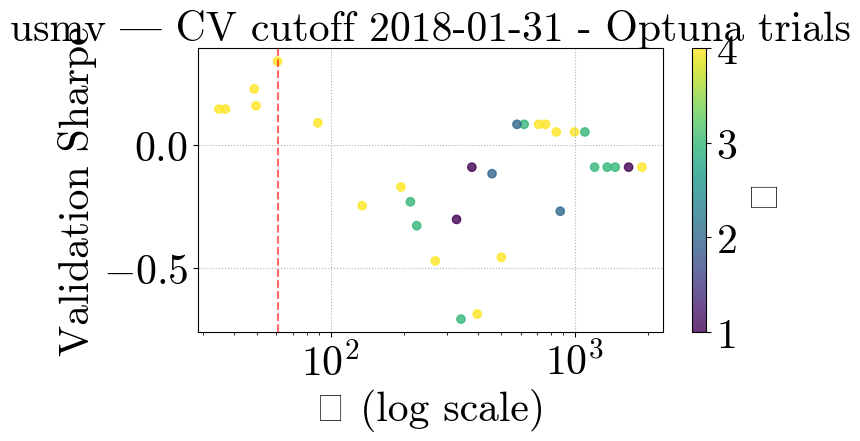

[I 2025-04-25 16:33:36,476] A new study created in memory with name: no-name-ab5bcc55-5d01-4956-9524-31cd65c4b83e
[I 2025-04-25 16:33:40,060] Trial 0 finished with value: 0.4681400127298028 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.4681400127298028.
[I 2025-04-25 16:33:40,901] Trial 1 finished with value: 0.19006550939813804 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.4681400127298028.
[I 2025-04-25 16:33:43,771] Trial 2 finished with value: 0.6188636409325646 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.6188636409325646.
[I 2025-04-25 16:33:49,571] Trial 3 finished with value: 0.5502993504702622 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.6188636409325646.
[I 2025-04-25 16:33:50,536] Trial 4 finished with value: 0.19006550939813804 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 

Optuna best λ=930.4846, κ=1, Sharpe=0.6651


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


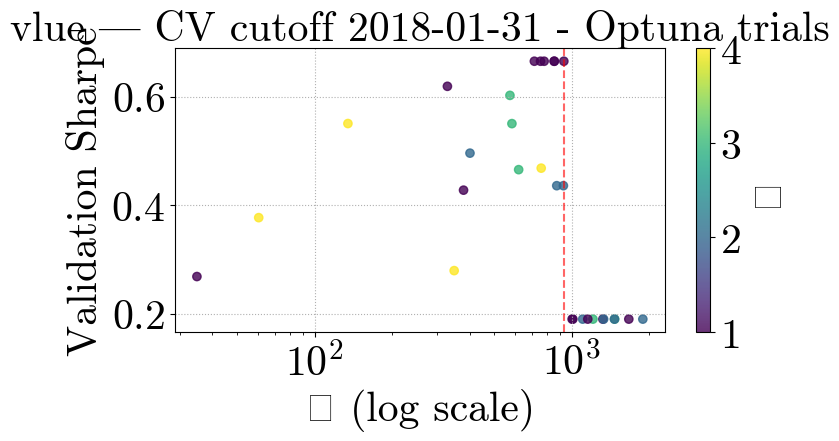

[I 2025-04-25 16:34:55,546] A new study created in memory with name: no-name-147bafb6-07f7-41d1-8de5-a5928297e219
[I 2025-04-25 16:34:59,923] Trial 0 finished with value: -0.3796456752144798 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.3796456752144798.
[I 2025-04-25 16:35:00,633] Trial 1 finished with value: 0.5856122005614676 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.5856122005614676.
[I 2025-04-25 16:35:03,166] Trial 2 finished with value: -0.16899895836901135 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.5856122005614676.
[I 2025-04-25 16:35:08,115] Trial 3 finished with value: -0.10541747277945787 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.5856122005614676.
[I 2025-04-25 16:35:08,886] Trial 4 finished with value: 0.5856122005614676 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tr

Optuna best λ=60.6134, κ=4, Sharpe=0.9884


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


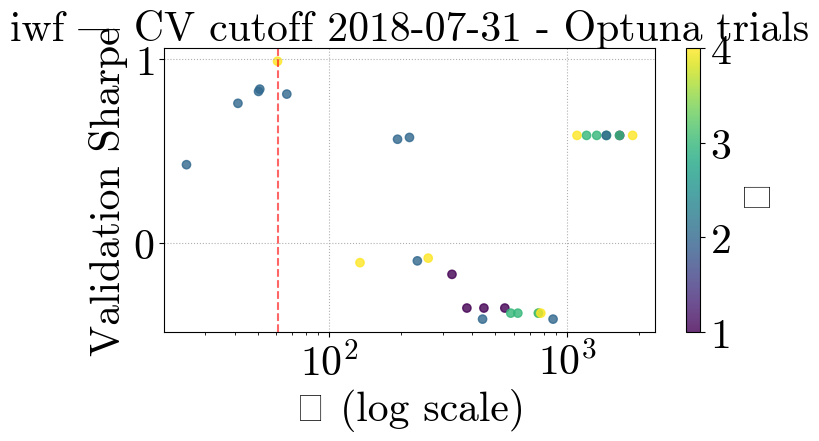

[I 2025-04-25 16:37:07,842] A new study created in memory with name: no-name-68c87520-d03f-47e5-99e7-201ad9799735
[I 2025-04-25 16:37:11,214] Trial 0 finished with value: 1.0325163604731642 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.0325163604731642.
[I 2025-04-25 16:37:12,038] Trial 1 finished with value: 1.0325163604731644 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 1.0325163604731644.
[I 2025-04-25 16:37:15,008] Trial 2 finished with value: 1.0325163604731642 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 1.0325163604731644.
[I 2025-04-25 16:37:22,606] Trial 3 finished with value: 1.2290164914107116 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 1.2290164914107116.
[I 2025-04-25 16:37:23,458] Trial 4 finished with value: 1.0325163604731644 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 3 

Optuna best λ=48.6483, κ=4, Sharpe=1.4861


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


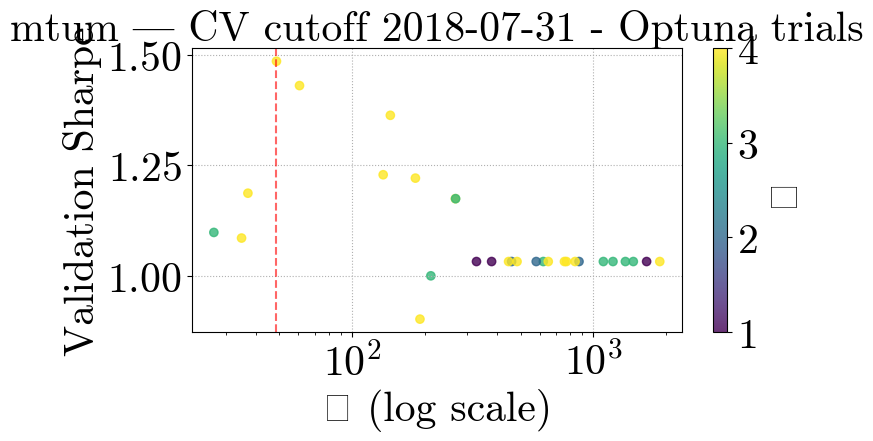

[I 2025-04-25 16:39:41,319] A new study created in memory with name: no-name-35367eb4-d211-4977-a9ed-92bd0107ecb2
[I 2025-04-25 16:39:44,325] Trial 0 finished with value: 0.4769184272583907 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.4769184272583907.
[I 2025-04-25 16:39:45,023] Trial 1 finished with value: 0.46455449942982646 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.4769184272583907.
[I 2025-04-25 16:39:47,299] Trial 2 finished with value: 0.3948612832633425 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.4769184272583907.
[I 2025-04-25 16:39:54,231] Trial 3 finished with value: 0.4673611594724576 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.4769184272583907.
[I 2025-04-25 16:39:55,039] Trial 4 finished with value: 0.46455449942982646 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 

Optuna best λ=895.1734, κ=1, Sharpe=0.7974


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


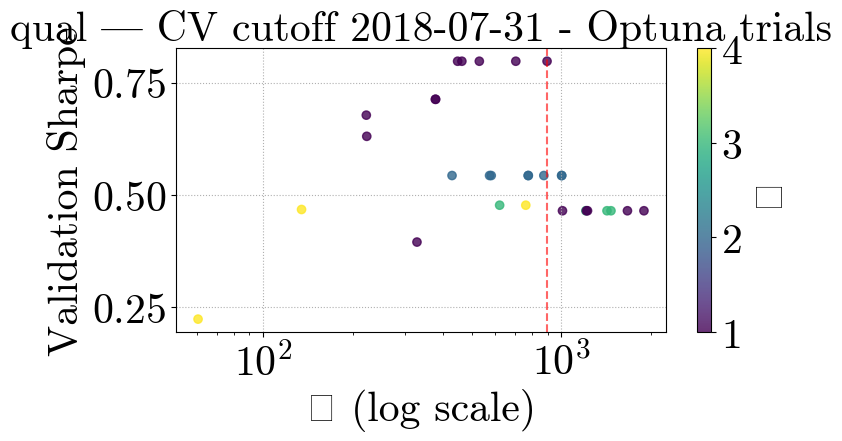

[I 2025-04-25 16:41:13,352] A new study created in memory with name: no-name-0bfc54ae-10ec-45d6-a295-704de8b1e469
[I 2025-04-25 16:41:16,043] Trial 0 finished with value: -0.3553576801377442 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.3553576801377442.
[I 2025-04-25 16:41:16,738] Trial 1 finished with value: -0.2908385697591694 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: -0.2908385697591694.
[I 2025-04-25 16:41:19,137] Trial 2 finished with value: -0.29083856975916955 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: -0.2908385697591694.
[I 2025-04-25 16:41:27,041] Trial 3 finished with value: -0.008667105826138064 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: -0.008667105826138064.
[I 2025-04-25 16:41:28,749] Trial 4 finished with value: 0.28834552306399536 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Be

Optuna best λ=1207.3409, κ=3, Sharpe=0.2883


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


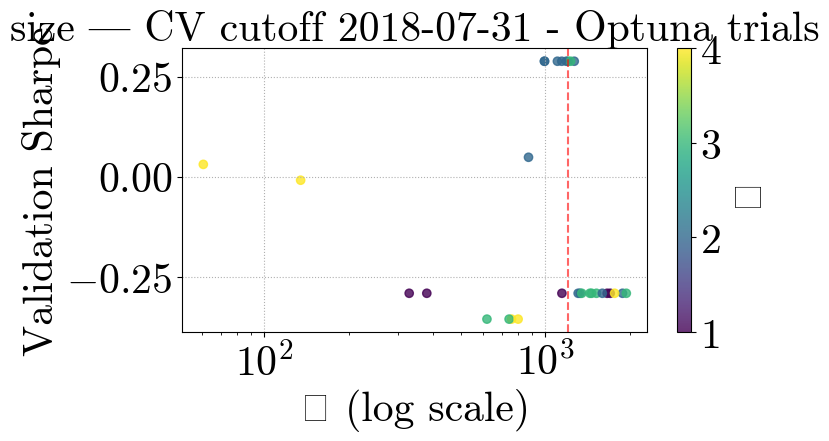

[I 2025-04-25 16:42:09,469] A new study created in memory with name: no-name-8a213b50-8ce7-4151-aa59-901d1170d3c8
[I 2025-04-25 16:42:13,486] Trial 0 finished with value: -0.018408967603223095 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.018408967603223095.
[I 2025-04-25 16:42:14,225] Trial 1 finished with value: -0.1171289523916611 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.018408967603223095.
[I 2025-04-25 16:42:16,286] Trial 2 finished with value: 0.02152896846596074 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.02152896846596074.
[I 2025-04-25 16:42:26,577] Trial 3 finished with value: -0.26157742103009585 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.02152896846596074.
[I 2025-04-25 16:42:27,348] Trial 4 finished with value: -0.1171289523916611 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. 

Optuna best λ=375.6407, κ=1, Sharpe=0.1406


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


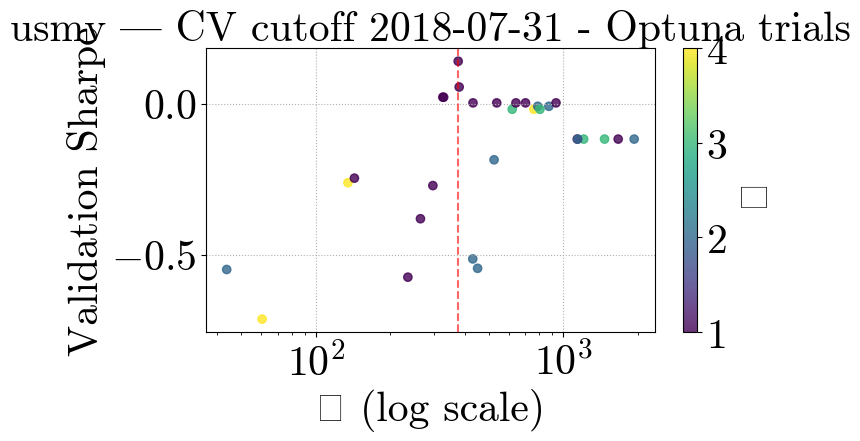

[I 2025-04-25 16:43:41,346] A new study created in memory with name: no-name-9f2bb451-569d-4c83-9d7a-6cfb9a3a2e4f
[I 2025-04-25 16:43:44,086] Trial 0 finished with value: 0.7209628101754323 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.7209628101754323.
[I 2025-04-25 16:43:45,024] Trial 1 finished with value: 0.3243107790597451 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.7209628101754323.
[I 2025-04-25 16:43:47,824] Trial 2 finished with value: 0.7331242604764907 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.7331242604764907.
[I 2025-04-25 16:43:51,920] Trial 3 finished with value: 0.5792503132628464 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.7331242604764907.
[I 2025-04-25 16:43:52,630] Trial 4 finished with value: 0.3243107790597451 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 2 

Optuna best λ=454.5486, κ=2, Sharpe=0.7928


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


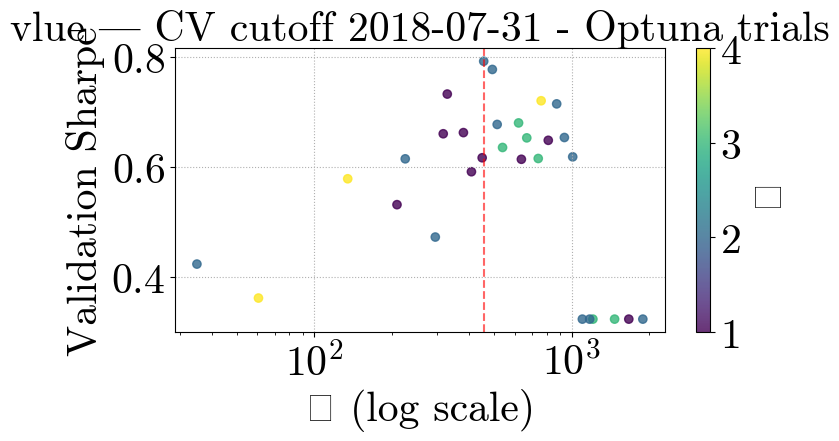

[I 2025-04-25 16:45:14,310] A new study created in memory with name: no-name-6f687d9e-d365-45ec-8579-55366dad0746
[I 2025-04-25 16:45:17,273] Trial 0 finished with value: 0.14873092829284298 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.14873092829284298.
[I 2025-04-25 16:45:18,017] Trial 1 finished with value: 0.45028140374435205 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.45028140374435205.
[I 2025-04-25 16:45:20,519] Trial 2 finished with value: 0.0823214447949581 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.45028140374435205.
[I 2025-04-25 16:45:28,838] Trial 3 finished with value: -0.05883074566547314 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.45028140374435205.
[I 2025-04-25 16:45:29,575] Trial 4 finished with value: 0.45028140374435205 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=60.6134, κ=4, Sharpe=0.8197


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


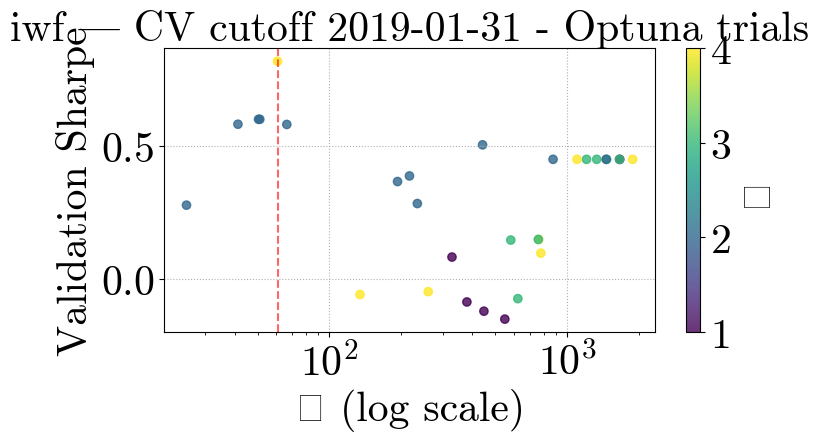

[I 2025-04-25 16:47:18,484] A new study created in memory with name: no-name-fc9ae2c7-cb39-44a8-955f-cdc312f06305
[I 2025-04-25 16:47:21,606] Trial 0 finished with value: 0.9419956167353616 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.9419956167353616.
[I 2025-04-25 16:47:22,465] Trial 1 finished with value: 0.829562242966122 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.9419956167353616.
[I 2025-04-25 16:47:25,188] Trial 2 finished with value: 0.8571635176258228 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.9419956167353616.
[I 2025-04-25 16:47:32,609] Trial 3 finished with value: 0.9003128184732396 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.9419956167353616.
[I 2025-04-25 16:47:33,473] Trial 4 finished with value: 0.829562242966122 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 wi

Optuna best λ=44.0195, κ=4, Sharpe=1.4485


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


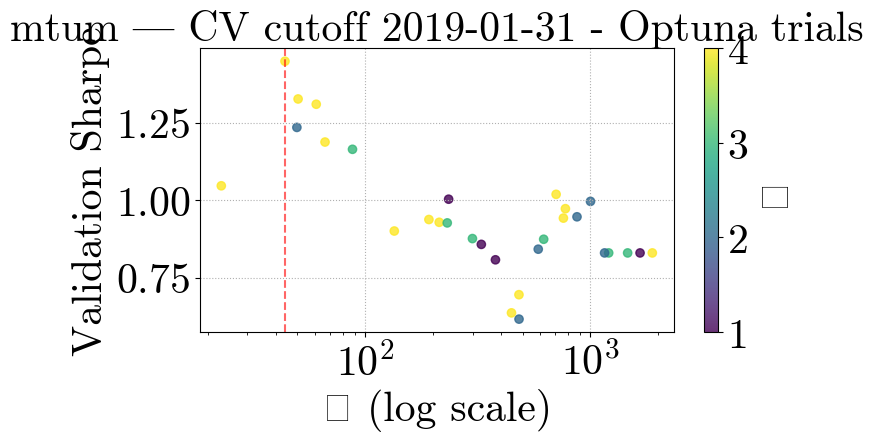

[I 2025-04-25 16:49:50,985] A new study created in memory with name: no-name-e45bd663-072a-4a46-88f8-38e7f374d315
[I 2025-04-25 16:49:55,502] Trial 0 finished with value: -0.07896211629069001 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.07896211629069001.
[I 2025-04-25 16:49:56,176] Trial 1 finished with value: -0.010185882833813399 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: -0.010185882833813399.
[I 2025-04-25 16:49:58,532] Trial 2 finished with value: 0.1676405904978235 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.1676405904978235.
[I 2025-04-25 16:50:06,337] Trial 3 finished with value: -0.08970401366868114 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.1676405904978235.
[I 2025-04-25 16:50:07,094] Trial 4 finished with value: -0.010185882833813399 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. B

Optuna best λ=269.8359, κ=3, Sharpe=0.1840


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


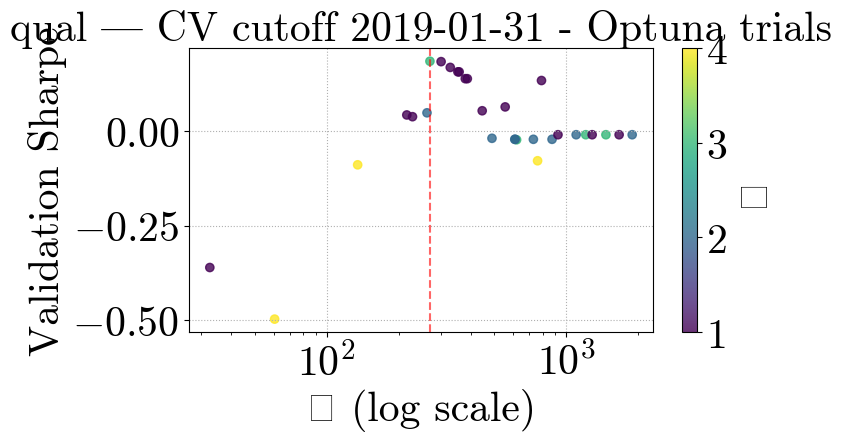

[I 2025-04-25 16:51:58,954] A new study created in memory with name: no-name-809ea43d-e237-428e-8b5d-4f33ac990673
[I 2025-04-25 16:52:02,215] Trial 0 finished with value: 0.05114141001968795 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.05114141001968795.
[I 2025-04-25 16:52:02,847] Trial 1 finished with value: -0.2938855327744556 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.05114141001968795.
[I 2025-04-25 16:52:05,066] Trial 2 finished with value: -0.07047094090112747 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.05114141001968795.
[I 2025-04-25 16:52:11,771] Trial 3 finished with value: -0.016036914350571974 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.05114141001968795.
[I 2025-04-25 16:52:12,450] Trial 4 finished with value: -0.2938855327744556 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best

Optuna best λ=759.7853, κ=4, Sharpe=0.0511


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


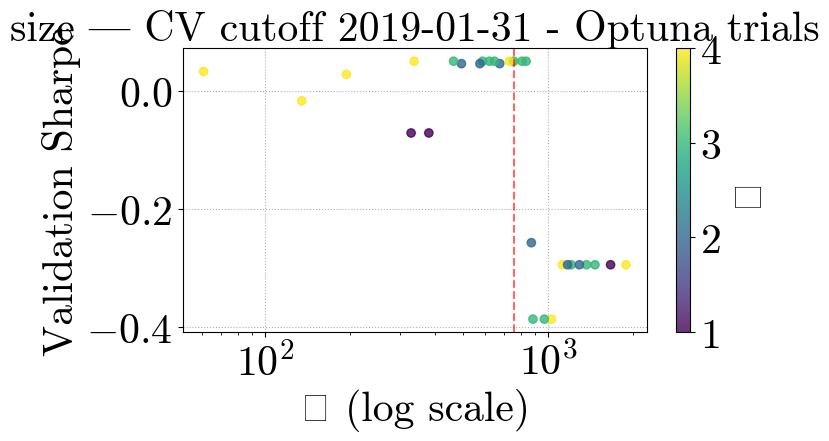

[I 2025-04-25 16:53:25,499] A new study created in memory with name: no-name-0de8226e-0c69-4603-b8b2-24366d811e32
[I 2025-04-25 16:53:28,976] Trial 0 finished with value: 0.01944968277913527 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.01944968277913527.
[I 2025-04-25 16:53:29,821] Trial 1 finished with value: -0.09989263838038737 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.01944968277913527.
[I 2025-04-25 16:53:32,131] Trial 2 finished with value: -0.05558817398383919 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.01944968277913527.
[I 2025-04-25 16:53:40,179] Trial 3 finished with value: -0.013440065457328178 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.01944968277913527.
[I 2025-04-25 16:53:41,063] Trial 4 finished with value: -0.09989263838038737 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Be

Optuna best λ=574.5425, κ=2, Sharpe=0.0443


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


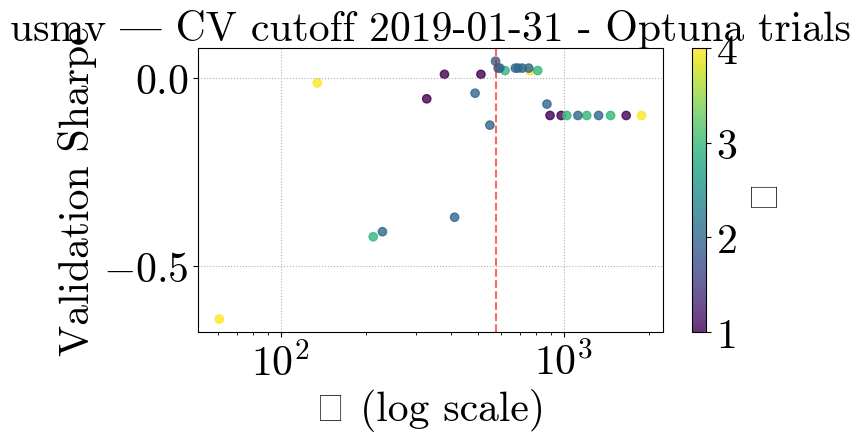

[I 2025-04-25 16:55:30,582] A new study created in memory with name: no-name-2048958d-2ef3-448d-a5fa-f2c40dd65001
[I 2025-04-25 16:55:34,638] Trial 0 finished with value: -0.06255746616920753 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.06255746616920753.
[I 2025-04-25 16:55:35,382] Trial 1 finished with value: 0.4787803850602177 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.4787803850602177.
[I 2025-04-25 16:55:37,966] Trial 2 finished with value: 0.2427296679756137 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.4787803850602177.
[I 2025-04-25 16:55:44,652] Trial 3 finished with value: 0.9210633844294541 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.9210633844294541.
[I 2025-04-25 16:55:45,445] Trial 4 finished with value: 0.4787803850602177 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tria

Optuna best λ=134.6857, κ=4, Sharpe=0.9211


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


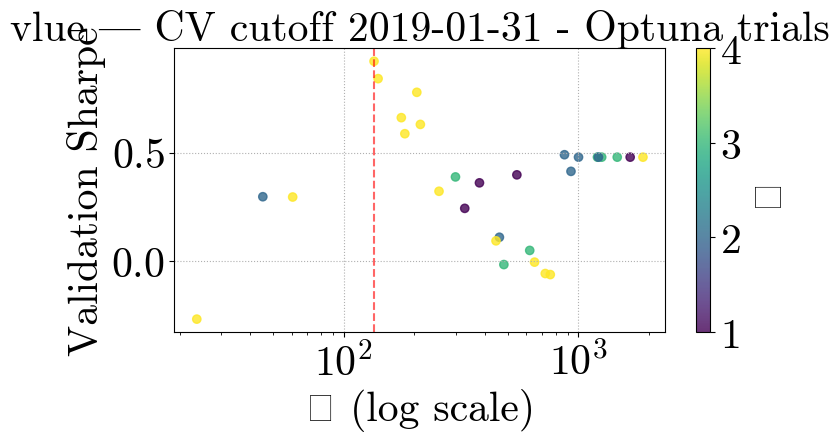

[I 2025-04-25 16:57:45,312] A new study created in memory with name: no-name-7b5b621f-af6d-4283-8094-99f4d5e31b5a
[I 2025-04-25 16:57:49,629] Trial 0 finished with value: 0.4243888349464195 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.4243888349464195.
[I 2025-04-25 16:57:50,428] Trial 1 finished with value: 0.7653277968879667 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.7653277968879667.
[I 2025-04-25 16:57:53,346] Trial 2 finished with value: 0.5122527303488004 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.7653277968879667.
[I 2025-04-25 16:58:00,330] Trial 3 finished with value: 0.31379031902936055 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.7653277968879667.
[I 2025-04-25 16:58:01,014] Trial 4 finished with value: 0.7653277968879667 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 1

Optuna best λ=66.3062, κ=2, Sharpe=1.0507


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


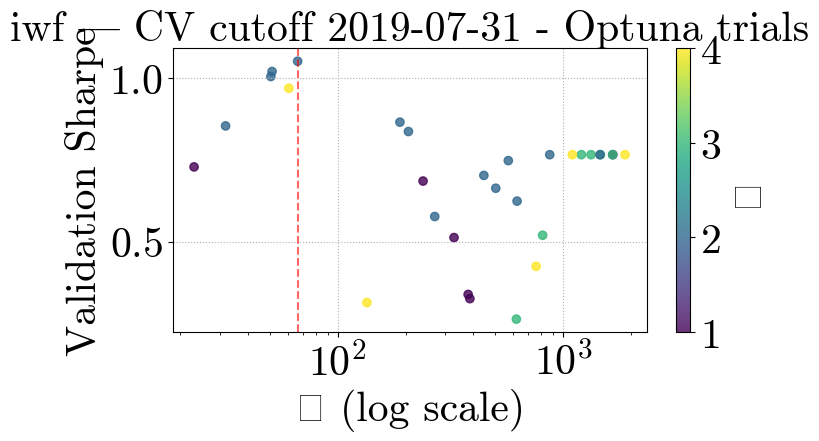

[I 2025-04-25 17:00:08,653] A new study created in memory with name: no-name-65871749-5442-4909-95ee-636fbbd0d1f7
[I 2025-04-25 17:00:12,187] Trial 0 finished with value: 1.158270851360558 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.158270851360558.
[I 2025-04-25 17:00:12,879] Trial 1 finished with value: 1.0841009694705162 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.158270851360558.
[I 2025-04-25 17:00:15,548] Trial 2 finished with value: 1.103690522696087 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 1.158270851360558.
[I 2025-04-25 17:00:23,042] Trial 3 finished with value: 1.1575964560906178 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 1.158270851360558.
[I 2025-04-25 17:00:23,796] Trial 4 finished with value: 1.0841009694705162 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 with v

Optuna best λ=44.0195, κ=4, Sharpe=1.5295


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


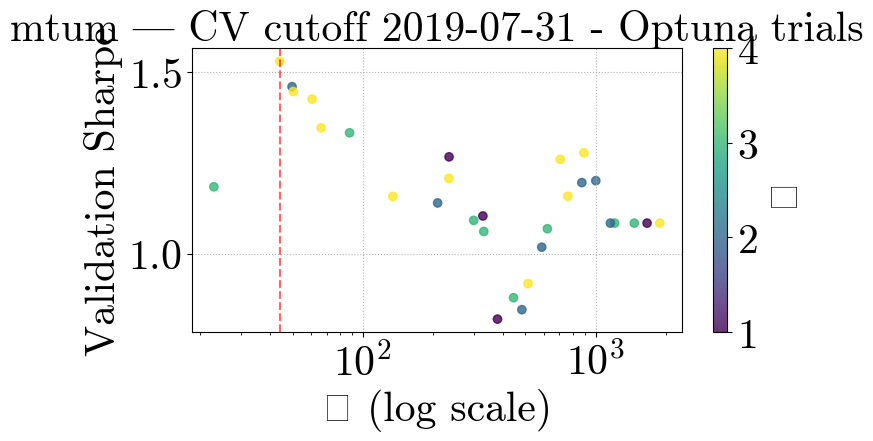

[I 2025-04-25 17:02:56,003] A new study created in memory with name: no-name-f1c1af79-b35d-4684-ad09-a9bdb2978085
[I 2025-04-25 17:03:00,960] Trial 0 finished with value: 0.5482926037324561 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.5482926037324561.
[I 2025-04-25 17:03:01,859] Trial 1 finished with value: 0.5482926037324563 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.5482926037324563.
[I 2025-04-25 17:03:04,580] Trial 2 finished with value: 0.8851029855731164 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.8851029855731164.
[I 2025-04-25 17:03:12,394] Trial 3 finished with value: 0.19929028721324518 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.8851029855731164.
[I 2025-04-25 17:03:13,280] Trial 4 finished with value: 0.5482926037324563 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 2

Optuna best λ=353.1094, κ=1, Sharpe=0.9194


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


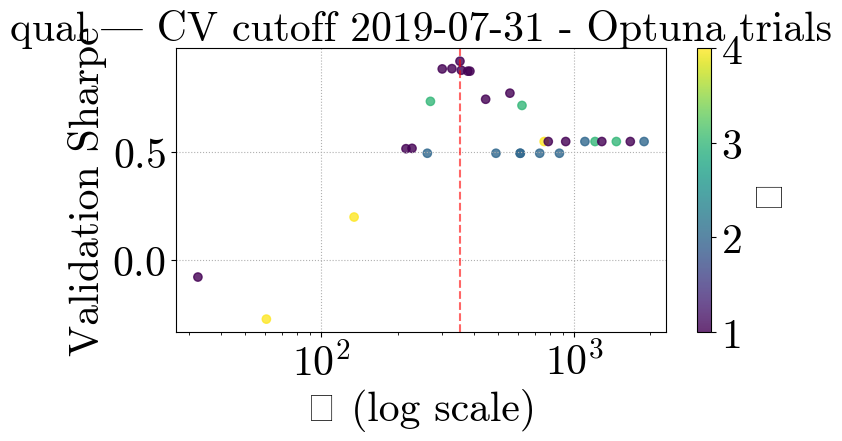

[I 2025-04-25 17:05:41,126] A new study created in memory with name: no-name-262b50da-7957-4286-a29a-156a548931ad
[I 2025-04-25 17:05:44,711] Trial 0 finished with value: -0.3029890621106029 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.3029890621106029.
[I 2025-04-25 17:05:45,411] Trial 1 finished with value: 0.35464795973355545 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.35464795973355545.
[I 2025-04-25 17:05:47,858] Trial 2 finished with value: 0.3546479597335553 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.35464795973355545.
[I 2025-04-25 17:05:57,634] Trial 3 finished with value: -0.11868025210404029 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.35464795973355545.
[I 2025-04-25 17:05:58,424] Trial 4 finished with value: 0.35464795973355545 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=1465.8674, κ=3, Sharpe=0.3546


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


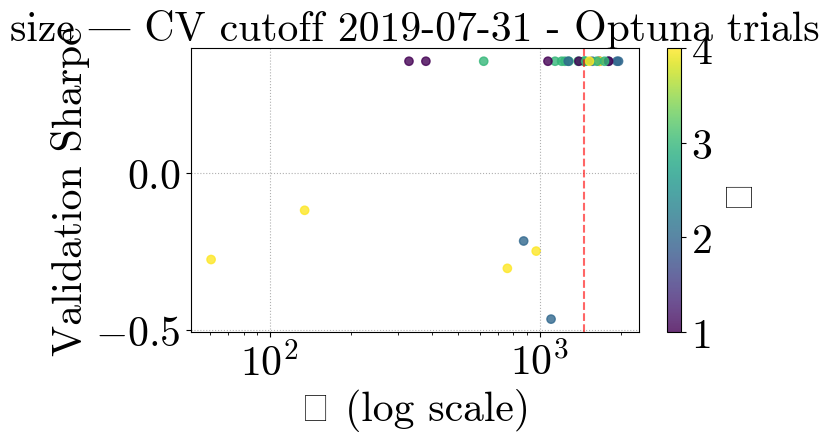

[I 2025-04-25 17:06:36,298] A new study created in memory with name: no-name-0afb9422-542a-40cf-847a-695817d4266b
[I 2025-04-25 17:06:38,941] Trial 0 finished with value: -0.03750719528083575 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.03750719528083575.
[I 2025-04-25 17:06:39,618] Trial 1 finished with value: 0.12809514348655562 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.12809514348655562.
[I 2025-04-25 17:06:41,439] Trial 2 finished with value: 0.051198415236314625 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.12809514348655562.
[I 2025-04-25 17:06:48,297] Trial 3 finished with value: -0.09813982107493349 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.12809514348655562.
[I 2025-04-25 17:06:49,385] Trial 4 finished with value: 0.12809514348655562 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Bes

Optuna best λ=1074.1964, κ=1, Sharpe=0.1834


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


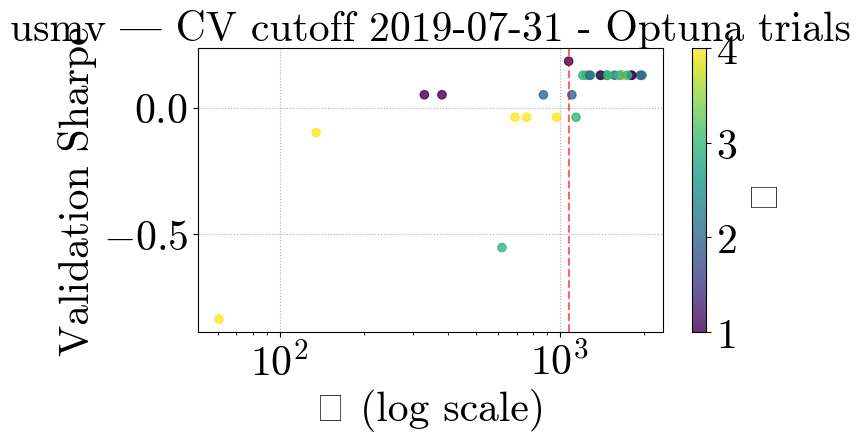

[I 2025-04-25 17:07:37,942] A new study created in memory with name: no-name-3d3468b4-2775-466f-808d-b47a1692adfb
[I 2025-04-25 17:07:41,551] Trial 0 finished with value: 0.32328891964402945 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.32328891964402945.
[I 2025-04-25 17:07:42,378] Trial 1 finished with value: 0.0050004736458409355 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.32328891964402945.
[I 2025-04-25 17:07:45,072] Trial 2 finished with value: 0.17553374094133656 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.32328891964402945.
[I 2025-04-25 17:07:51,404] Trial 3 finished with value: 1.0345773819592212 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 1.0345773819592212.
[I 2025-04-25 17:07:52,247] Trial 4 finished with value: 0.0050004736458409355 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=134.6857, κ=4, Sharpe=1.0346


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


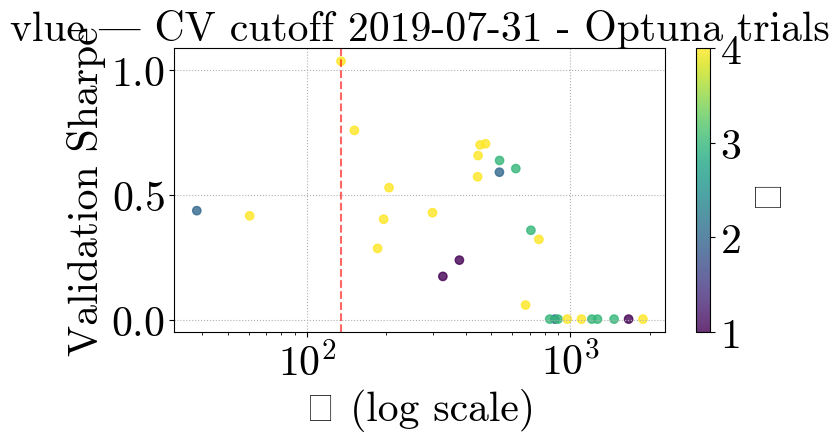

[I 2025-04-25 17:09:46,585] A new study created in memory with name: no-name-5cc25c55-d104-4595-a5a7-4d7bb904bc90
[I 2025-04-25 17:09:49,310] Trial 0 finished with value: 0.49255574693108795 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.49255574693108795.
[I 2025-04-25 17:09:49,949] Trial 1 finished with value: 1.1937242454239745 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 1.1937242454239745.
[I 2025-04-25 17:09:51,991] Trial 2 finished with value: 0.5670892979540867 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 1.1937242454239745.
[I 2025-04-25 17:09:58,762] Trial 3 finished with value: 0.4717737265373006 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 1.1937242454239745.
[I 2025-04-25 17:09:59,385] Trial 4 finished with value: 1.1937242454239745 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 

Optuna best λ=66.3062, κ=2, Sharpe=1.3264


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


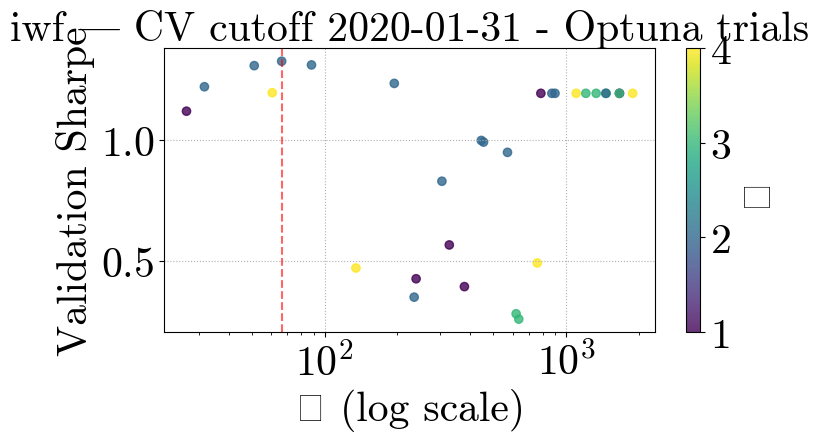

[I 2025-04-25 17:11:59,301] A new study created in memory with name: no-name-20b81cb0-05a5-4804-b6f7-52b82062a9a6
[I 2025-04-25 17:12:02,964] Trial 0 finished with value: 1.4467934776559135 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.4467934776559135.
[I 2025-04-25 17:12:03,905] Trial 1 finished with value: 1.3763185573206984 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.4467934776559135.
[I 2025-04-25 17:12:06,946] Trial 2 finished with value: 1.413130117698107 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 1.4467934776559135.
[I 2025-04-25 17:12:17,214] Trial 3 finished with value: 1.4237019220531966 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 1.4467934776559135.
[I 2025-04-25 17:12:18,054] Trial 4 finished with value: 1.3763185573206984 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 w

Optuna best λ=776.6645, κ=2, Sharpe=1.5391


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


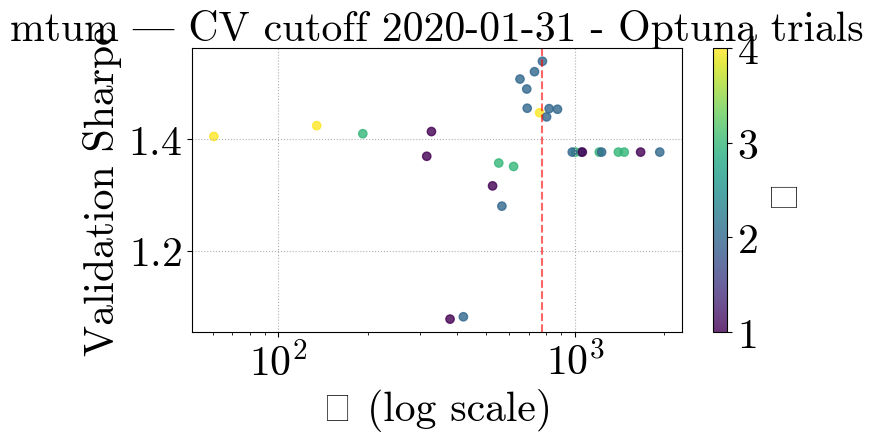

[I 2025-04-25 17:13:47,685] A new study created in memory with name: no-name-56c83437-16c4-40c8-a351-b818d2451197
[I 2025-04-25 17:13:52,310] Trial 0 finished with value: 1.064484103102235 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.064484103102235.
[I 2025-04-25 17:13:53,039] Trial 1 finished with value: 1.0644841031022352 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 1.0644841031022352.
[I 2025-04-25 17:13:55,707] Trial 2 finished with value: 1.1622726077139494 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 1.1622726077139494.
[I 2025-04-25 17:14:06,115] Trial 3 finished with value: -0.06797800834294757 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 1.1622726077139494.
[I 2025-04-25 17:14:06,937] Trial 4 finished with value: 1.0644841031022352 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 2 

Optuna best λ=353.1094, κ=1, Sharpe=1.2009


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


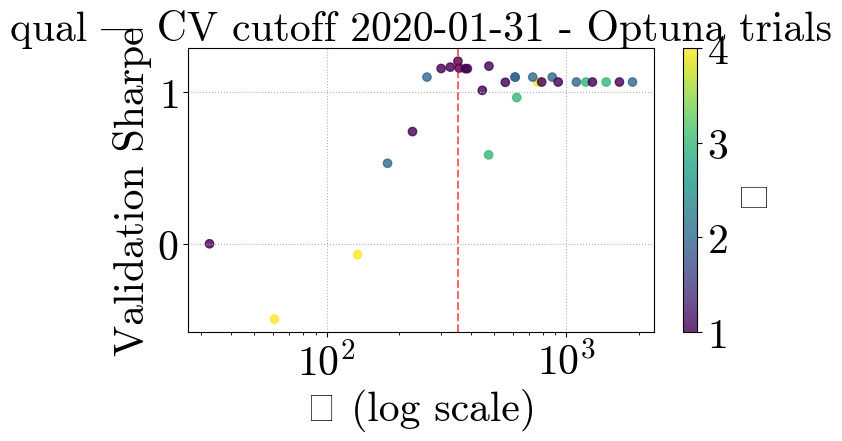

[I 2025-04-25 17:16:38,684] A new study created in memory with name: no-name-dd31bcf0-c723-4b6a-b7f1-04db429cdf5d
[I 2025-04-25 17:16:42,194] Trial 0 finished with value: 0.35046064320530534 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.35046064320530534.
[I 2025-04-25 17:16:43,107] Trial 1 finished with value: 0.35046064320530534 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.35046064320530534.
[I 2025-04-25 17:16:45,303] Trial 2 finished with value: 0.35046064320530523 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.35046064320530534.
[I 2025-04-25 17:16:54,419] Trial 3 finished with value: -0.08532065390672161 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.35046064320530534.
[I 2025-04-25 17:16:55,153] Trial 4 finished with value: 0.35046064320530534 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best i

Optuna best λ=759.7853, κ=4, Sharpe=0.3505


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


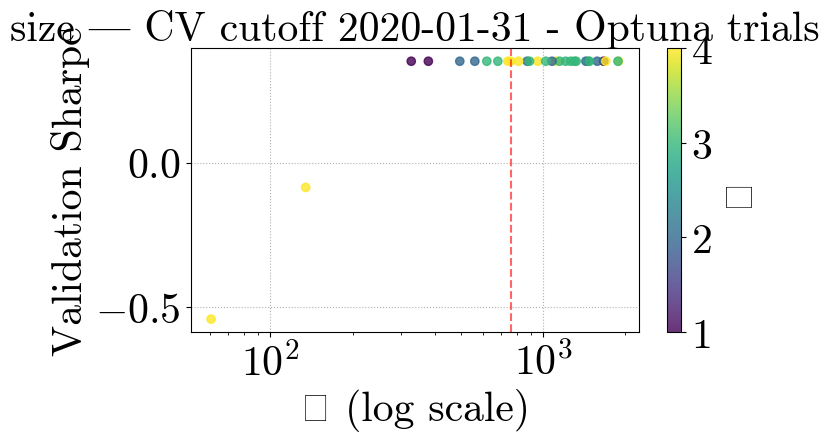

[I 2025-04-25 17:17:48,437] A new study created in memory with name: no-name-080e784c-a706-4d95-9abd-19ee20691f56
[I 2025-04-25 17:17:51,657] Trial 0 finished with value: 0.5336425167257923 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.5336425167257923.
[I 2025-04-25 17:17:52,491] Trial 1 finished with value: 0.5336425167257923 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.5336425167257923.
[I 2025-04-25 17:17:59,034] Trial 2 finished with value: -0.5392786645088177 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.5336425167257923.
[I 2025-04-25 17:18:06,306] Trial 3 finished with value: 0.07255561740156063 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.5336425167257923.
[I 2025-04-25 17:18:07,128] Trial 4 finished with value: 0.5336425167257923 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 

Optuna best λ=759.7853, κ=4, Sharpe=0.5336


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


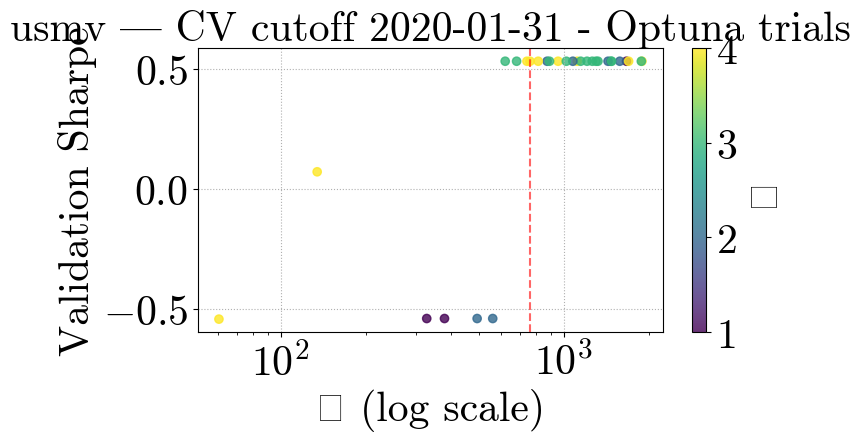

[I 2025-04-25 17:19:06,659] A new study created in memory with name: no-name-93f07836-fd67-4b9e-9aec-7438f370c055
[I 2025-04-25 17:19:10,675] Trial 0 finished with value: -0.26359636136498127 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.26359636136498127.
[I 2025-04-25 17:19:11,558] Trial 1 finished with value: -0.5720280583047029 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.26359636136498127.
[I 2025-04-25 17:19:13,758] Trial 2 finished with value: -0.3938267780612717 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.26359636136498127.
[I 2025-04-25 17:19:18,213] Trial 3 finished with value: -0.3398686321900395 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: -0.26359636136498127.
[I 2025-04-25 17:19:19,028] Trial 4 finished with value: -0.5720280583047029 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Be

Optuna best λ=220.8009, κ=1, Sharpe=-0.1161


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


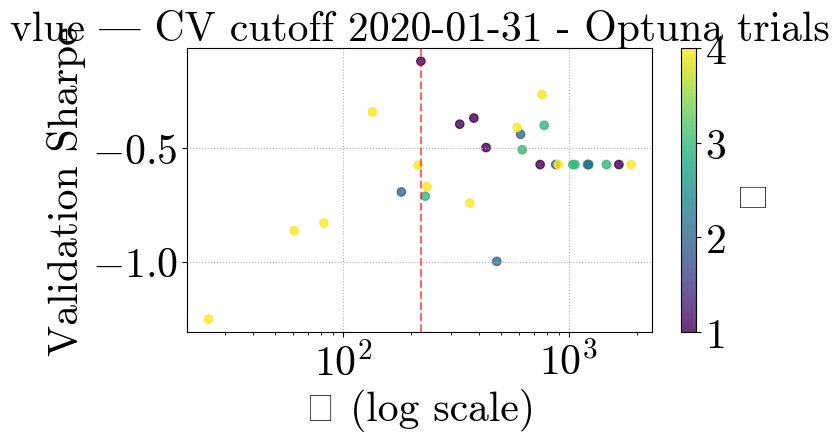

[I 2025-04-25 17:20:45,520] A new study created in memory with name: no-name-41772282-4068-4f76-957d-95eecca2cd9d
[I 2025-04-25 17:20:50,065] Trial 0 finished with value: 1.05149707356154 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.05149707356154.
[I 2025-04-25 17:20:50,871] Trial 1 finished with value: 1.3995402623242579 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 1.3995402623242579.
[I 2025-04-25 17:20:54,035] Trial 2 finished with value: 1.0368672581146083 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 1.3995402623242579.
[I 2025-04-25 17:20:59,623] Trial 3 finished with value: 1.3461225743291598 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 1.3995402623242579.
[I 2025-04-25 17:21:00,379] Trial 4 finished with value: 1.3995402623242579 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 1 with

Optuna best λ=1465.8674, κ=3, Sharpe=1.3995


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


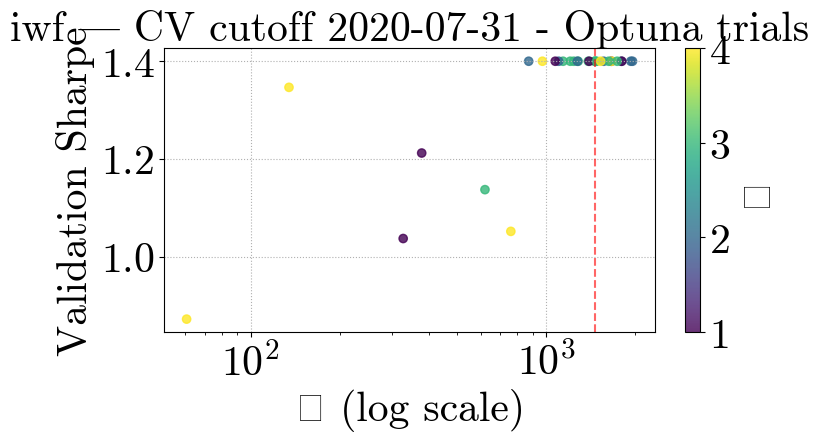

[I 2025-04-25 17:21:32,030] A new study created in memory with name: no-name-dc8a0cc0-391a-4658-898e-3f1b61bc20ab
[I 2025-04-25 17:21:35,269] Trial 0 finished with value: 1.124623340458932 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 1.124623340458932.
[I 2025-04-25 17:21:35,949] Trial 1 finished with value: 1.0419444959759203 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 1.124623340458932.
[I 2025-04-25 17:21:38,358] Trial 2 finished with value: 0.8047484338233821 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 1.124623340458932.
[I 2025-04-25 17:21:45,595] Trial 3 finished with value: 0.7128095091812221 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 1.124623340458932.
[I 2025-04-25 17:21:46,303] Trial 4 finished with value: 1.0419444959759203 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 with 

Optuna best λ=789.2295, κ=4, Sharpe=1.1497


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


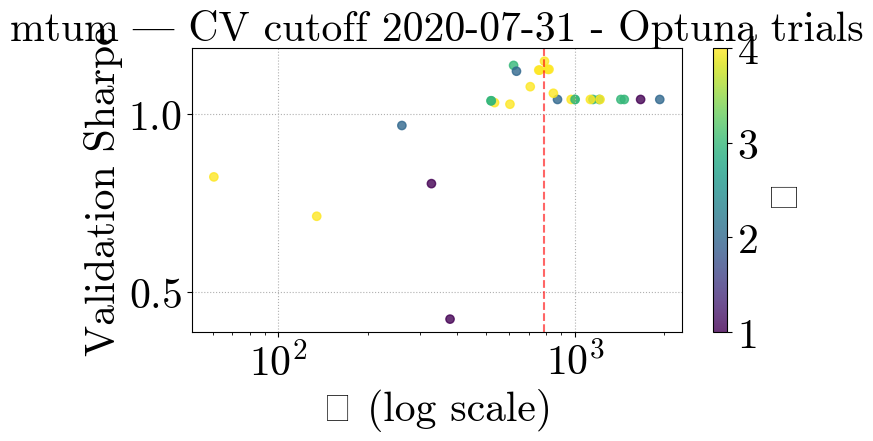

[I 2025-04-25 17:23:04,535] A new study created in memory with name: no-name-a454c41f-2bf9-4dd3-90e9-fb608e78cbe5
[I 2025-04-25 17:23:09,465] Trial 0 finished with value: 0.6925286108390091 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.6925286108390091.
[I 2025-04-25 17:23:10,084] Trial 1 finished with value: 0.6925286108390093 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.6925286108390093.
[I 2025-04-25 17:23:12,261] Trial 2 finished with value: 0.16625993773436112 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.6925286108390093.
[I 2025-04-25 17:23:20,435] Trial 3 finished with value: -0.12177740382408994 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.6925286108390093.
[I 2025-04-25 17:23:21,347] Trial 4 finished with value: 0.6925286108390093 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial

Optuna best λ=1465.8674, κ=3, Sharpe=0.6925


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


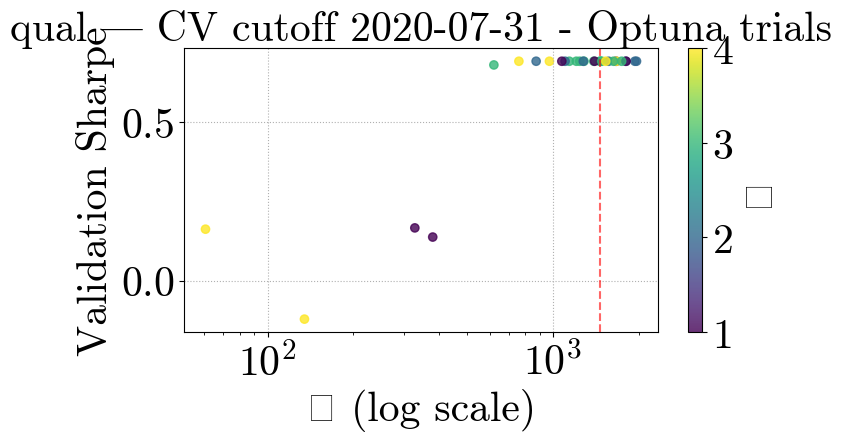

[I 2025-04-25 17:24:08,048] A new study created in memory with name: no-name-84a0ae89-90aa-400a-8952-0240651cf2ca
[I 2025-04-25 17:24:12,611] Trial 0 finished with value: 0.24804278528144805 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.24804278528144805.
[I 2025-04-25 17:24:13,402] Trial 1 finished with value: 0.6653744012966529 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.6653744012966529.
[I 2025-04-25 17:24:16,714] Trial 2 finished with value: 0.2839743961595565 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.6653744012966529.
[I 2025-04-25 17:24:25,221] Trial 3 finished with value: -0.31694372958566014 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.6653744012966529.
[I 2025-04-25 17:24:26,009] Trial 4 finished with value: 0.6653744012966529 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tria

Optuna best λ=1465.8674, κ=3, Sharpe=0.6654


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


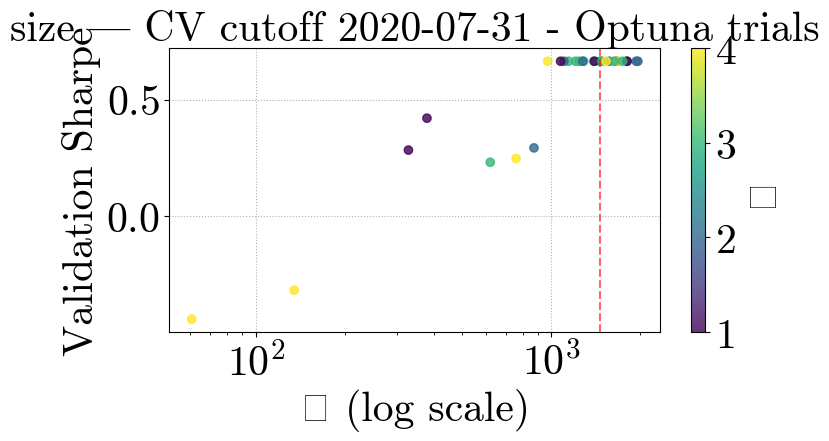

[I 2025-04-25 17:25:02,010] A new study created in memory with name: no-name-b29b39ae-7041-4dcb-be52-c8c28b80af47
[I 2025-04-25 17:25:05,122] Trial 0 finished with value: 0.014489622955907604 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.014489622955907604.
[I 2025-04-25 17:25:05,913] Trial 1 finished with value: 0.014489622955907704 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.014489622955907704.
[I 2025-04-25 17:25:08,164] Trial 2 finished with value: -1.2843274703412946 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.014489622955907704.
[I 2025-04-25 17:25:14,671] Trial 3 finished with value: -0.6535189279899565 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.014489622955907704.
[I 2025-04-25 17:25:17,388] Trial 4 finished with value: 0.014489622955907604 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. 

Optuna best λ=873.1778, κ=2, Sharpe=0.0145


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


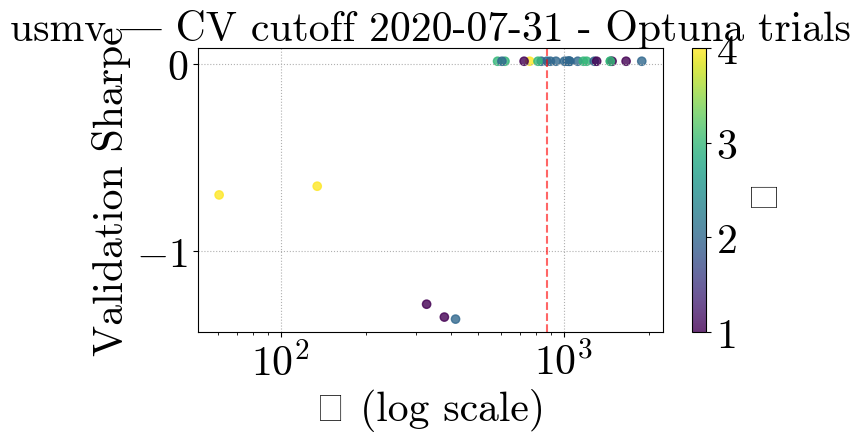

[I 2025-04-25 17:26:38,003] A new study created in memory with name: no-name-966c5c9e-ac05-48ec-88d1-69dd630c0cae
[I 2025-04-25 17:26:41,873] Trial 0 finished with value: -0.5009077719363879 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.5009077719363879.
[I 2025-04-25 17:26:42,613] Trial 1 finished with value: -1.0449900226114444 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.5009077719363879.
[I 2025-04-25 17:26:45,095] Trial 2 finished with value: -0.6053165098374943 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.5009077719363879.
[I 2025-04-25 17:26:51,119] Trial 3 finished with value: 0.36646342529852066 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.36646342529852066.
[I 2025-04-25 17:26:51,938] Trial 4 finished with value: -1.0449900226114444 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=134.6857, κ=4, Sharpe=0.3665


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


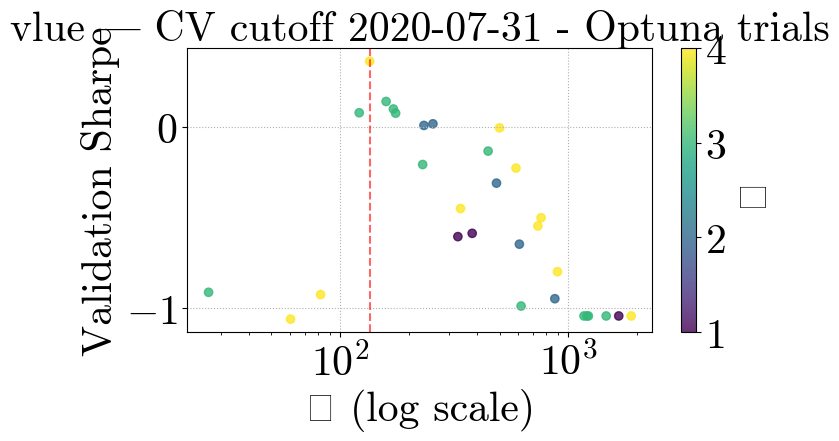

[I 2025-04-25 17:28:52,134] A new study created in memory with name: no-name-4f64a116-114d-4d02-8a8d-49dce2d76ada
[I 2025-04-25 17:28:55,402] Trial 0 finished with value: 0.8922903773460084 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.8922903773460084.
[I 2025-04-25 17:28:56,032] Trial 1 finished with value: 0.909097846000518 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.909097846000518.
[I 2025-04-25 17:28:58,145] Trial 2 finished with value: 0.8644694832776617 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.909097846000518.
[I 2025-04-25 17:29:05,471] Trial 3 finished with value: 0.9090053893843756 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.909097846000518.
[I 2025-04-25 17:29:06,188] Trial 4 finished with value: 0.909097846000518 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 1 with 

Optuna best λ=430.0641, κ=2, Sharpe=1.0925


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


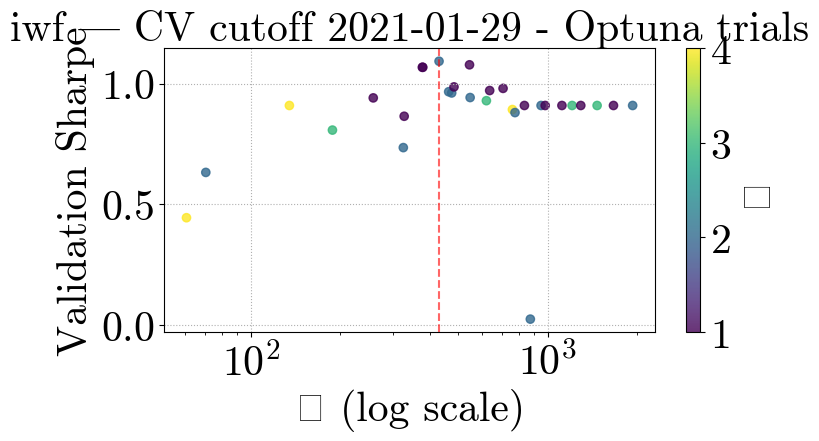

[I 2025-04-25 17:30:21,606] A new study created in memory with name: no-name-afadf06a-7a37-4ad0-95d3-029874dd045a
[I 2025-04-25 17:30:25,225] Trial 0 finished with value: 0.5786854391504482 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.5786854391504482.
[I 2025-04-25 17:30:28,124] Trial 1 finished with value: 0.7131041500482115 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.7131041500482115.
[I 2025-04-25 17:30:30,700] Trial 2 finished with value: 0.700530993829148 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.7131041500482115.
[I 2025-04-25 17:30:38,221] Trial 3 finished with value: 0.5288813567703595 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.7131041500482115.
[I 2025-04-25 17:30:41,030] Trial 4 finished with value: 0.49224542009157585 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 1 

Optuna best λ=1465.8674, κ=3, Sharpe=0.7131


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


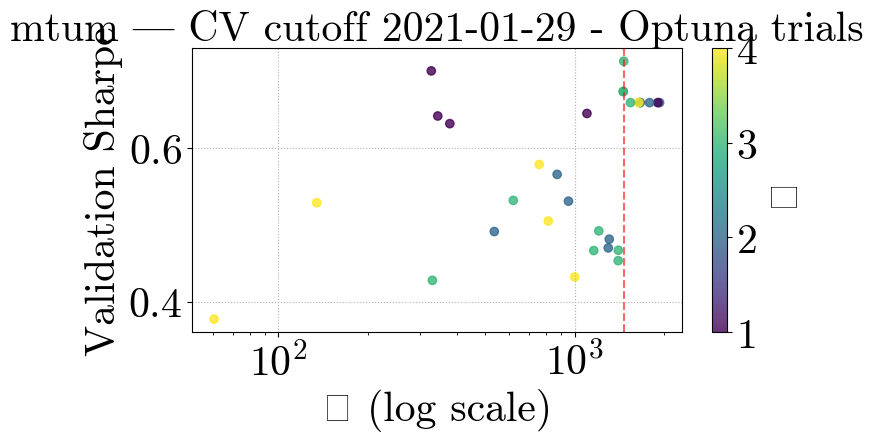

[I 2025-04-25 17:31:49,368] A new study created in memory with name: no-name-a58fde21-2632-4ca9-a9d7-4970e1dfca4c
[I 2025-04-25 17:31:54,010] Trial 0 finished with value: 0.09094819923134594 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.09094819923134594.
[I 2025-04-25 17:31:54,853] Trial 1 finished with value: 0.09094819923134592 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.09094819923134594.
[I 2025-04-25 17:31:57,044] Trial 2 finished with value: -0.026969231691176973 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.09094819923134594.
[I 2025-04-25 17:32:02,012] Trial 3 finished with value: 0.0514138531063735 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.09094819923134594.
[I 2025-04-25 17:32:02,809] Trial 4 finished with value: 0.09094819923134592 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best i

Optuna best λ=708.1569, κ=1, Sharpe=0.6023


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


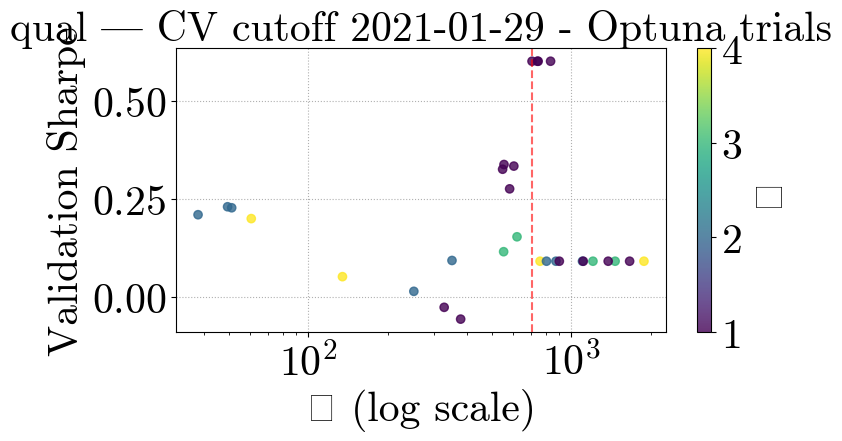

[I 2025-04-25 17:34:02,375] A new study created in memory with name: no-name-187f3fc8-9c6f-4aaf-976d-1b043d35720c
[I 2025-04-25 17:34:06,068] Trial 0 finished with value: 0.47162866314872165 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.47162866314872165.
[I 2025-04-25 17:34:06,879] Trial 1 finished with value: 0.5463917299285788 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.5463917299285788.
[I 2025-04-25 17:34:10,319] Trial 2 finished with value: 0.43267737026663805 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.5463917299285788.
[I 2025-04-25 17:34:21,835] Trial 3 finished with value: 0.019756792703604843 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.5463917299285788.
[I 2025-04-25 17:34:22,929] Trial 4 finished with value: 0.5463917299285788 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tri

Optuna best λ=1465.8674, κ=3, Sharpe=0.5464


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


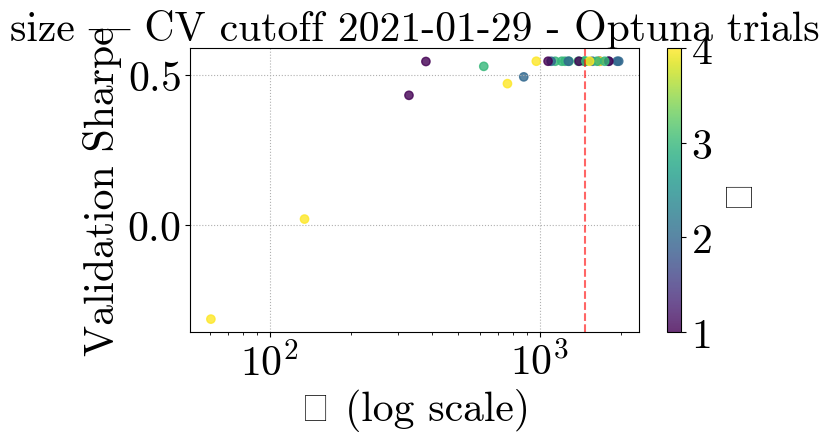

[I 2025-04-25 17:35:03,330] A new study created in memory with name: no-name-6e3bd30e-d481-410b-a548-46198bac752c
[I 2025-04-25 17:35:06,547] Trial 0 finished with value: 0.09966587603422625 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.09966587603422625.
[I 2025-04-25 17:35:07,311] Trial 1 finished with value: -0.31282597903193604 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.09966587603422625.
[I 2025-04-25 17:35:09,895] Trial 2 finished with value: -1.2329959058579674 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.09966587603422625.
[I 2025-04-25 17:35:16,908] Trial 3 finished with value: -0.3812028662569715 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.09966587603422625.
[I 2025-04-25 17:35:17,850] Trial 4 finished with value: -0.31282597903193604 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=873.1778, κ=2, Sharpe=0.1293


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


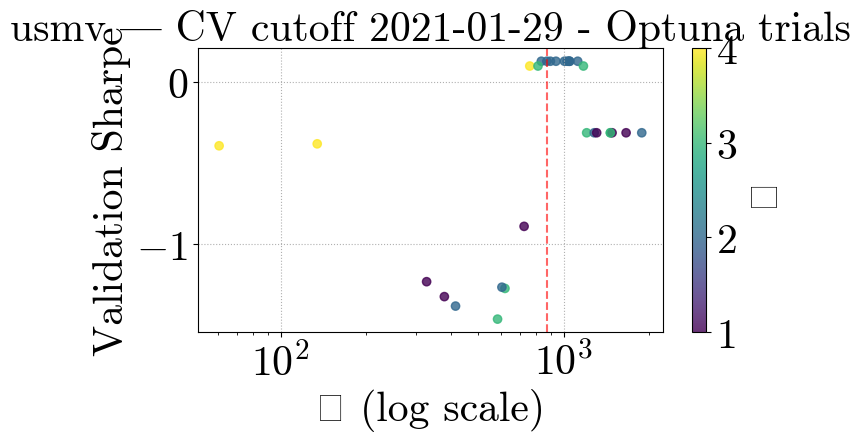

[I 2025-04-25 17:36:27,773] A new study created in memory with name: no-name-04d5836a-ceb5-4f1e-8b48-59c9bf9a8324
[I 2025-04-25 17:36:30,613] Trial 0 finished with value: -0.5868757280859969 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.5868757280859969.
[I 2025-04-25 17:36:31,281] Trial 1 finished with value: -0.7142328050395952 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.5868757280859969.
[I 2025-04-25 17:36:34,109] Trial 2 finished with value: -0.3254897247058436 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.3254897247058436.
[I 2025-04-25 17:36:41,591] Trial 3 finished with value: 0.06375595589656609 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.06375595589656609.
[I 2025-04-25 17:36:42,471] Trial 4 finished with value: -0.7142328050395952 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=219.4416, κ=2, Sharpe=0.4797


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


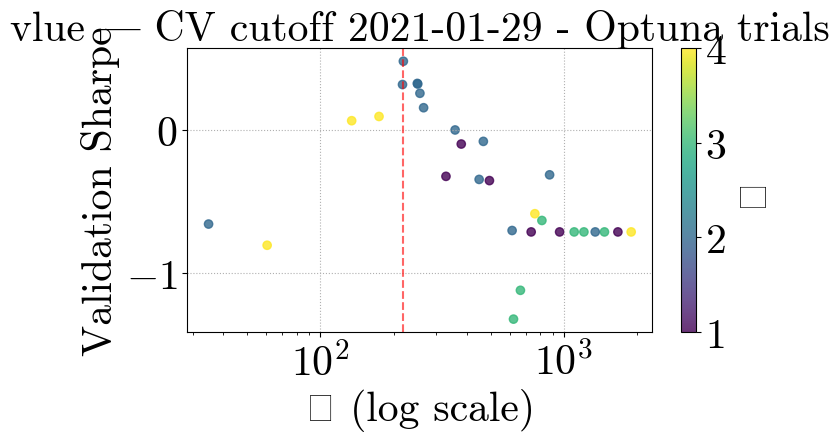

[I 2025-04-25 17:38:24,138] A new study created in memory with name: no-name-cd1ed68a-122a-404a-9eff-7510bcb9a72a
[I 2025-04-25 17:38:27,787] Trial 0 finished with value: 0.6550171221639046 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.6550171221639046.
[I 2025-04-25 17:38:28,584] Trial 1 finished with value: 0.6568421993328983 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.6568421993328983.
[I 2025-04-25 17:38:31,103] Trial 2 finished with value: 0.688159235119018 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.688159235119018.
[I 2025-04-25 17:38:39,200] Trial 3 finished with value: 0.6576333985516564 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.688159235119018.
[I 2025-04-25 17:38:40,032] Trial 4 finished with value: 0.6568421993328983 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 2 wit

Optuna best λ=430.0641, κ=2, Sharpe=0.9073


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


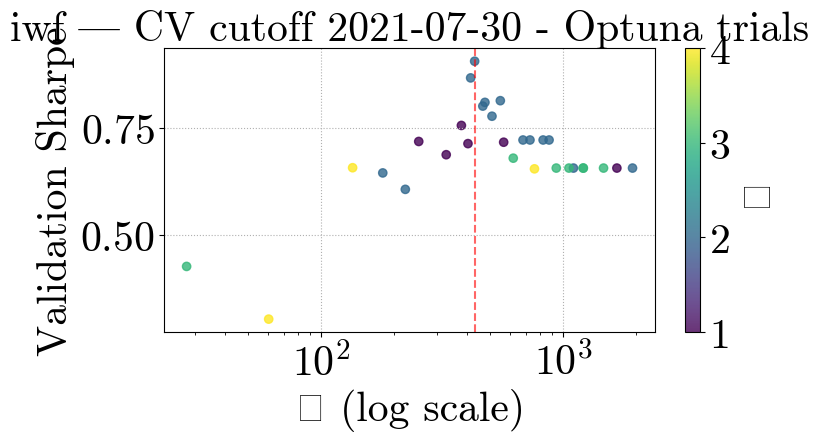

[I 2025-04-25 17:40:11,594] A new study created in memory with name: no-name-3ca04fc8-2d12-41d1-87c5-72ecf476e24b
[I 2025-04-25 17:40:16,455] Trial 0 finished with value: 0.3036208339032541 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.3036208339032541.
[I 2025-04-25 17:40:17,242] Trial 1 finished with value: 0.2546924714707974 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.3036208339032541.
[I 2025-04-25 17:40:19,923] Trial 2 finished with value: 0.21453702557018767 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.3036208339032541.
[I 2025-04-25 17:40:29,639] Trial 3 finished with value: -0.14338619618637377 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.3036208339032541.
[I 2025-04-25 17:40:30,445] Trial 4 finished with value: 0.2546924714707974 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial

Optuna best λ=759.7853, κ=4, Sharpe=0.3036


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


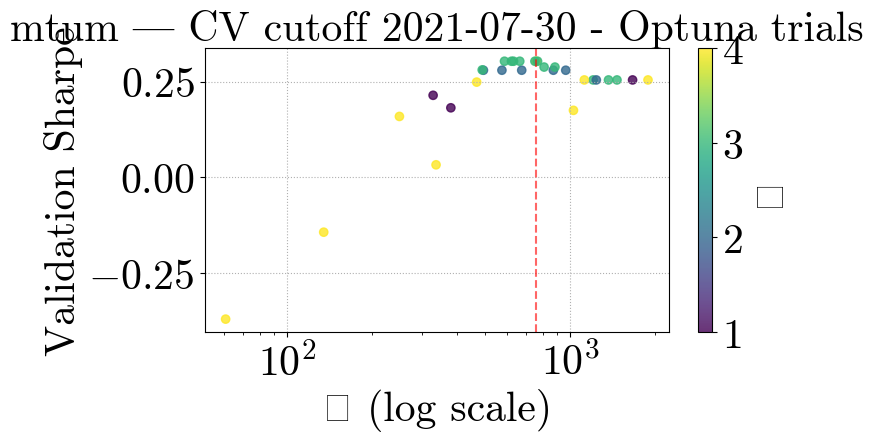

[I 2025-04-25 17:42:08,839] A new study created in memory with name: no-name-525515b4-0c0e-4bee-9ff2-b1eecca51b8d
[I 2025-04-25 17:42:13,554] Trial 0 finished with value: 0.5215105594824926 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.5215105594824926.
[I 2025-04-25 17:42:14,310] Trial 1 finished with value: 0.5215105594824925 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.5215105594824926.
[I 2025-04-25 17:42:16,826] Trial 2 finished with value: 0.20458482101589226 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.5215105594824926.
[I 2025-04-25 17:42:22,617] Trial 3 finished with value: -0.052611782358047574 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.5215105594824926.
[I 2025-04-25 17:42:23,536] Trial 4 finished with value: 0.5215105594824925 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tria

Optuna best λ=620.9253, κ=3, Sharpe=0.5921


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


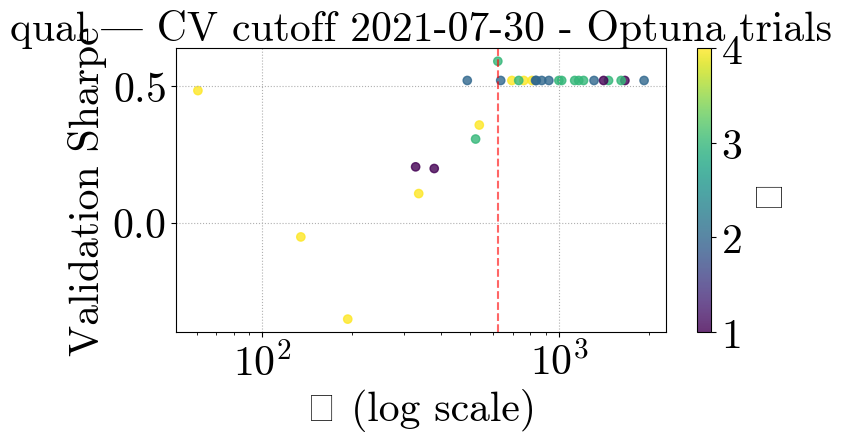

[I 2025-04-25 17:44:33,471] A new study created in memory with name: no-name-ec87b9cc-647b-4450-9053-40a184171bb9
[I 2025-04-25 17:44:36,803] Trial 0 finished with value: 0.5193622100810009 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.5193622100810009.
[I 2025-04-25 17:44:37,722] Trial 1 finished with value: 0.5626305928198788 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.5626305928198788.
[I 2025-04-25 17:44:40,364] Trial 2 finished with value: 0.402123236176631 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.5626305928198788.
[I 2025-04-25 17:44:48,583] Trial 3 finished with value: -0.08793008675057445 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.5626305928198788.
[I 2025-04-25 17:44:49,366] Trial 4 finished with value: 0.5626305928198788 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 1

Optuna best λ=1465.8674, κ=3, Sharpe=0.5626


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


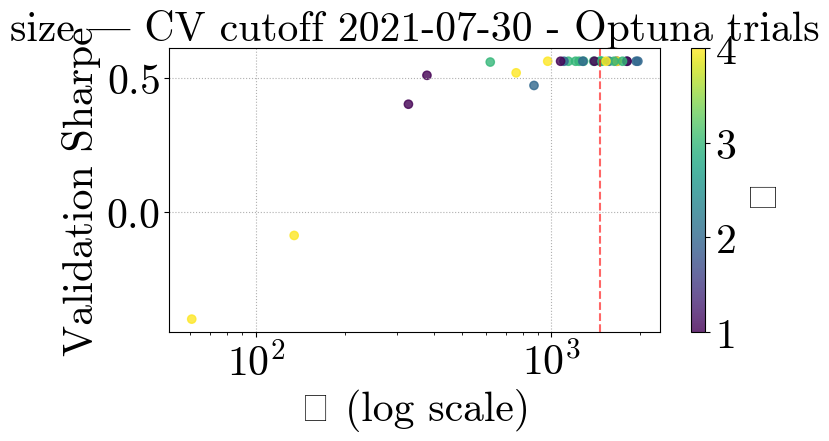

[I 2025-04-25 17:45:31,278] A new study created in memory with name: no-name-dbac0e59-ba7b-4b6e-a219-b1fda209c405
[I 2025-04-25 17:45:34,420] Trial 0 finished with value: -0.04444626761484946 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.04444626761484946.
[I 2025-04-25 17:45:35,202] Trial 1 finished with value: -0.3391490728037122 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.04444626761484946.
[I 2025-04-25 17:45:37,758] Trial 2 finished with value: -1.2254823011720195 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.04444626761484946.
[I 2025-04-25 17:45:45,504] Trial 3 finished with value: -0.47145493037379815 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: -0.04444626761484946.
[I 2025-04-25 17:45:47,088] Trial 4 finished with value: -0.3391490728037122 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. B

Optuna best λ=873.1778, κ=2, Sharpe=0.3350


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


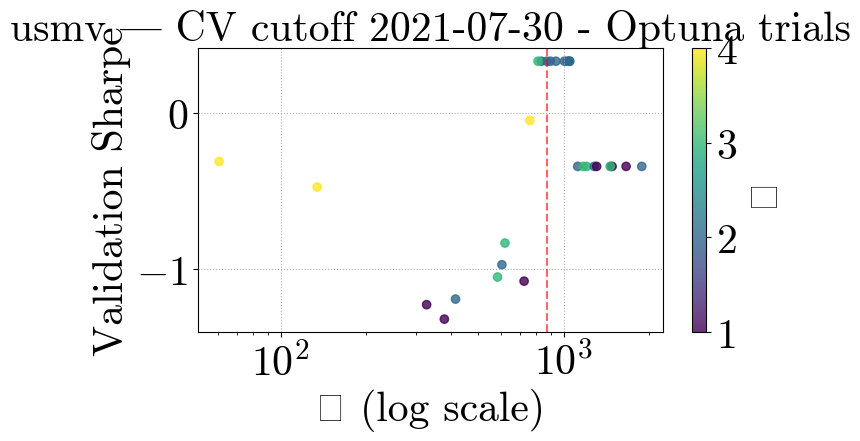

[I 2025-04-25 17:47:00,977] A new study created in memory with name: no-name-18993444-8739-453b-898c-e45e73fa75d2
[I 2025-04-25 17:47:04,328] Trial 0 finished with value: -0.6822292071687676 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.6822292071687676.
[I 2025-04-25 17:47:05,215] Trial 1 finished with value: -0.6245018191864944 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: -0.6245018191864944.
[I 2025-04-25 17:47:09,203] Trial 2 finished with value: -0.07212830540210484 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.07212830540210484.
[I 2025-04-25 17:47:18,087] Trial 3 finished with value: 0.587061941139868 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.587061941139868.
[I 2025-04-25 17:47:19,033] Trial 4 finished with value: -0.6245018191864944 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is t

Optuna best λ=134.6857, κ=4, Sharpe=0.5871


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


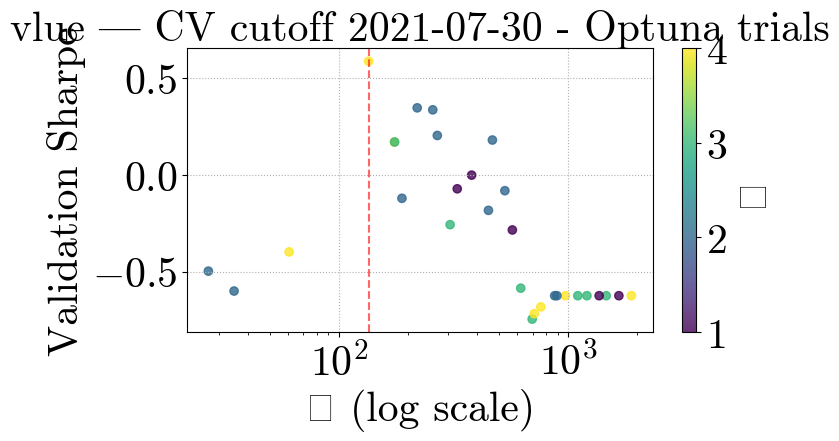

[I 2025-04-25 17:49:17,238] A new study created in memory with name: no-name-54127e95-ea2b-4177-9f6e-91ee961c7552
[I 2025-04-25 17:49:21,559] Trial 0 finished with value: 0.5881900455997304 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.5881900455997304.
[I 2025-04-25 17:49:22,347] Trial 1 finished with value: 0.5881900455997302 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.5881900455997304.
[I 2025-04-25 17:49:24,837] Trial 2 finished with value: 0.5570845850026623 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.5881900455997304.
[I 2025-04-25 17:49:29,932] Trial 3 finished with value: 0.5398442357044093 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.5881900455997304.
[I 2025-04-25 17:49:30,711] Trial 4 finished with value: 0.5881900455997302 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 

Optuna best λ=455.7232, κ=3, Sharpe=0.6605


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


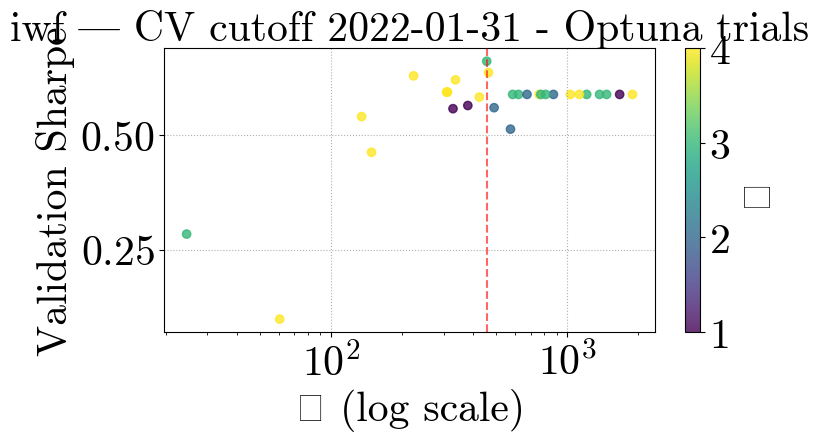

[I 2025-04-25 17:51:13,874] A new study created in memory with name: no-name-6dc7748a-31b5-41cf-b866-368a69fff922
[I 2025-04-25 17:51:17,311] Trial 0 finished with value: 0.1030252982340513 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.1030252982340513.
[I 2025-04-25 17:51:18,084] Trial 1 finished with value: 0.10302529823405149 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.10302529823405149.
[I 2025-04-25 17:51:20,630] Trial 2 finished with value: -0.05519765600900794 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.10302529823405149.
[I 2025-04-25 17:51:31,914] Trial 3 finished with value: -0.04582810208625628 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.10302529823405149.
[I 2025-04-25 17:51:32,757] Trial 4 finished with value: 0.10302529823405149 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=636.7133, κ=1, Sharpe=0.9060


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


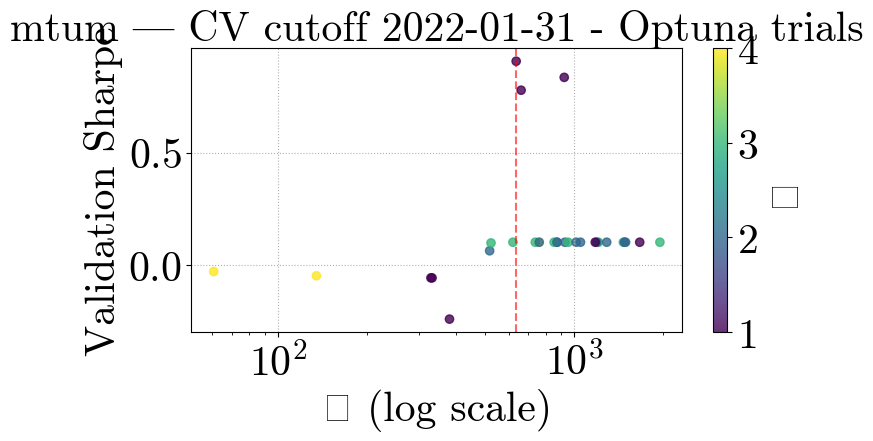

[I 2025-04-25 17:53:02,941] A new study created in memory with name: no-name-87c795f3-4ebc-4f1c-a2fb-a3e8d3048dd4
[I 2025-04-25 17:53:06,119] Trial 0 finished with value: 0.21168089245979116 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.21168089245979116.
[I 2025-04-25 17:53:06,908] Trial 1 finished with value: 0.2116808924597912 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.2116808924597912.
[I 2025-04-25 17:53:09,635] Trial 2 finished with value: -0.11468061995132418 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.2116808924597912.
[I 2025-04-25 17:53:17,370] Trial 3 finished with value: -0.07547335803582368 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.2116808924597912.
[I 2025-04-25 17:53:18,228] Trial 4 finished with value: 0.2116808924597912 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tr

Optuna best λ=60.6134, κ=4, Sharpe=0.7706


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


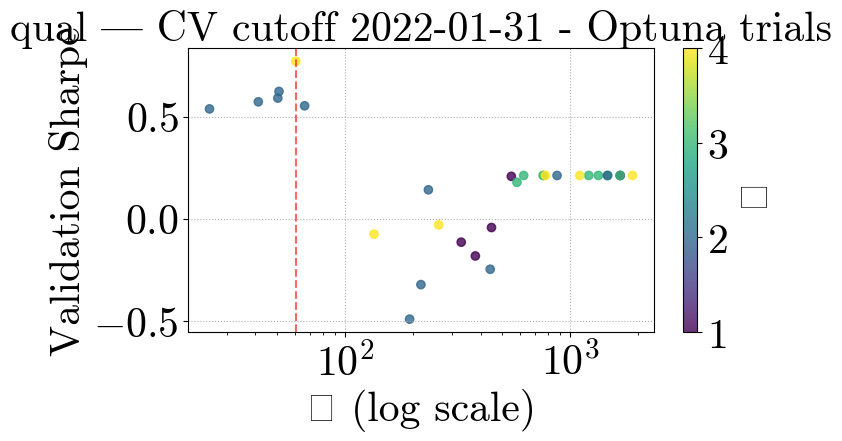

[I 2025-04-25 17:55:48,010] A new study created in memory with name: no-name-cd10c1ed-304a-4526-b6a9-1f2e29353acd
[I 2025-04-25 17:55:51,539] Trial 0 finished with value: 0.6303878901810568 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.6303878901810568.
[I 2025-04-25 17:55:52,305] Trial 1 finished with value: 0.6976593558783801 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.6976593558783801.
[I 2025-04-25 17:55:55,132] Trial 2 finished with value: 0.6318518480665684 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.6976593558783801.
[I 2025-04-25 17:56:02,990] Trial 3 finished with value: -0.18621637504358568 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.6976593558783801.
[I 2025-04-25 17:56:03,784] Trial 4 finished with value: 0.6976593558783801 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 

Optuna best λ=1465.8674, κ=3, Sharpe=0.6977


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


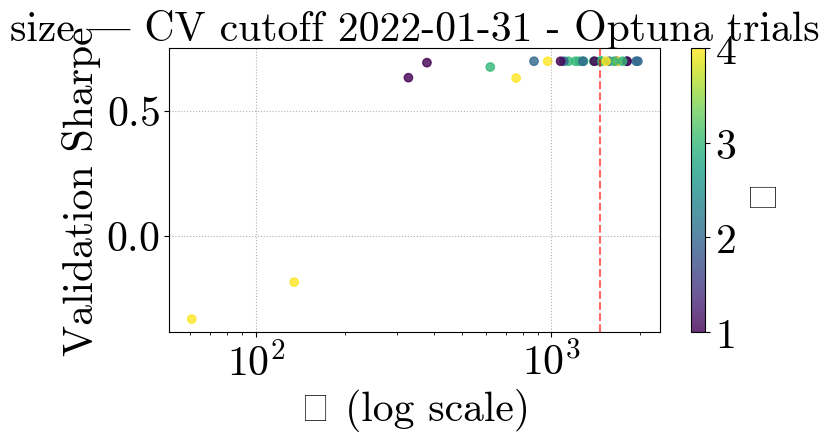

[I 2025-04-25 17:56:39,833] A new study created in memory with name: no-name-216d406a-38ae-4d60-8ab0-983cf887761f
[I 2025-04-25 17:56:43,286] Trial 0 finished with value: -0.6400591897564113 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.6400591897564113.
[I 2025-04-25 17:56:46,094] Trial 1 finished with value: -0.6400591897564113 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.6400591897564113.
[I 2025-04-25 17:56:48,374] Trial 2 finished with value: -1.269610063093231 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.6400591897564113.
[I 2025-04-25 17:56:58,875] Trial 3 finished with value: -0.7712675740911973 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: -0.6400591897564113.
[I 2025-04-25 17:57:01,724] Trial 4 finished with value: -0.6400591897564113 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is 

Optuna best λ=1664.2846, κ=1, Sharpe=-0.6401


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


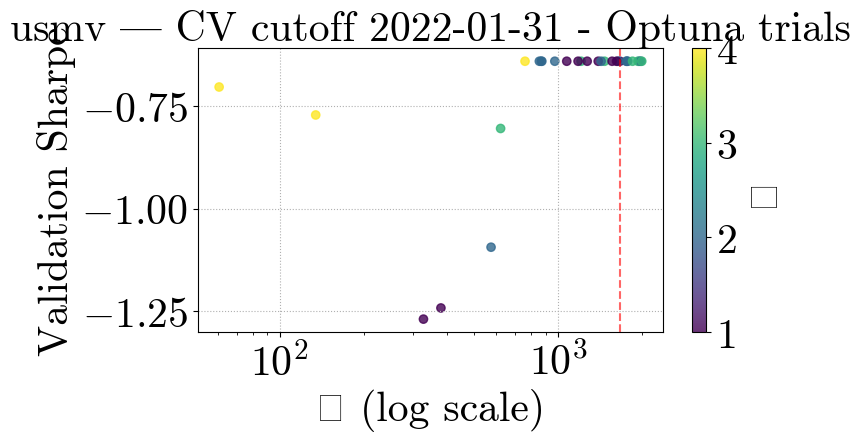

[I 2025-04-25 17:57:51,850] A new study created in memory with name: no-name-bdc6495b-ea74-4f47-8bfb-25f796c82f68
[I 2025-04-25 17:57:56,276] Trial 0 finished with value: -0.38867840870556647 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.38867840870556647.
[I 2025-04-25 17:57:57,102] Trial 1 finished with value: -0.38867840870556664 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.38867840870556647.
[I 2025-04-25 17:58:00,386] Trial 2 finished with value: 0.12398537295147515 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.12398537295147515.
[I 2025-04-25 17:58:06,656] Trial 3 finished with value: 0.1293291049498858 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.1293291049498858.
[I 2025-04-25 17:58:07,425] Trial 4 finished with value: -0.38867840870556664 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best

Optuna best λ=382.8183, κ=2, Sharpe=0.4263


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


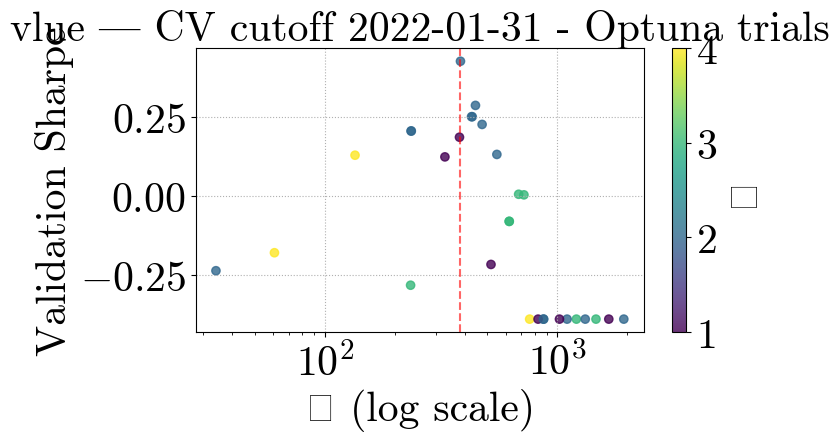

[I 2025-04-25 18:00:00,601] A new study created in memory with name: no-name-44c2fed7-ea6b-4d0e-ba95-d6798f5eff92
[I 2025-04-25 18:00:03,200] Trial 0 finished with value: 0.09600612605845235 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.09600612605845235.
[I 2025-04-25 18:00:03,957] Trial 1 finished with value: 0.23617063361963508 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.23617063361963508.
[I 2025-04-25 18:00:06,942] Trial 2 finished with value: 0.20788640133572148 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.23617063361963508.
[I 2025-04-25 18:00:13,755] Trial 3 finished with value: 0.21759300907500143 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.23617063361963508.
[I 2025-04-25 18:00:15,595] Trial 4 finished with value: 0.3417553355329265 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is 

Optuna best λ=1249.1112, κ=4, Sharpe=0.4362


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


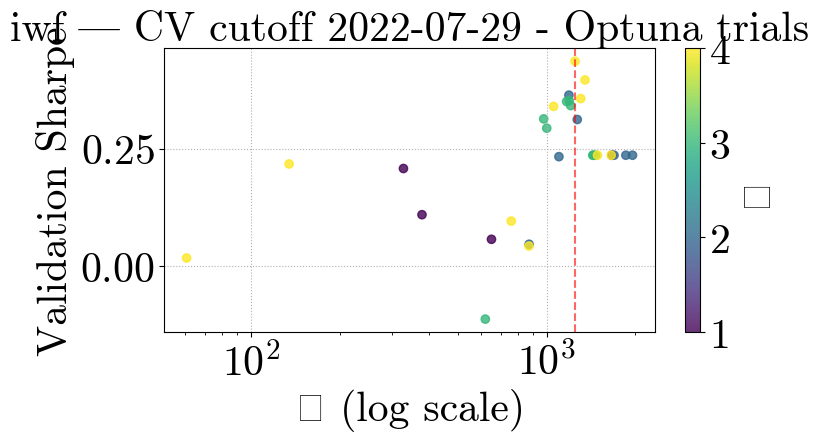

[I 2025-04-25 18:01:12,630] A new study created in memory with name: no-name-1ca5f21f-4d8a-450e-8c85-4fd19a068170
[I 2025-04-25 18:01:16,376] Trial 0 finished with value: -0.07250081564408505 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.07250081564408505.
[I 2025-04-25 18:01:19,397] Trial 1 finished with value: -0.11135758572209692 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.07250081564408505.
[I 2025-04-25 18:01:22,001] Trial 2 finished with value: 0.21317902453767973 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.21317902453767973.
[I 2025-04-25 18:01:31,014] Trial 3 finished with value: -0.16060892719799744 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.21317902453767973.
[I 2025-04-25 18:01:34,113] Trial 4 finished with value: -0.15662007031479727 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. B

Optuna best λ=316.5094, κ=1, Sharpe=0.2172


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


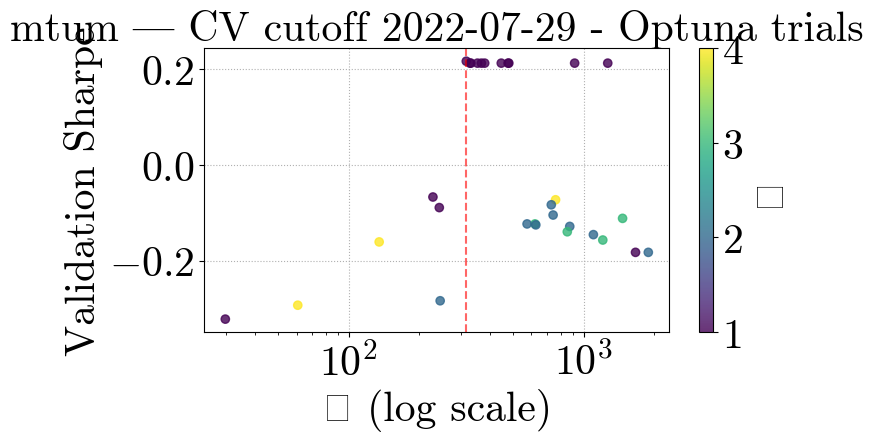

[I 2025-04-25 18:03:05,535] A new study created in memory with name: no-name-b24750ca-3bbe-41c4-b373-f8858405cd8a
[I 2025-04-25 18:03:09,928] Trial 0 finished with value: -0.16156918771689951 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.16156918771689951.
[I 2025-04-25 18:03:13,510] Trial 1 finished with value: -0.0018550988072114738 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: -0.0018550988072114738.
[I 2025-04-25 18:03:15,734] Trial 2 finished with value: -0.24899509224952487 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: -0.0018550988072114738.
[I 2025-04-25 18:03:21,854] Trial 3 finished with value: -0.07045806411199274 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: -0.0018550988072114738.
[I 2025-04-25 18:03:25,455] Trial 4 finished with value: -0.0018550988072114738 and parameters: {'lambda': 1207.3409317440555, '

Optuna best λ=25.0996, κ=3, Sharpe=0.4400


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


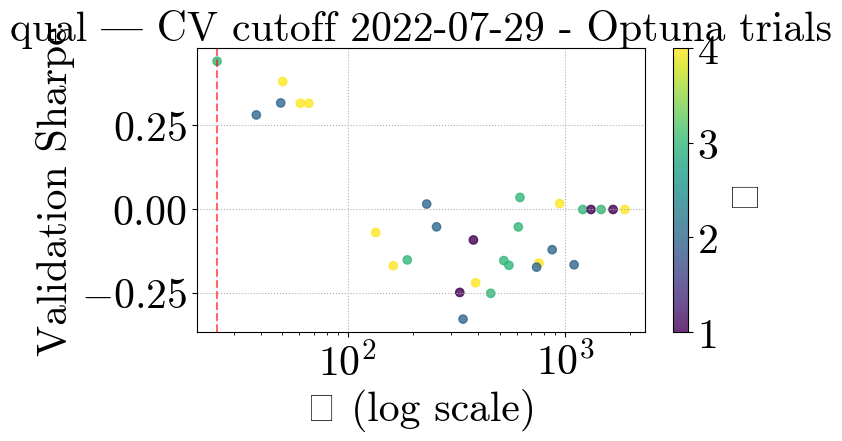

[I 2025-04-25 18:06:04,098] A new study created in memory with name: no-name-49effb4e-da96-4ba4-9515-6f158420acfe
[I 2025-04-25 18:06:08,165] Trial 0 finished with value: 0.6001837410778601 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.6001837410778601.
[I 2025-04-25 18:06:08,834] Trial 1 finished with value: 0.5950624392450116 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.6001837410778601.
[I 2025-04-25 18:06:11,101] Trial 2 finished with value: 0.542816444786011 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.6001837410778601.
[I 2025-04-25 18:06:19,870] Trial 3 finished with value: 0.2032281173437774 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.6001837410778601.
[I 2025-04-25 18:06:23,434] Trial 4 finished with value: 0.5980003018645984 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 w

Optuna best λ=603.6158, κ=4, Sharpe=0.6017


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


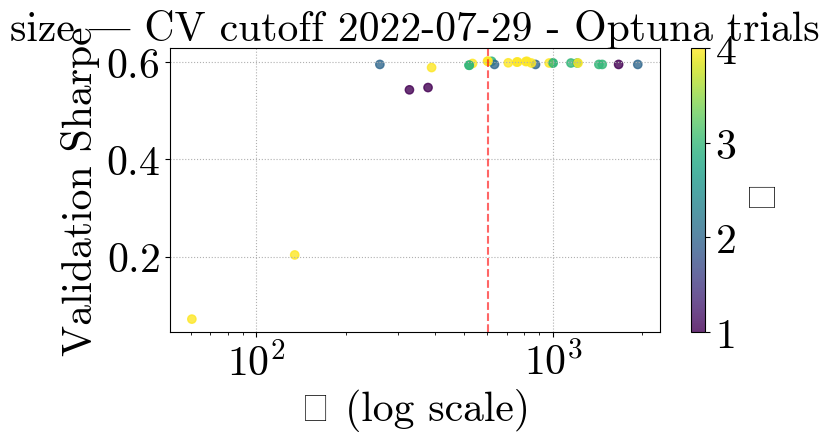

[I 2025-04-25 18:08:19,228] A new study created in memory with name: no-name-aff7530a-5cd6-4a83-8be2-d5beae1c66b6
[I 2025-04-25 18:08:22,462] Trial 0 finished with value: -0.6084944746657965 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.6084944746657965.
[I 2025-04-25 18:08:25,056] Trial 1 finished with value: -0.5293189100155361 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: -0.5293189100155361.
[I 2025-04-25 18:08:27,146] Trial 2 finished with value: -0.6714477142543129 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: -0.5293189100155361.
[I 2025-04-25 18:08:35,980] Trial 3 finished with value: -0.29019378859092804 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: -0.29019378859092804.
[I 2025-04-25 18:08:38,906] Trial 4 finished with value: -0.5293189100155361 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=34.8609, κ=4, Sharpe=0.2006


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


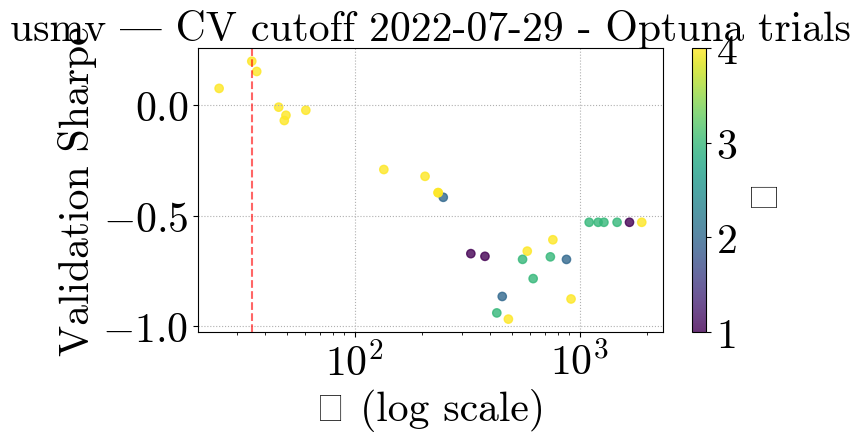

[I 2025-04-25 18:10:57,625] A new study created in memory with name: no-name-7d863983-4dce-4f95-9a08-ca0b85cd8ee3
[I 2025-04-25 18:11:01,793] Trial 0 finished with value: 0.06312478226600694 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.06312478226600694.
[I 2025-04-25 18:11:02,513] Trial 1 finished with value: -0.2620721266258881 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.06312478226600694.
[I 2025-04-25 18:11:05,189] Trial 2 finished with value: 0.48946827461820314 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.48946827461820314.
[I 2025-04-25 18:11:12,675] Trial 3 finished with value: 0.6724104962150506 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.6724104962150506.
[I 2025-04-25 18:11:16,222] Trial 4 finished with value: -0.4276553014363482 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is t

Optuna best λ=134.6857, κ=4, Sharpe=0.6724


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


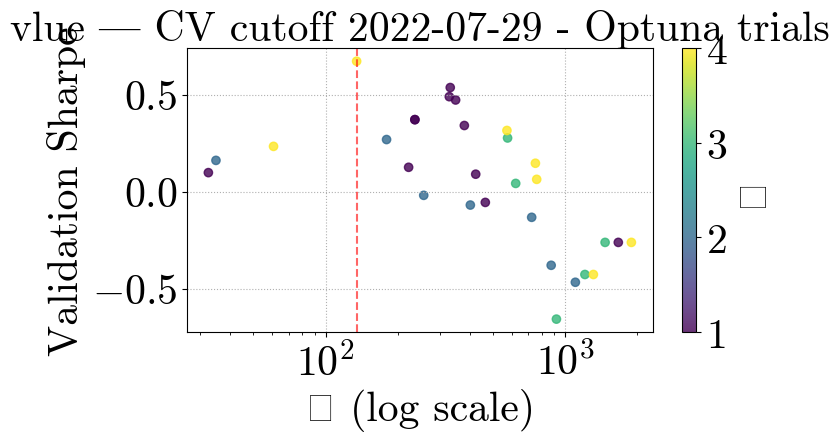

[I 2025-04-25 18:13:14,358] A new study created in memory with name: no-name-3cd7cfcf-b44d-4f08-811f-257e6d80ec5c
[I 2025-04-25 18:13:16,672] Trial 0 finished with value: -0.27126578524243966 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.27126578524243966.
[I 2025-04-25 18:13:17,377] Trial 1 finished with value: 0.05670575274685342 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.05670575274685342.
[I 2025-04-25 18:13:19,935] Trial 2 finished with value: -0.042632059858998754 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.05670575274685342.
[I 2025-04-25 18:13:27,443] Trial 3 finished with value: 0.05674055733037812 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.05674055733037812.
[I 2025-04-25 18:13:29,438] Trial 4 finished with value: -0.06898733108681171 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Be

Optuna best λ=885.4265, κ=1, Sharpe=0.0636


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


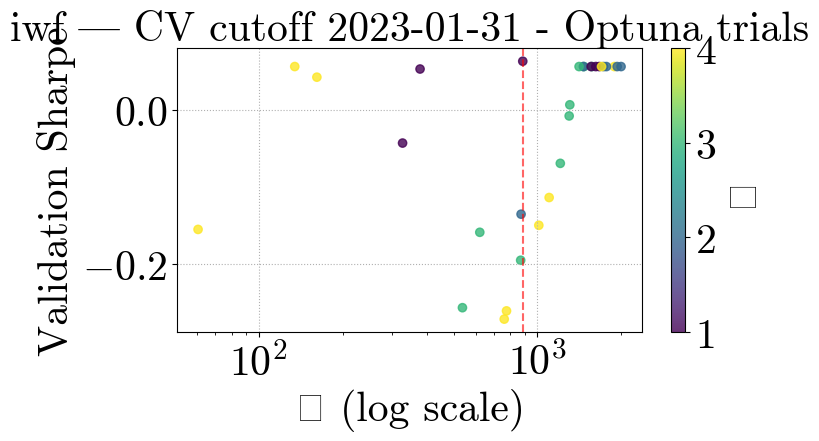

[I 2025-04-25 18:14:22,022] A new study created in memory with name: no-name-5d629315-5abf-44ec-85b0-86d725cf3296
[I 2025-04-25 18:14:29,238] Trial 0 finished with value: -0.10080332608604564 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.10080332608604564.
[I 2025-04-25 18:14:34,731] Trial 1 finished with value: -0.19557469594226623 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.10080332608604564.
[I 2025-04-25 18:14:37,614] Trial 2 finished with value: 0.7001951366251385 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.7001951366251385.
[I 2025-04-25 18:14:51,671] Trial 3 finished with value: -0.4716025066443581 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.7001951366251385.
[I 2025-04-25 18:14:57,366] Trial 4 finished with value: -0.18969285199324099 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=328.1378, κ=1, Sharpe=0.7002


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


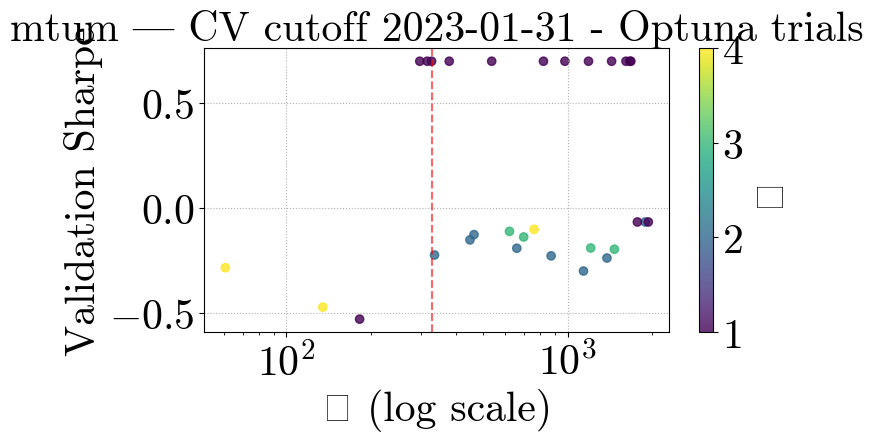

[I 2025-04-25 18:16:32,712] A new study created in memory with name: no-name-eebc382c-e27a-4375-a2ef-f840ab7242e7
[I 2025-04-25 18:16:39,369] Trial 0 finished with value: -0.0714629168933638 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.0714629168933638.
[I 2025-04-25 18:16:45,407] Trial 1 finished with value: -0.0714629168933638 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.0714629168933638.
[I 2025-04-25 18:16:47,750] Trial 2 finished with value: -0.016781320621411976 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.016781320621411976.
[I 2025-04-25 18:16:52,863] Trial 3 finished with value: 0.23220607970091567 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.23220607970091567.
[I 2025-04-25 18:16:58,911] Trial 4 finished with value: -0.0714629168933638 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Bes

Optuna best λ=36.6658, κ=4, Sharpe=0.5378


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


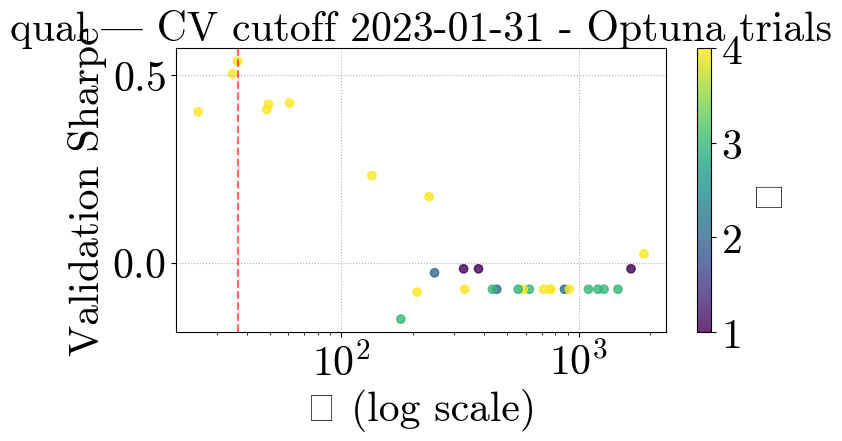

[I 2025-04-25 18:20:06,357] A new study created in memory with name: no-name-aea0ba0c-1ebc-4b66-b231-0e88947dec44
[I 2025-04-25 18:20:10,932] Trial 0 finished with value: 0.39011860460251546 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.39011860460251546.
[I 2025-04-25 18:20:14,402] Trial 1 finished with value: 0.3995084301720819 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.3995084301720819.
[I 2025-04-25 18:20:16,730] Trial 2 finished with value: 0.2331841576493521 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.3995084301720819.
[I 2025-04-25 18:20:26,397] Trial 3 finished with value: 0.24913310474652414 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.3995084301720819.
[I 2025-04-25 18:20:30,201] Trial 4 finished with value: 0.3995084301720819 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial

Optuna best λ=1664.2846, κ=1, Sharpe=0.4028


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


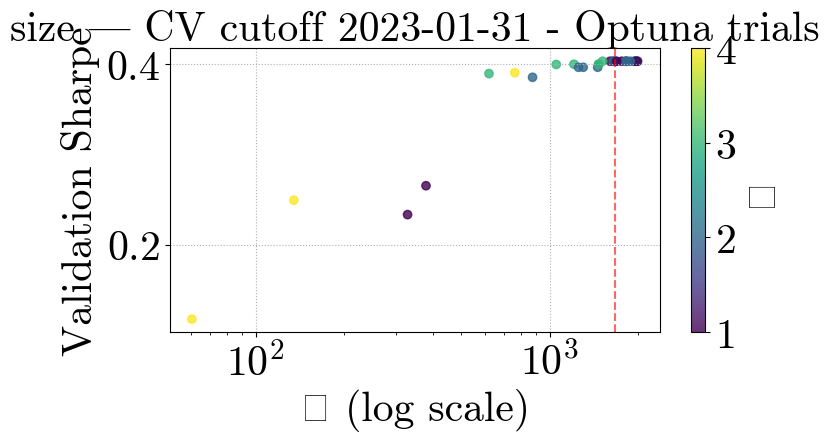

[I 2025-04-25 18:21:19,113] A new study created in memory with name: no-name-4e74486f-5cdb-4847-98d1-f2d488e0653e
[I 2025-04-25 18:21:22,093] Trial 0 finished with value: -0.7089920202365042 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.7089920202365042.
[I 2025-04-25 18:21:24,816] Trial 1 finished with value: -1.1260863009332893 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.7089920202365042.
[I 2025-04-25 18:21:27,005] Trial 2 finished with value: -0.32991837387359485 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.32991837387359485.
[I 2025-04-25 18:21:32,690] Trial 3 finished with value: -0.2151964725376979 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: -0.2151964725376979.
[I 2025-04-25 18:21:35,429] Trial 4 finished with value: -0.8181434709735229 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=178.4551, κ=3, Sharpe=0.2160


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


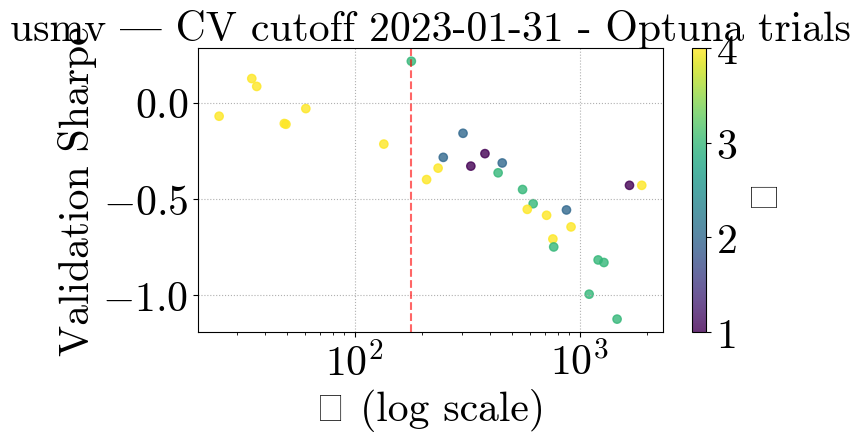

[I 2025-04-25 18:24:02,915] A new study created in memory with name: no-name-517b3205-0eb7-4962-a057-4d0ca9423f67
[I 2025-04-25 18:24:08,845] Trial 0 finished with value: -0.0019569169370638314 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.0019569169370638314.
[I 2025-04-25 18:24:09,659] Trial 1 finished with value: -0.12655293223341774 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.0019569169370638314.
[I 2025-04-25 18:24:12,212] Trial 2 finished with value: 0.6268933278893909 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.6268933278893909.
[I 2025-04-25 18:24:20,807] Trial 3 finished with value: 0.47239583227773135 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.6268933278893909.
[I 2025-04-25 18:24:21,573] Trial 4 finished with value: -0.12655293223341774 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}.

Optuna best λ=328.1378, κ=1, Sharpe=0.6269


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


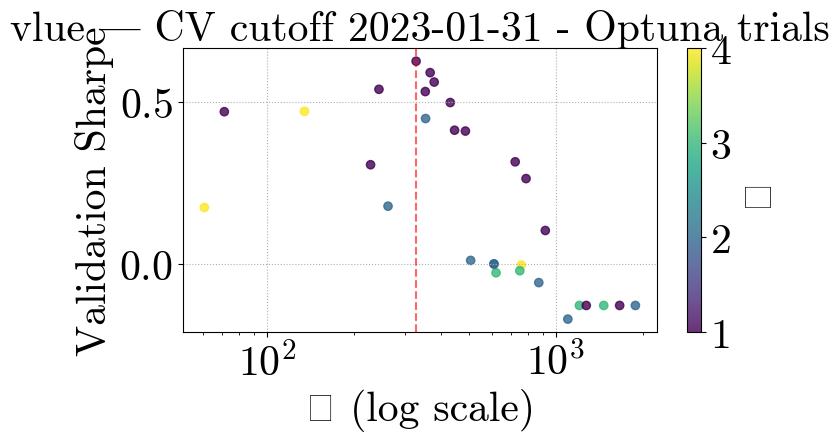

[I 2025-04-25 18:25:55,192] A new study created in memory with name: no-name-cba47508-85da-47d3-8b48-2e3192ba7c65
[I 2025-04-25 18:26:00,325] Trial 0 finished with value: -0.03744108287475048 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.03744108287475048.
[I 2025-04-25 18:26:01,094] Trial 1 finished with value: -0.0743560429757761 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.03744108287475048.
[I 2025-04-25 18:26:03,771] Trial 2 finished with value: -0.07866121602736972 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.03744108287475048.
[I 2025-04-25 18:26:11,385] Trial 3 finished with value: -0.17266318424066016 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: -0.03744108287475048.
[I 2025-04-25 18:26:12,344] Trial 4 finished with value: -0.0743560429757761 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. 

Optuna best λ=1184.8418, κ=2, Sharpe=0.0206


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


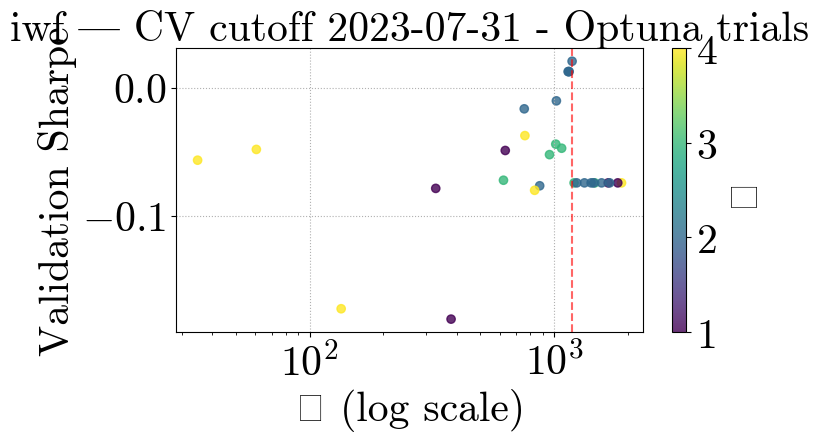

[I 2025-04-25 18:27:46,600] A new study created in memory with name: no-name-3bfe029b-28a5-40d9-b5a1-546dbad30173
[I 2025-04-25 18:27:49,041] Trial 0 finished with value: -0.07913752725140157 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.07913752725140157.
[I 2025-04-25 18:27:51,050] Trial 1 finished with value: -0.18880587553429196 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.07913752725140157.
[I 2025-04-25 18:27:54,227] Trial 2 finished with value: 0.6358015860640204 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.6358015860640204.
[I 2025-04-25 18:28:02,072] Trial 3 finished with value: -0.8063312953291094 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.6358015860640204.
[I 2025-04-25 18:28:04,055] Trial 4 finished with value: -0.24406009618662097 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=916.0984, κ=1, Sharpe=0.6358


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


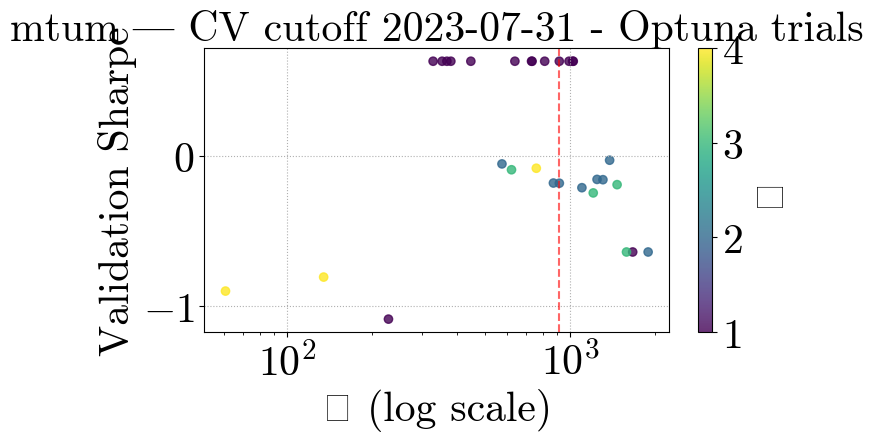

[I 2025-04-25 18:29:12,423] A new study created in memory with name: no-name-bf2d7767-5a3b-4cad-b40d-1e4925f69c01
[I 2025-04-25 18:29:20,074] Trial 0 finished with value: 0.3786184684003792 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.3786184684003792.
[I 2025-04-25 18:29:20,958] Trial 1 finished with value: 0.3786184684003791 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.3786184684003792.
[I 2025-04-25 18:29:23,689] Trial 2 finished with value: 0.10121628707880571 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.3786184684003792.
[I 2025-04-25 18:29:35,624] Trial 3 finished with value: 0.1601308289725897 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.3786184684003792.
[I 2025-04-25 18:29:43,935] Trial 4 finished with value: 0.3786184684003792 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0

Optuna best λ=24.5634, κ=3, Sharpe=0.5966


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


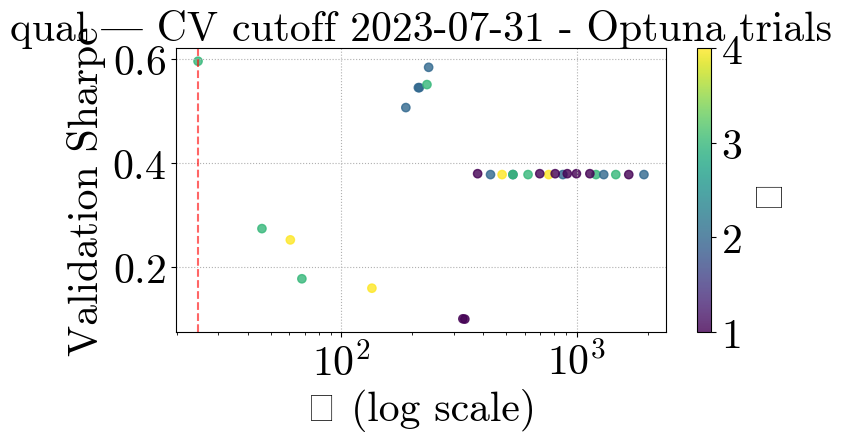

[I 2025-04-25 18:32:44,083] A new study created in memory with name: no-name-c4fd70ea-40bd-486e-9952-e9ba2096725c
[I 2025-04-25 18:32:47,503] Trial 0 finished with value: 0.3738652032305956 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.3738652032305956.
[I 2025-04-25 18:32:50,277] Trial 1 finished with value: 0.3738652032305956 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.3738652032305956.
[I 2025-04-25 18:32:54,100] Trial 2 finished with value: 0.3738652032305956 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.3738652032305956.
[I 2025-04-25 18:33:04,109] Trial 3 finished with value: 0.24005226086197726 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.3738652032305956.
[I 2025-04-25 18:33:07,136] Trial 4 finished with value: 0.3738652032305956 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0

Optuna best λ=759.7853, κ=4, Sharpe=0.3739


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


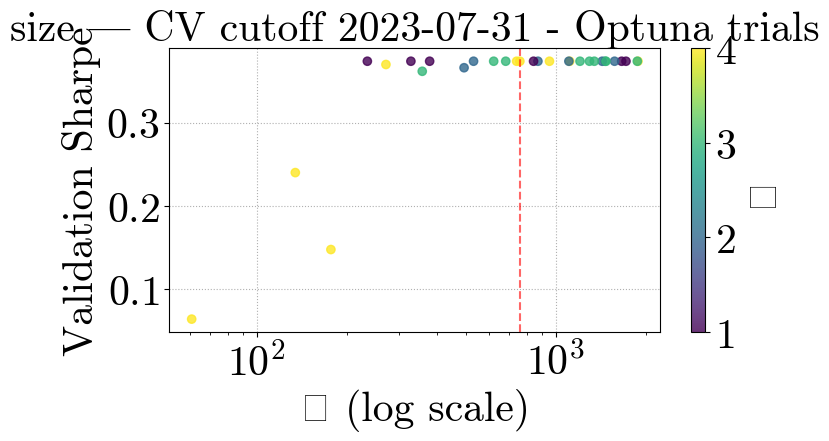

[I 2025-04-25 18:34:51,845] A new study created in memory with name: no-name-bf234055-be69-4eaa-ab5a-6658a085c5ed
[I 2025-04-25 18:34:55,533] Trial 0 finished with value: -0.01826784332398819 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.01826784332398819.
[I 2025-04-25 18:34:56,314] Trial 1 finished with value: -0.47934029258821326 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.01826784332398819.
[I 2025-04-25 18:34:59,198] Trial 2 finished with value: -0.46493488081539525 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.01826784332398819.
[I 2025-04-25 18:35:09,045] Trial 3 finished with value: 0.5400996578483219 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.5400996578483219.
[I 2025-04-25 18:35:10,021] Trial 4 finished with value: -0.47934029258821326 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Be

Optuna best λ=60.6134, κ=4, Sharpe=0.6099


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


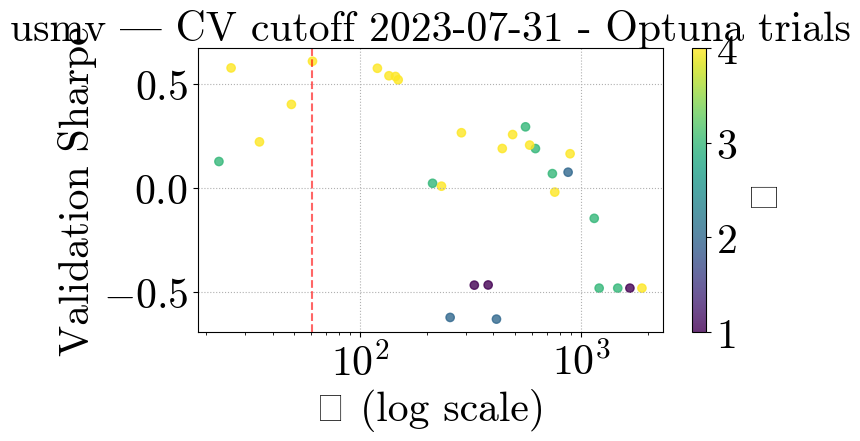

[I 2025-04-25 18:38:07,187] A new study created in memory with name: no-name-7930e9ef-22e8-427f-b664-8803e6680b3a
[I 2025-04-25 18:38:10,435] Trial 0 finished with value: -0.37908883025181933 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.37908883025181933.
[I 2025-04-25 18:38:11,156] Trial 1 finished with value: 0.09351987323163995 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.09351987323163995.
[I 2025-04-25 18:38:13,854] Trial 2 finished with value: -0.09722795744074676 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.09351987323163995.
[I 2025-04-25 18:38:24,845] Trial 3 finished with value: 0.1344381510582167 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.1344381510582167.
[I 2025-04-25 18:38:27,648] Trial 4 finished with value: -0.38434781284126684 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=48.6284, κ=4, Sharpe=0.8234


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


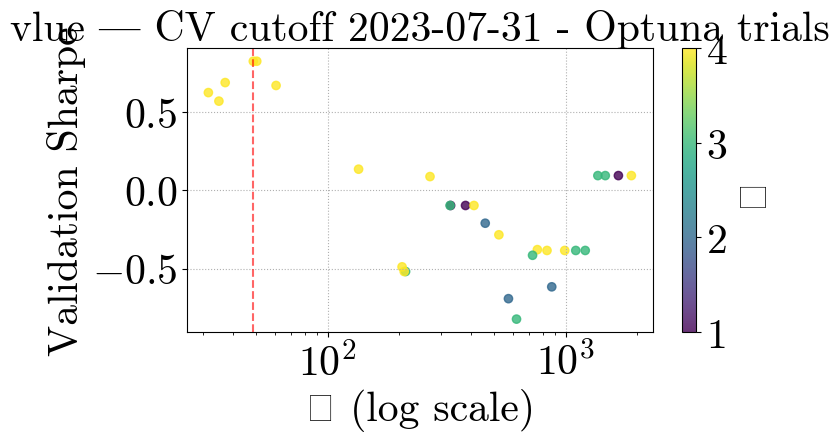

[I 2025-04-25 18:40:59,198] A new study created in memory with name: no-name-bab872f6-146f-4b4e-aad7-69e0a98abc61
[I 2025-04-25 18:41:04,405] Trial 0 finished with value: -0.22297118932613083 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.22297118932613083.
[I 2025-04-25 18:41:09,049] Trial 1 finished with value: -0.2963475642621043 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.22297118932613083.
[I 2025-04-25 18:41:11,719] Trial 2 finished with value: -0.04409309326918339 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.04409309326918339.
[I 2025-04-25 18:41:18,251] Trial 3 finished with value: -0.14885051736652483 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: -0.04409309326918339.
[I 2025-04-25 18:41:23,075] Trial 4 finished with value: -0.2677574683907892 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. 

Optuna best λ=1664.2846, κ=1, Sharpe=0.1962


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


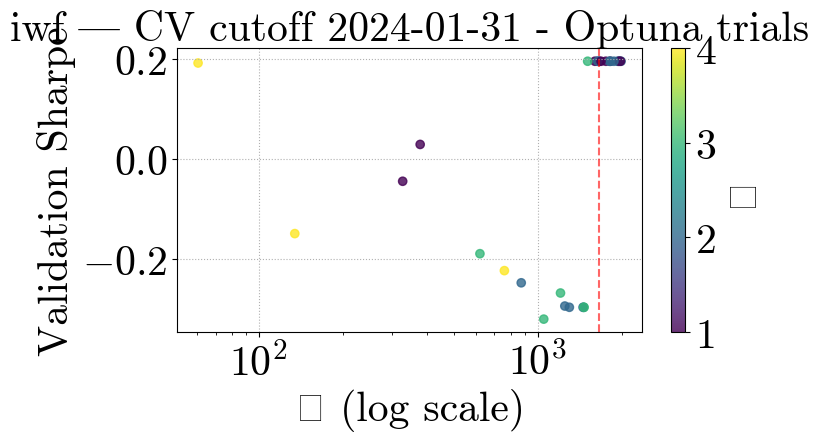

[I 2025-04-25 18:42:25,986] A new study created in memory with name: no-name-783167e9-ad22-4af6-9df5-3a1b1be07e36
[I 2025-04-25 18:42:30,348] Trial 0 finished with value: -0.4620105884830408 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.4620105884830408.
[I 2025-04-25 18:42:31,196] Trial 1 finished with value: -0.5070749942035578 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.4620105884830408.
[I 2025-04-25 18:42:34,313] Trial 2 finished with value: -0.4162165700977735 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.4162165700977735.
[I 2025-04-25 18:42:41,778] Trial 3 finished with value: -0.6534179782767502 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: -0.4162165700977735.
[I 2025-04-25 18:42:45,509] Trial 4 finished with value: -0.4620105884830408 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=328.1378, κ=1, Sharpe=-0.4162


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


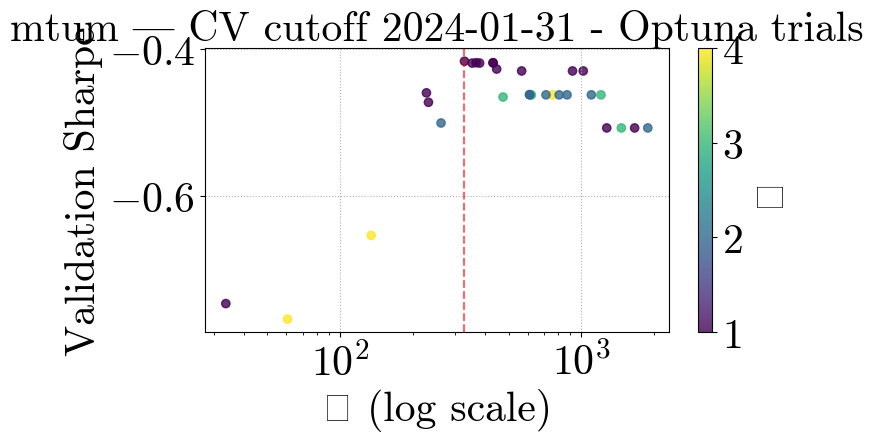

[I 2025-04-25 18:44:18,185] A new study created in memory with name: no-name-69f0155e-e525-4df3-a756-0e22bd5c751b
[I 2025-04-25 18:44:21,340] Trial 0 finished with value: 0.05752699261526524 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.05752699261526524.
[I 2025-04-25 18:44:22,107] Trial 1 finished with value: 1.01380203403842 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 1.01380203403842.
[I 2025-04-25 18:44:24,853] Trial 2 finished with value: -1.0624287228861684 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 1.01380203403842.
[I 2025-04-25 18:44:32,565] Trial 3 finished with value: 0.07233839130775109 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 1.01380203403842.
[I 2025-04-25 18:44:33,285] Trial 4 finished with value: 1.01380203403842 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 1 with v

Optuna best λ=1465.8674, κ=3, Sharpe=1.0138


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


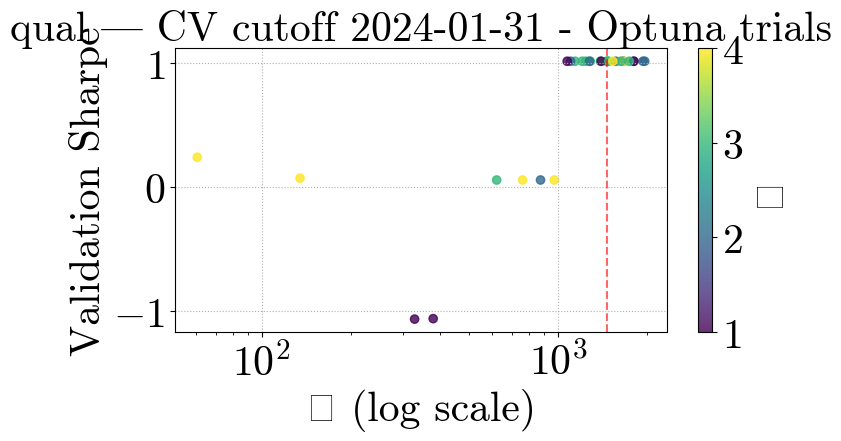

[I 2025-04-25 18:45:14,486] A new study created in memory with name: no-name-c154f4ac-8b68-497e-8331-68eb840ad392
[I 2025-04-25 18:45:15,479] Trial 0 finished with value: 0.4276757978329341 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.4276757978329341.
[I 2025-04-25 18:45:16,291] Trial 1 finished with value: 0.4276757978329341 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.4276757978329341.
[I 2025-04-25 18:45:19,201] Trial 2 finished with value: 0.20409103343609034 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.4276757978329341.
[I 2025-04-25 18:45:27,888] Trial 3 finished with value: 0.26869398032319447 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.4276757978329341.
[I 2025-04-25 18:45:28,635] Trial 4 finished with value: 0.4276757978329341 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 

Optuna best λ=759.7853, κ=4, Sharpe=0.4277


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


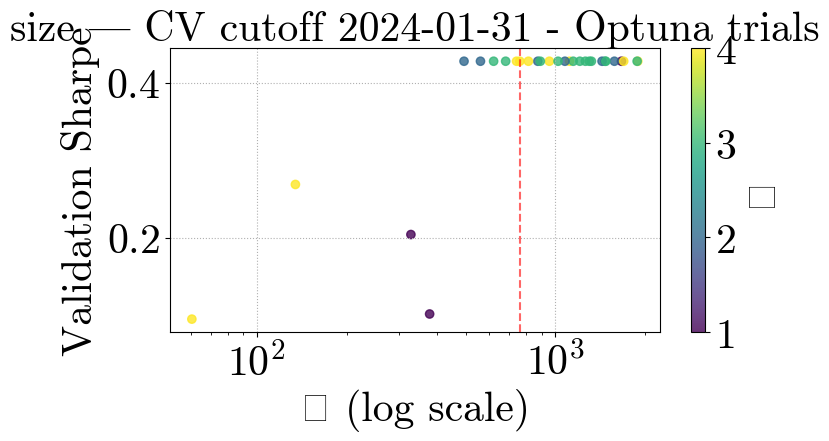

[I 2025-04-25 18:46:06,833] A new study created in memory with name: no-name-41ba069c-4b1c-4981-8262-ba8d44e7a7df
[I 2025-04-25 18:46:07,820] Trial 0 finished with value: -0.02505419168673884 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.02505419168673884.
[I 2025-04-25 18:46:08,506] Trial 1 finished with value: -0.02505419168673884 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.02505419168673884.
[I 2025-04-25 18:46:10,564] Trial 2 finished with value: -0.3101089670821021 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: -0.02505419168673884.
[I 2025-04-25 18:46:19,148] Trial 3 finished with value: 0.47843210982096185 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.47843210982096185.
[I 2025-04-25 18:46:19,893] Trial 4 finished with value: -0.02505419168673884 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. B

Optuna best λ=144.2199, κ=4, Sharpe=0.6949


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


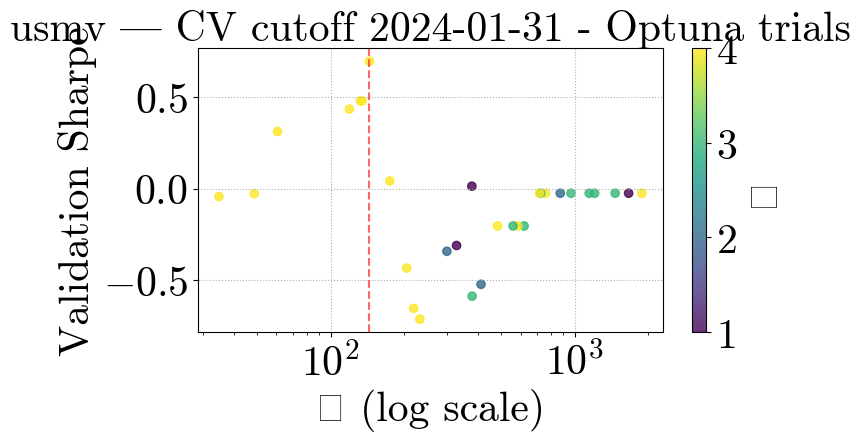

[I 2025-04-25 18:48:23,698] A new study created in memory with name: no-name-34e4e796-b551-4014-8481-00cabfd4ffd6
[I 2025-04-25 18:48:27,223] Trial 0 finished with value: 0.3761671553097774 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.3761671553097774.
[I 2025-04-25 18:48:28,108] Trial 1 finished with value: -0.17380597687072513 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.3761671553097774.
[I 2025-04-25 18:48:30,761] Trial 2 finished with value: 0.16953800894166177 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.3761671553097774.
[I 2025-04-25 18:48:40,607] Trial 3 finished with value: -0.09735145309114847 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.3761671553097774.
[I 2025-04-25 18:48:41,337] Trial 4 finished with value: -0.17380597687072513 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is t

Optuna best λ=22.9761, κ=3, Sharpe=0.9165


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


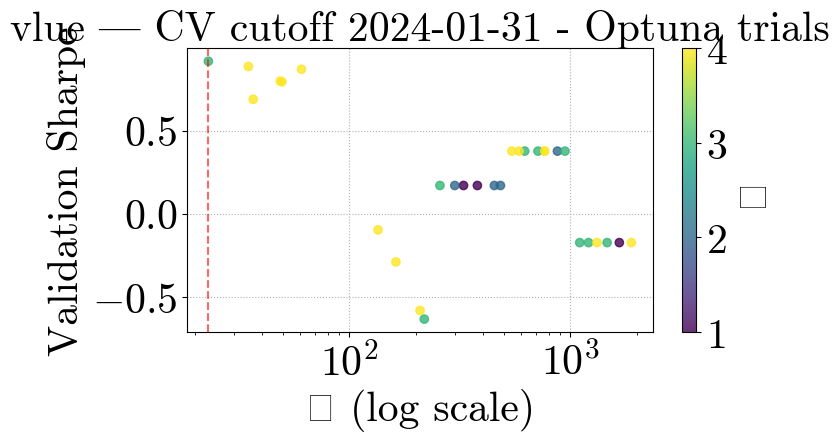

[I 2025-04-25 18:51:10,449] A new study created in memory with name: no-name-9307a5a8-727e-4bb6-b590-f15a6aa550fd
[I 2025-04-25 18:51:12,692] Trial 0 finished with value: 0.09899064385197162 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.09899064385197162.
[I 2025-04-25 18:51:13,448] Trial 1 finished with value: 0.20880011269936552 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.20880011269936552.
[I 2025-04-25 18:51:15,624] Trial 2 finished with value: 0.274570006791672 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.274570006791672.
[I 2025-04-25 18:51:21,138] Trial 3 finished with value: 0.20631508620903752 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.274570006791672.
[I 2025-04-25 18:51:23,878] Trial 4 finished with value: 0.20880011269936566 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial

Optuna best λ=296.7540, κ=1, Sharpe=0.2966


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


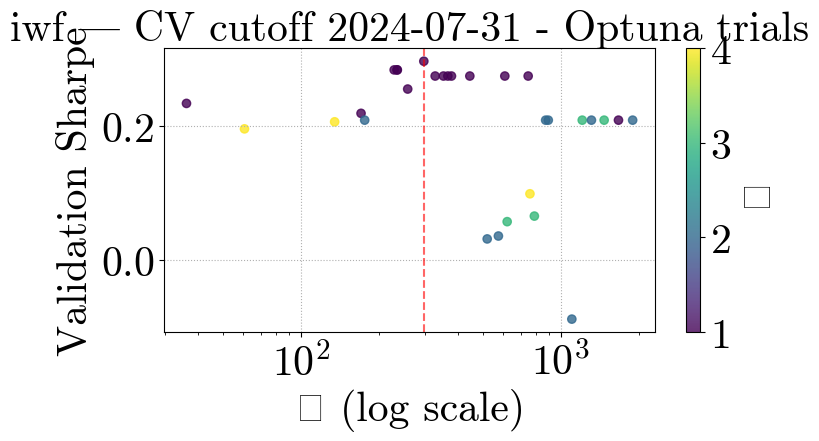

[I 2025-04-25 18:52:42,136] A new study created in memory with name: no-name-f5fcf8d5-4686-4f9b-87fb-da487ae2037a
[I 2025-04-25 18:52:46,045] Trial 0 finished with value: 0.4932603025490822 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.4932603025490822.
[I 2025-04-25 18:52:46,779] Trial 1 finished with value: -0.2025997329928341 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.4932603025490822.
[I 2025-04-25 18:52:49,249] Trial 2 finished with value: 0.5433221374640567 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.5433221374640567.
[I 2025-04-25 18:52:55,592] Trial 3 finished with value: 0.25449322882281766 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.5433221374640567.
[I 2025-04-25 18:52:56,348] Trial 4 finished with value: -0.2025997329928341 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial

Optuna best λ=706.6363, κ=3, Sharpe=0.5802


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


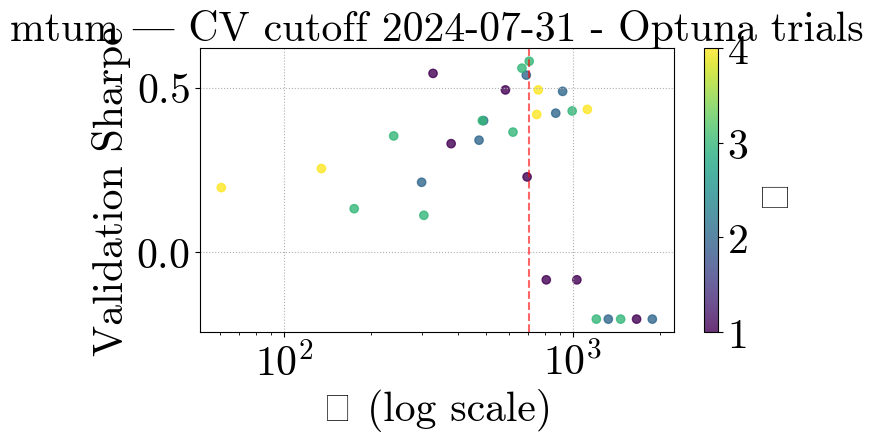

[I 2025-04-25 18:54:29,141] A new study created in memory with name: no-name-67576b93-fd60-42ce-8c10-2407ab9baf34
[I 2025-04-25 18:54:32,046] Trial 0 finished with value: 0.03468072471299802 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.03468072471299802.
[I 2025-04-25 18:54:32,687] Trial 1 finished with value: 0.5928685000375308 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.5928685000375308.
[I 2025-04-25 18:54:35,005] Trial 2 finished with value: -0.21953887066342243 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.5928685000375308.
[I 2025-04-25 18:54:43,200] Trial 3 finished with value: 0.081151204342117 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.5928685000375308.
[I 2025-04-25 18:54:43,945] Trial 4 finished with value: 0.5928685000375308 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial

Optuna best λ=882.8595, κ=2, Sharpe=0.7045


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


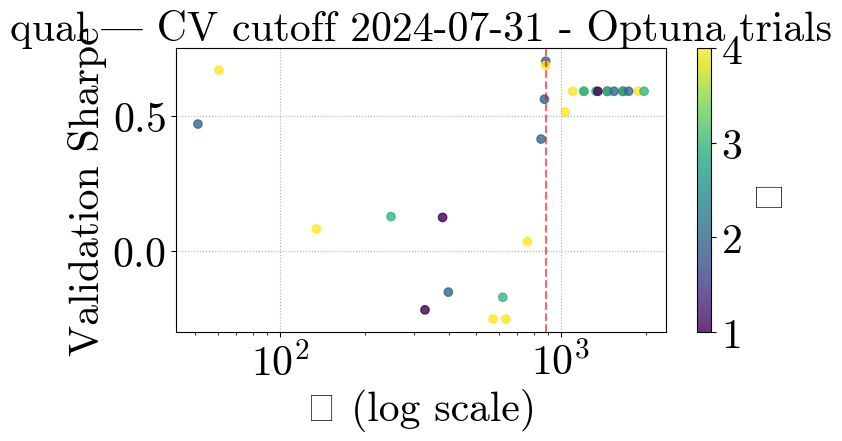

[I 2025-04-25 18:55:49,002] A new study created in memory with name: no-name-ee3143a5-c6af-4ff7-8846-52eb9c35368f
[I 2025-04-25 18:55:49,894] Trial 0 finished with value: 0.5016526607787629 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.5016526607787629.
[I 2025-04-25 18:55:50,565] Trial 1 finished with value: 0.5016526607787629 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.5016526607787629.
[I 2025-04-25 18:55:53,055] Trial 2 finished with value: 0.5016526607787629 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.5016526607787629.
[I 2025-04-25 18:56:03,436] Trial 3 finished with value: 0.44206855825177127 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.5016526607787629.
[I 2025-04-25 18:56:04,104] Trial 4 finished with value: 0.5016526607787629 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0

Optuna best λ=358.1333, κ=3, Sharpe=0.5082


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


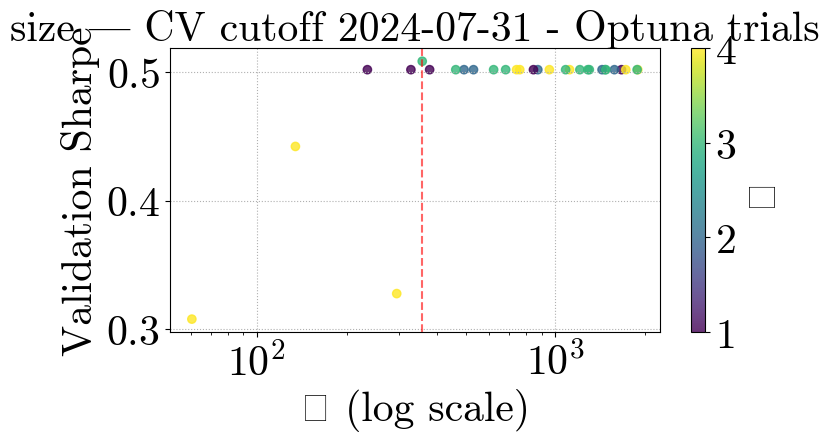

[I 2025-04-25 18:56:54,322] A new study created in memory with name: no-name-c4a2c500-b1f5-4193-8ddf-8fdbaee31fae
[I 2025-04-25 18:56:58,251] Trial 0 finished with value: -0.508270496641711 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.508270496641711.
[I 2025-04-25 18:56:58,945] Trial 1 finished with value: 0.15576598468135394 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.15576598468135394.
[I 2025-04-25 18:57:01,188] Trial 2 finished with value: -0.556491695555243 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.15576598468135394.
[I 2025-04-25 18:57:11,370] Trial 3 finished with value: 0.5418911777861923 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.5418911777861923.
[I 2025-04-25 18:57:12,139] Trial 4 finished with value: 0.15576598468135394 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tria

Optuna best λ=162.7424, κ=4, Sharpe=0.7401


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


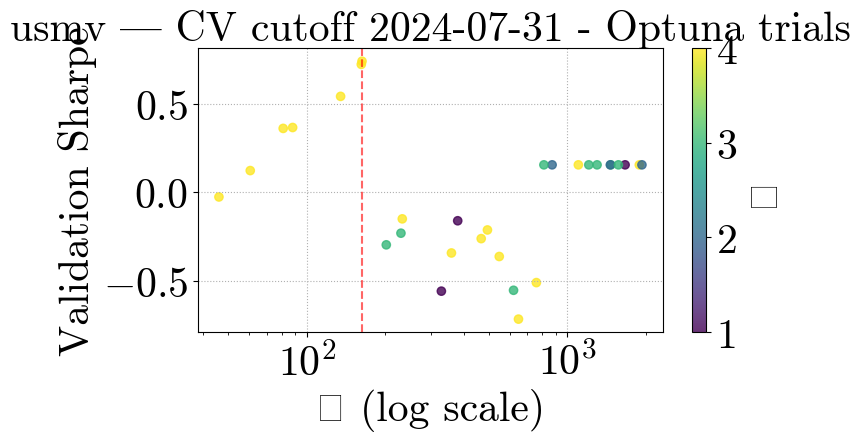

[I 2025-04-25 18:59:03,609] A new study created in memory with name: no-name-1b8e6a5b-de34-4c5f-a6dc-31ae2120ce4b
[I 2025-04-25 18:59:07,079] Trial 0 finished with value: 0.37265053464574743 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.37265053464574743.
[I 2025-04-25 18:59:07,807] Trial 1 finished with value: 0.3726505346457475 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.3726505346457475.
[I 2025-04-25 18:59:10,414] Trial 2 finished with value: -0.37923126863966616 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.3726505346457475.
[I 2025-04-25 18:59:18,320] Trial 3 finished with value: -0.2986692355762565 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.3726505346457475.
[I 2025-04-25 18:59:19,126] Trial 4 finished with value: 0.3726505346457475 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tri

Optuna best λ=41.3120, κ=2, Sharpe=0.8948


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


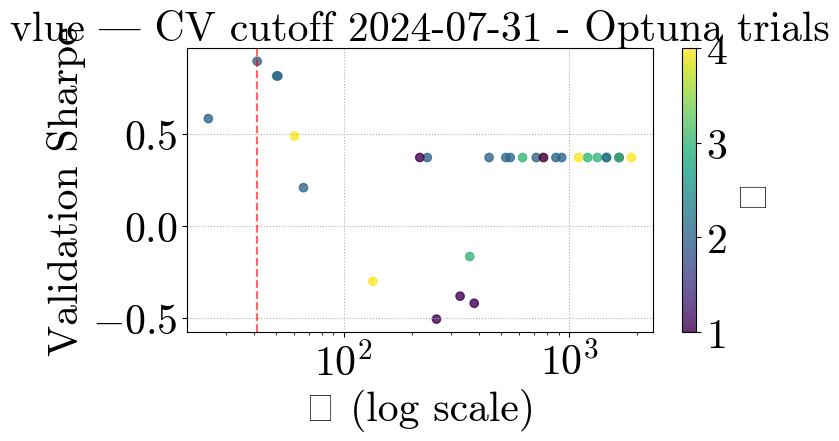

[I 2025-04-25 19:01:46,465] A new study created in memory with name: no-name-371815c2-e6fe-4bfd-ac9b-b62cc35108fd
[I 2025-04-25 19:01:49,028] Trial 0 finished with value: 0.6141265192176588 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.6141265192176588.
[I 2025-04-25 19:01:51,893] Trial 1 finished with value: 0.6516949911473461 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.6516949911473461.
[I 2025-04-25 19:01:54,209] Trial 2 finished with value: 0.651694991147346 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.6516949911473461.
[I 2025-04-25 19:01:57,749] Trial 3 finished with value: 0.5790208351087495 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.6516949911473461.
[I 2025-04-25 19:02:00,619] Trial 4 finished with value: 0.6516949911473461 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 1 w

Optuna best λ=1465.8674, κ=3, Sharpe=0.6517


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


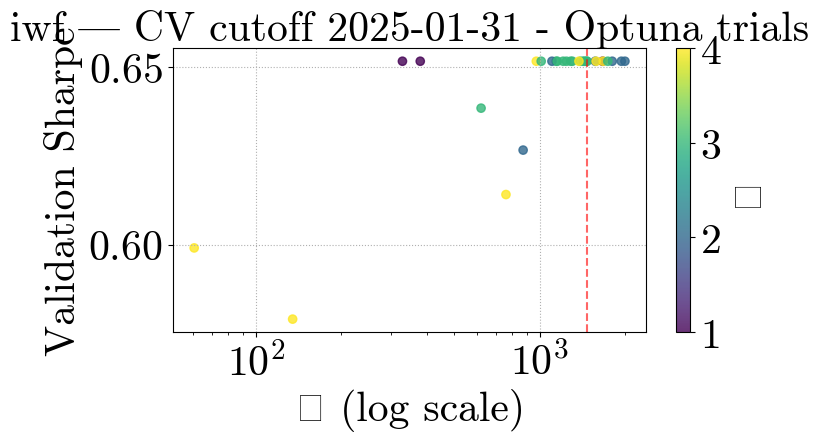

[I 2025-04-25 19:03:10,351] A new study created in memory with name: no-name-bed64547-24e8-407e-93ca-aab188515353
[I 2025-04-25 19:03:14,135] Trial 0 finished with value: -0.05058700596387608 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.05058700596387608.
[I 2025-04-25 19:03:14,838] Trial 1 finished with value: 0.17803447306912737 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.17803447306912737.
[I 2025-04-25 19:03:17,719] Trial 2 finished with value: 0.36488321482183256 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.36488321482183256.
[I 2025-04-25 19:03:27,303] Trial 3 finished with value: -0.3166088123696474 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 2 with value: 0.36488321482183256.
[I 2025-04-25 19:03:28,047] Trial 4 finished with value: 0.17803447306912737 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best 

Optuna best λ=205.5364, κ=1, Sharpe=0.4399


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


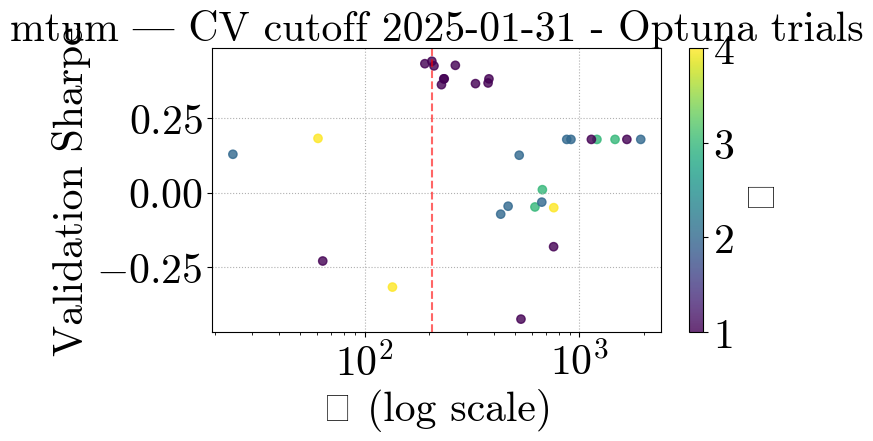

[I 2025-04-25 19:04:55,114] A new study created in memory with name: no-name-ff3129f2-c426-4020-a797-a4944c89852b
[I 2025-04-25 19:04:58,118] Trial 0 finished with value: 0.6027661510375714 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.6027661510375714.
[I 2025-04-25 19:04:58,800] Trial 1 finished with value: 0.547595836272767 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.6027661510375714.
[I 2025-04-25 19:05:00,962] Trial 2 finished with value: 0.010639249564372464 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.6027661510375714.
[I 2025-04-25 19:05:09,307] Trial 3 finished with value: 0.15267542123002864 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.6027661510375714.
[I 2025-04-25 19:05:09,991] Trial 4 finished with value: 0.547595836272767 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0

Optuna best λ=785.3608, κ=4, Sharpe=0.7311


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


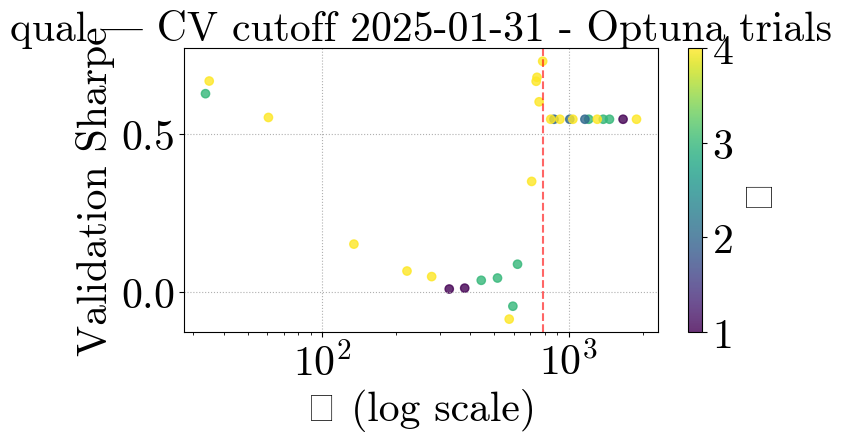

[I 2025-04-25 19:06:29,081] A new study created in memory with name: no-name-1dcb635b-e23b-457f-ad02-a5dfce50836b
[I 2025-04-25 19:06:29,939] Trial 0 finished with value: 0.5811208074232763 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.5811208074232763.
[I 2025-04-25 19:06:30,617] Trial 1 finished with value: 0.5811208074232763 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.5811208074232763.
[I 2025-04-25 19:06:32,976] Trial 2 finished with value: 0.5811208074232763 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.5811208074232763.
[I 2025-04-25 19:06:43,249] Trial 3 finished with value: 0.5285843349568051 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.5811208074232763.
[I 2025-04-25 19:06:43,918] Trial 4 finished with value: 0.5811208074232763 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 0 

Optuna best λ=759.7853, κ=4, Sharpe=0.5811


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


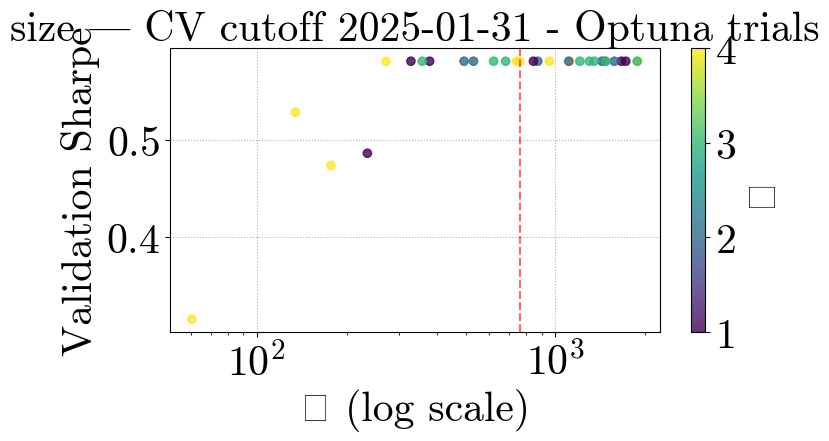

[I 2025-04-25 19:07:39,116] A new study created in memory with name: no-name-ae6c5cd3-64cf-4775-8bc4-bf08be0329bf
[I 2025-04-25 19:07:42,670] Trial 0 finished with value: 0.21901819379504303 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.21901819379504303.
[I 2025-04-25 19:07:43,386] Trial 1 finished with value: 0.3184068346392206 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.3184068346392206.
[I 2025-04-25 19:07:45,955] Trial 2 finished with value: 0.31840683463922065 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: 0.31840683463922065.
[I 2025-04-25 19:07:51,073] Trial 3 finished with value: 0.8302579328357325 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.8302579328357325.
[I 2025-04-25 19:07:51,852] Trial 4 finished with value: 0.3184068346392206 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tria

Optuna best λ=168.8178, κ=4, Sharpe=0.9147


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


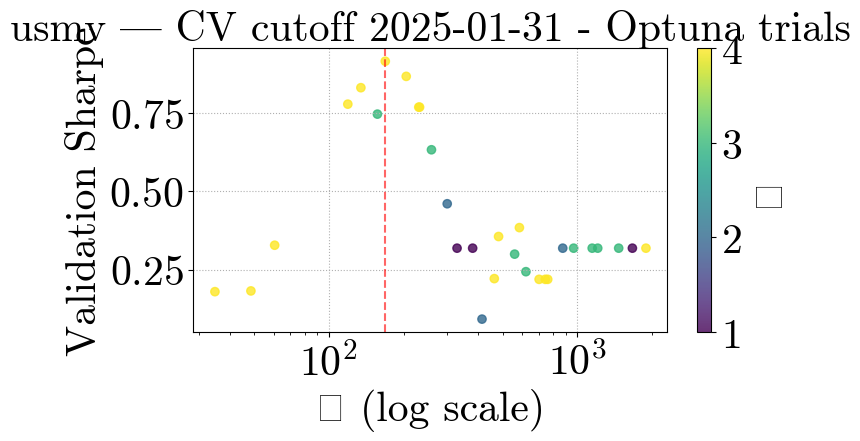

[I 2025-04-25 19:09:46,416] A new study created in memory with name: no-name-214c66ea-aef4-481d-8bc8-8c7be089c970
[I 2025-04-25 19:09:50,237] Trial 0 finished with value: 0.8711954710458099 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.8711954710458099.
[I 2025-04-25 19:09:51,037] Trial 1 finished with value: -0.8755278009623808 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.8711954710458099.
[I 2025-04-25 19:09:53,613] Trial 2 finished with value: 0.8711954710458099 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.8711954710458099.
[I 2025-04-25 19:09:58,850] Trial 3 finished with value: -0.8300652642680509 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.8711954710458099.
[I 2025-04-25 19:09:59,681] Trial 4 finished with value: -0.8755278009623808 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial

Optuna best λ=759.7853, κ=4, Sharpe=0.8712


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


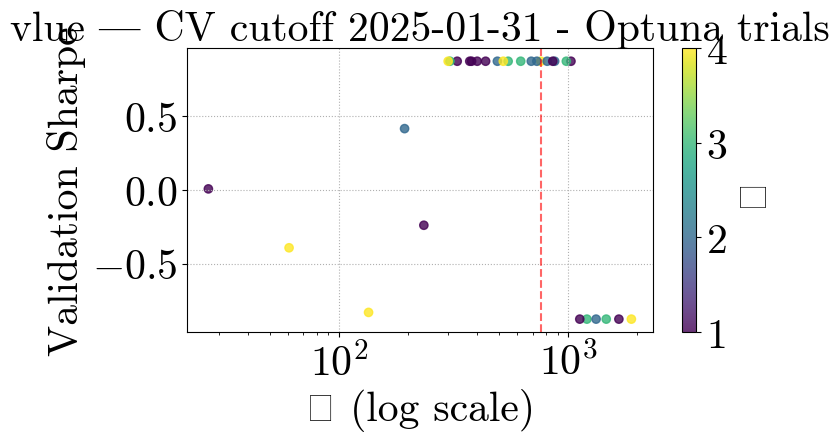

[I 2025-04-25 19:11:33,791] A new study created in memory with name: no-name-5e8e00ec-2ca8-4c27-a1d8-f727bfa42ab5
[I 2025-04-25 19:11:37,105] Trial 0 finished with value: 0.48673403853758235 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.48673403853758235.
[I 2025-04-25 19:11:37,953] Trial 1 finished with value: 0.4867340385375826 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.4867340385375826.
[I 2025-04-25 19:11:40,367] Trial 2 finished with value: 0.48673403853758235 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.4867340385375826.
[I 2025-04-25 19:11:45,012] Trial 3 finished with value: 0.48673403853758235 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.4867340385375826.
[I 2025-04-25 19:11:47,691] Trial 4 finished with value: 0.48673403853758235 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is tri

Optuna best λ=60.6134, κ=4, Sharpe=0.7222


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


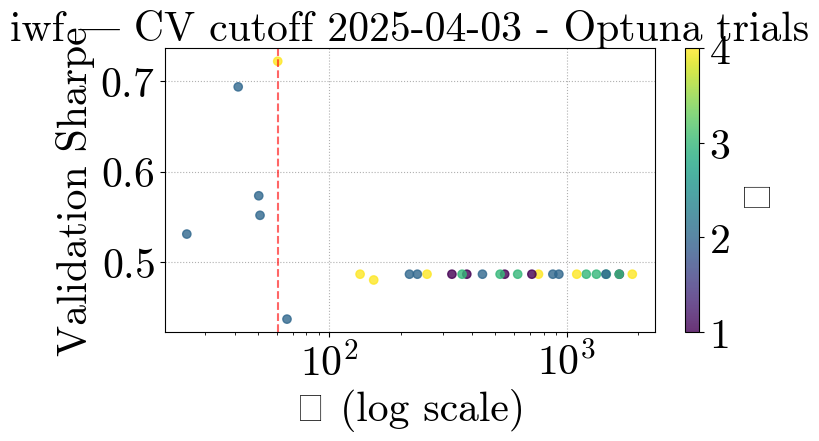

[I 2025-04-25 19:15:15,443] A new study created in memory with name: no-name-5b2ef5ca-8535-4d0e-b7b1-e41e29f225a1
[I 2025-04-25 19:15:19,031] Trial 0 finished with value: -0.2790662837784944 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.2790662837784944.
[I 2025-04-25 19:15:19,751] Trial 1 finished with value: 0.19532382908230217 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.19532382908230217.
[I 2025-04-25 19:15:22,387] Trial 2 finished with value: -0.2871841859458547 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.19532382908230217.
[I 2025-04-25 19:15:34,435] Trial 3 finished with value: -0.09906561404623522 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.19532382908230217.
[I 2025-04-25 19:15:35,195] Trial 4 finished with value: 0.19532382908230217 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best i

Optuna best λ=1465.8674, κ=3, Sharpe=0.1953


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


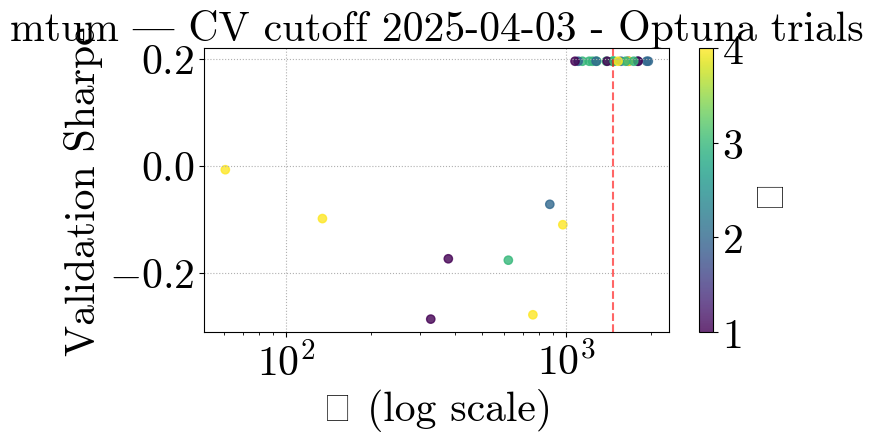

[I 2025-04-25 19:16:15,559] A new study created in memory with name: no-name-467920dc-a222-43ef-b128-3e1bf8cc91f3
[I 2025-04-25 19:16:16,627] Trial 0 finished with value: 0.7199091091126918 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.7199091091126918.
[I 2025-04-25 19:16:17,432] Trial 1 finished with value: 0.7199091091126918 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.7199091091126918.
[I 2025-04-25 19:16:20,349] Trial 2 finished with value: -0.1561864647345859 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.7199091091126918.
[I 2025-04-25 19:16:29,777] Trial 3 finished with value: 0.31043714473952744 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.7199091091126918.
[I 2025-04-25 19:16:30,560] Trial 4 finished with value: 0.7199091091126918 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is trial 

Optuna best λ=620.9253, κ=3, Sharpe=0.9169


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


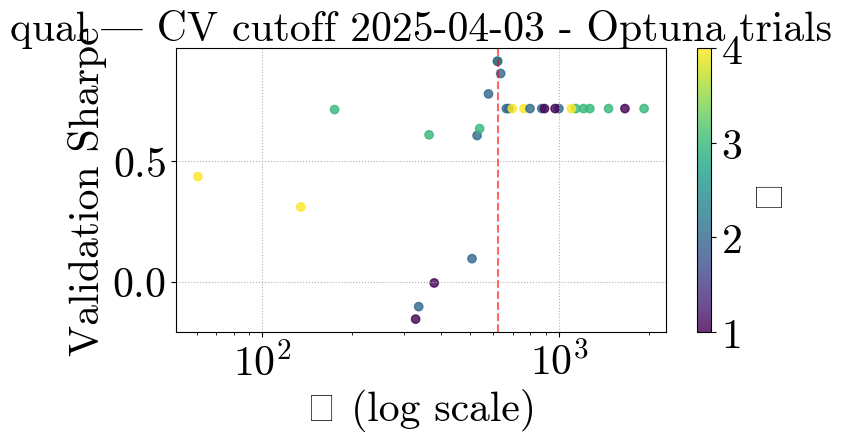

[I 2025-04-25 19:17:40,996] A new study created in memory with name: no-name-f9675bd9-d71c-4a07-8abd-b06d117cda90
[I 2025-04-25 19:17:41,975] Trial 0 finished with value: 0.19777318714965603 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.19777318714965603.
[I 2025-04-25 19:17:42,730] Trial 1 finished with value: 0.19777318714965603 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: 0.19777318714965603.
[I 2025-04-25 19:17:45,693] Trial 2 finished with value: 0.19777318714965603 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 0 with value: 0.19777318714965603.
[I 2025-04-25 19:17:54,852] Trial 3 finished with value: 0.15482302893843553 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 0 with value: 0.19777318714965603.
[I 2025-04-25 19:17:55,597] Trial 4 finished with value: 0.19777318714965603 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=759.7853, κ=4, Sharpe=0.1978


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


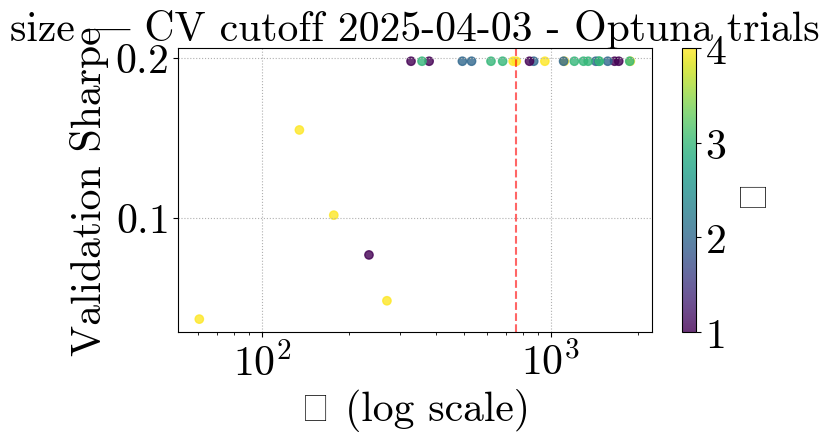

[I 2025-04-25 19:18:58,815] A new study created in memory with name: no-name-cc4ef84b-3940-47c7-aed6-d908b6d7d9be
[I 2025-04-25 19:18:59,765] Trial 0 finished with value: -0.03736351829413695 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: -0.03736351829413695.
[I 2025-04-25 19:19:00,490] Trial 1 finished with value: -0.03736351829413695 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 0 with value: -0.03736351829413695.
[I 2025-04-25 19:19:03,242] Trial 2 finished with value: -0.03736351829413684 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 2 with value: -0.03736351829413684.
[I 2025-04-25 19:19:10,179] Trial 3 finished with value: 0.6467231071958541 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 3 with value: 0.6467231071958541.
[I 2025-04-25 19:19:10,945] Trial 4 finished with value: -0.03736351829413695 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Be

Optuna best λ=144.2199, κ=4, Sharpe=0.7225


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


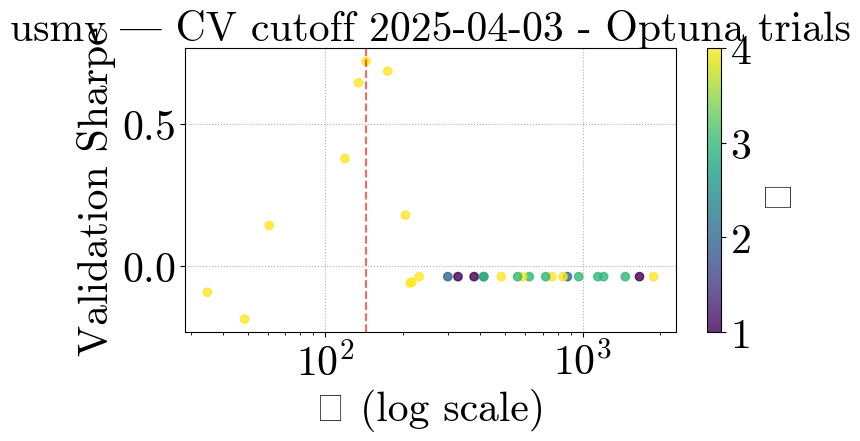

[I 2025-04-25 19:21:26,133] A new study created in memory with name: no-name-c50309ca-58ad-4525-8b6f-b5c268cc3512
[I 2025-04-25 19:21:29,584] Trial 0 finished with value: 0.48073956096553017 and parameters: {'lambda': 759.7853498839952, 'kappa': 4}. Best is trial 0 with value: 0.48073956096553017.
[I 2025-04-25 19:21:30,253] Trial 1 finished with value: 0.48073956096553044 and parameters: {'lambda': 1465.8673507626895, 'kappa': 3}. Best is trial 1 with value: 0.48073956096553044.
[I 2025-04-25 19:21:33,256] Trial 2 finished with value: 0.10802036761171008 and parameters: {'lambda': 328.1377557200871, 'kappa': 1}. Best is trial 1 with value: 0.48073956096553044.
[I 2025-04-25 19:21:40,316] Trial 3 finished with value: -0.9997511055137089 and parameters: {'lambda': 134.68574520140024, 'kappa': 4}. Best is trial 1 with value: 0.48073956096553044.
[I 2025-04-25 19:21:40,991] Trial 4 finished with value: 0.48073956096553044 and parameters: {'lambda': 1207.3409317440555, 'kappa': 3}. Best is

Optuna best λ=1465.8674, κ=3, Sharpe=0.4807


C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  plt.tight_layout()
C:\Users\victo\AppData\Local\Temp\ipykernel_20384\2795865056.py:97: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 955 (\N{GREEK SMALL LETTER LAMDA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


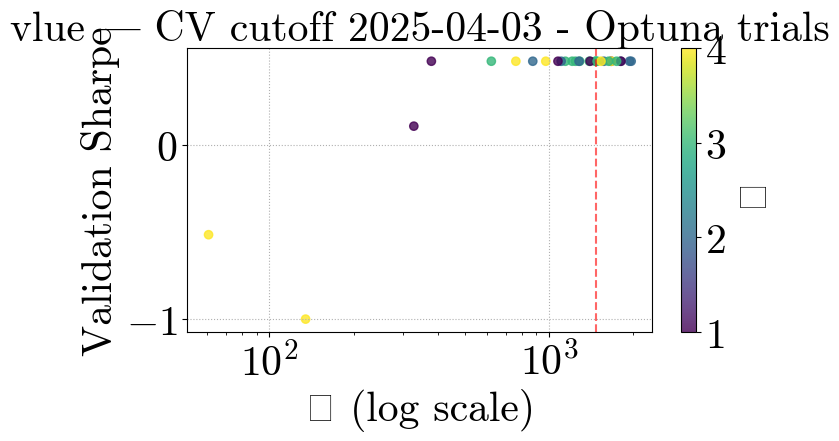

NameError: name 'assemble' is not defined

In [ ]:
# -------------------------  QUICK STAND‑ALONE RUN  ----------------------- #
# ---- user‑specific setup (exactly as in your original script) -------- #

# Paths & tickers -----------------------------------------------------------------------
TEST_START       = "2014-01-01"
RECROSS_VAL_FREQ = "6ME"          # six‑month‑end


script_dir = os.getcwd()
base_dir   = os.path.abspath(os.path.join(script_dir, "..", ".."))
data_dir   = os.path.join(base_dir, "data_new")

factor_file = os.path.join(data_dir, "1estimation_index_returns.csv")
market_file = os.path.join(data_dir, "1macro_data.csv")
etf_file    = os.path.join(data_dir, "2trading_etf_returns_aligned.csv")

factors = ["iwf", "mtum", "qual", "size", "usmv", "vlue"]   

lambda_values = np.linspace(30, 400, 5)
# kappa grid can depend on feature count; a simple fixed grid is fine
kappa_values  = np.array([2.0, 3.0, 4.0]) # kappa = trial.suggest_int("kappa", 1, np.sqrt(17))

# ------- load full data into factor_data_dict here -------------------- #
# (use your existing MergedDataLoader logic)
factor_data_dict = {}
for fac in factors:
    data = MergedDataLoader(
                factor_file=factor_file,
                market_file=market_file,
                ver="v2",
                factor_col=fac).load()

    common_idx = (data.X.index
                    .intersection(data.ret_ser.index)
                    .intersection(data.market_ser.index))

    factor_data_dict[fac] = {
        "X":       data.X.loc[common_idx],
        "fac_ret": data.ret_ser.loc[common_idx],
        "mkt_ret": data.market_ser.loc[common_idx],
    }


master_index = factor_data_dict[factors[0]]["X"].index.sort_values()
test_index   = master_index[master_index >= TEST_START]

recross_val_boundaries = (
    test_index.to_series()
    .resample(RECROSS_VAL_FREQ)
    .last()
    .dropna()                     # Series of Timestamp objects
)
# ----------------------------------------------------------------------

cv_table = run_cv(
    factors,
    factor_data_dict,
    cv_dates=recross_val_boundaries,
    initial_train_start="2002-05-31"
)

print("Saved tuned parameters to cv_params.parquet")
print(cv_table.head())

In [ ]:
# # 1) Cast kappa to float
# cv_table["best_kappa"] = cv_table["best_kappa"].astype(float)

# # 2) (Optional) verify
# print(cv_table.dtypes)

# # 3) Save out
# cv_table.to_parquet("cv_params_bayes_v2.parquet", index=False) # v2 is the one searching from 0.1 to 1000


date           datetime64[ns]
factor                 object
best_lambda           float64
best_kappa            float64
dtype: object


In [5]:
with open("cell_output.txt", "w") as f:
    for r in records:  # or whatever your output list is
        f.write(str(r) + "\n")


NameError: name 'records' is not defined